Evan Heeg

Import Necessary Packages for Code

In [326]:
import scipy.io as sio
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
from os import chdir
import pandas as pd
from datetime import datetime
from sklearn.linear_model import LinearRegression 
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
import os
import matplotlib.dates as mdates
import seaborn as sns
#import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib.pyplot import plot, show, savefig, xlim, figure, \
                ylim, legend, boxplot, setp, axes
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
import glob
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score
from matplotlib.lines import Line2D
from matplotlib.legend_handler import HandlerTuple
import matplotlib.patches as patches
import cartopy.crs as ccrs
from matplotlib.animation import FuncAnimation

Bring Epic GeoData Into Data Frames

In [327]:
data_frame_2022 = pd.DataFrame()
content = []

for i in ['01','02','03','04','05','06','07','08','09','10','11','12']:
    path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/Geo2022/2022_"+i+"_GeoData/"
    
    # # Change the directory
    os.chdir(path)
    files = glob.glob(path + "/*.csv")
    

    
    # checking all the csv files in the 
    # specified path
    for filename in files:

        # reading content of csv file
        # content.append(filename)
        df = pd.read_csv(filename, index_col=None)
        content.append(df)



# data_frame_2022.drop("index" , axis = 1)
data_frame_2022 = pd.concat(content , ignore_index=True)

timestamps = []
dates = []
months = []
time = []
hour = []

# Fix the timestamps
for i in data_frame_2022['TimeStamp']:
    
    if len(i) > 12:
        timestamps.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H'))
    else:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H'))



data_frame_2022['date'] = dates
data_frame_2022['month'] = months
data_frame_2022['time'] = time
data_frame_2022['hour'] = hour
data_frame_2022['datetime'] = timestamps

data_frame_2022['hour'][:] = data_frame_2022['hour'][:] + ':00:00'

data_frame_2022.set_index('datetime', drop=True, append=False, inplace=True, verify_integrity=False)
data_frame_2022 = data_frame_2022.sort_index()

data_frame_2022.index = pd.to_datetime(data_frame_2022.index)

type(data_frame_2022.index[0])

data_frame_2022['datetime']=data_frame_2022.index

data_frame_2022

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/2242606312.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame_2022['hour'][:] = data_frame_2022['hour'][:] + ':00:00'


,TimeStamp,BF1 Supply Temp,BF1 Return Temp,BF1 Flow,BF2 Supply Temp,BF2 Return Temp,BF2 Flow,Pond 10 Supply Temp,Pond 10 Return Temp,Pond 11 Supply Temp,...,DS,FARM CEP,C4 CEP,UB3,UB3 Shared,date,month,time,hour,datetime
datetime,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,1/1/2022,53.971250,54.758751,0.0,53.992906,57.683210,1099.329793,48.813382,32.0,32.0,...,244.512012,62.430004,341.800005,83.048004,3.0,01/01/2022,01/2022,00:00:00,00:00:00,2022-01-01 00:00:00
2022-01-01 00:15:00,1/1/2022 12:15:00 AM,53.866249,54.747498,0.0,53.840005,57.679919,1099.329793,48.821786,32.0,32.0,...,253.728012,74.341005,345.200005,75.904004,2.0,01/01/2022,01/2022,00:15:00,00:00:00,2022-01-01 00:15:00
2022-01-01 00:30:00,1/1/2022 12:30:00 AM,53.843749,54.713749,0.0,53.620110,57.704721,1101.491496,48.823573,32.0,32.0,...,254.728012,82.822755,345.700005,74.064004,2.0,01/01/2022,01/2022,00:30:00,00:00:00,2022-01-01 00:30:00
2022-01-01 00:45:00,1/1/2022 12:45:00 AM,53.791248,54.717501,0.0,53.506532,57.658888,1095.114502,48.834493,32.0,32.0,...,237.320011,72.452505,346.200005,72.768003,2.0,01/01/2022,01/2022,00:45:00,00:00:00,2022-01-01 00:45:00
2022-01-01 01:00:00,1/1/2022 1:00:00 AM,53.779999,54.721247,0.0,53.367139,57.642808,1095.006470,48.830348,32.0,32.0,...,249.120012,74.605505,345.600005,73.992004,2.0,01/01/2022,01/2022,01:00:00,01:00:00,2022-01-01 01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 22:45:00,12/31/2022 10:45:00 PM,56.442499,57.188749,0.0,56.213409,59.339645,1090.683065,51.536560,32.0,32.0,...,242.960012,48.181504,373.900006,90.000004,2.0,12/31/2022,12/2022,22:45:00,22:00:00,2022-12-31 22:45:00
2022-12-31 23:00:00,12/31/2022 11:00:00 PM,56.472499,57.184998,0.0,56.444505,59.321379,1071.552043,51.536560,32.0,32.0,...,240.456011,57.485504,372.800006,85.872004,2.0,12/31/2022,12/2022,23:00:00,23:00:00,2022-12-31 23:00:00
2022-12-31 23:15:00,12/31/2022 11:15:00 PM,56.498749,57.192500,0.0,56.617184,59.333037,1088.629435,51.536560,32.0,32.0,...,241.928011,62.216505,373.700006,91.064004,2.0,12/31/2022,12/2022,23:15:00,23:00:00,2022-12-31 23:15:00


Conversions and Calculations

In [328]:
# Convert Temp
data_frame_2022['BF1 Supply Celcius'] = (data_frame_2022['BF1 Supply Temp'] - 32) * (5/9)
data_frame_2022['BF1 Return Celcius'] = (data_frame_2022['BF1 Return Temp'] - 32) * (5/9)
data_frame_2022['BF2 Supply Celcius'] = (data_frame_2022['BF2 Supply Temp'] - 32) * (5/9)
data_frame_2022['BF2 Return Celcius'] = (data_frame_2022['BF2 Return Temp'] - 32) * (5/9)
data_frame_2022['BF3 Supply Celcius'] = (data_frame_2022['BF3 Supply Temp'] - 32) * (5/9)
data_frame_2022['BF3 Return Celcius'] = (data_frame_2022['BF3 Return Temp'] - 32) * (5/9)
data_frame_2022['BF4 Supply Celcius'] = (data_frame_2022['BF4 Supply Temp'] - 32) * (5/9)
data_frame_2022['BF4 Return Celcius'] = (data_frame_2022['BF4 Return Temp'] - 32) * (5/9)

# Convert Flow
data_frame_2022['BF1 Flow m3/s'] = (data_frame_2022['BF1 Flow'] * (3.78/1000) * (1/60))
data_frame_2022['BF2 Flow m3/s'] = (data_frame_2022['BF2 Flow'] * (3.78/1000) * (1/60))
data_frame_2022['BF3 Flow m3/s'] = (data_frame_2022['BF3 Flow'] * (3.78/1000) * (1/60))
data_frame_2022['BF4 Flow m3/s'] = (data_frame_2022['BF4 Flow'] * (3.78/1000) * (1/60))

# Calculate Thermal Power
data_frame_2022['BF1 Heat Flow Rate (kW)'] = (data_frame_2022['BF1 Flow m3/s'] * (data_frame_2022['BF1 Supply Celcius']-data_frame_2022['BF1 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2022['BF2 Heat Flow Rate (kW)'] = (data_frame_2022['BF2 Flow m3/s'] * (data_frame_2022['BF2 Supply Celcius']-data_frame_2022['BF2 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2022['BF3 Heat Flow Rate (kW)'] = (data_frame_2022['BF3 Flow m3/s'] * (data_frame_2022['BF3 Supply Celcius']-data_frame_2022['BF3 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2022['BF4 Heat Flow Rate (kW)'] = (data_frame_2022['BF4 Flow m3/s'] * (data_frame_2022['BF4 Supply Celcius']-data_frame_2022['BF4 Return Celcius']) * 4186 * 999.6018 * (1/1000))

data_frame_2022['BF1 Heat Flow Rate Abs (kW)'] = abs(data_frame_2022['BF1 Heat Flow Rate (kW)'])
data_frame_2022['BF2 Heat Flow Rate Abs (kW)'] = abs(data_frame_2022['BF2 Heat Flow Rate (kW)'])
data_frame_2022['BF3 Heat Flow Rate Abs (kW)'] = abs(data_frame_2022['BF3 Heat Flow Rate (kW)'])
data_frame_2022['BF4 Heat Flow Rate Abs (kW)'] = abs(data_frame_2022['BF4 Heat Flow Rate (kW)'])

# Calculate Energy Exchnaged
data_frame_2022['BF1 Energy Exchanged (kJ)'] = data_frame_2022['BF1 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2022['BF2 Energy Exchanged (kJ)'] = data_frame_2022['BF2 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2022['BF3 Energy Exchanged (kJ)'] = data_frame_2022['BF3 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2022['BF4 Energy Exchanged (kJ)'] = data_frame_2022['BF4 Heat Flow Rate (kW)'] * (15 * 60)

data_frame_2022['BF1 Energy Exchanged Abs (kJ)'] = abs(data_frame_2022['BF1 Energy Exchanged (kJ)'])
data_frame_2022['BF2 Energy Exchanged Abs (kJ)'] = abs(data_frame_2022['BF2 Energy Exchanged (kJ)'])
data_frame_2022['BF3 Energy Exchanged Abs (kJ)'] = abs(data_frame_2022['BF3 Energy Exchanged (kJ)'])
data_frame_2022['BF4 Energy Exchanged Abs (kJ)'] = abs(data_frame_2022['BF4 Energy Exchanged (kJ)'])

data_frame_2022['BF1 Energy Exchanged Abs (TJ)'] = data_frame_2022['BF1 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2022['BF2 Energy Exchanged Abs (TJ)'] = data_frame_2022['BF2 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2022['BF3 Energy Exchanged Abs (TJ)'] = data_frame_2022['BF3 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2022['BF4 Energy Exchanged Abs (TJ)'] = data_frame_2022['BF4 Energy Exchanged Abs (kJ)'] / (1e9)

# Sum the Borefields
data_frame_2022['Total Absolute Borefield Power Exchange (kW)'] = data_frame_2022['BF1 Heat Flow Rate Abs (kW)'] + data_frame_2022['BF2 Heat Flow Rate Abs (kW)'] + data_frame_2022['BF3 Heat Flow Rate Abs (kW)'] + data_frame_2022['BF4 Heat Flow Rate Abs (kW)']
data_frame_2022['Total Absolute Borefield Energy Exchange (TJ)'] = data_frame_2022['BF1 Energy Exchanged Abs (TJ)'] + data_frame_2022['BF2 Energy Exchanged Abs (TJ)'] + data_frame_2022['BF3 Energy Exchanged Abs (TJ)'] + data_frame_2022['BF4 Energy Exchanged Abs (TJ)']




/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1924746174.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_frame_2022['BF3 Flow m3/s'] = (data_frame_2022['BF3 Flow'] * (3.78/1000) * (1/60))
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1924746174.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_frame_2022['BF4 Flow m3/s'] = (data_frame_2022['BF4 Flow'] * (3.78/1000) * (1/60))
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1924746174.py:18: PerformanceWarnin

Separate "To" and "From" Field Into Spearate Columns

In [329]:
mask = data_frame_2022['BF1 Energy Exchanged (kJ)'] > 0
data_frame_2022['BF1 Energy From Field (kJ)'] = data_frame_2022['BF1 Energy Exchanged (kJ)'].mask(mask)
data_frame_2022['BF1 Energy To Field (kJ)'] = data_frame_2022['BF1 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2022['BF1 Energy From Field Abs (kJ)'] = abs(data_frame_2022['BF1 Energy From Field (kJ)'])

mask = data_frame_2022['BF2 Energy Exchanged (kJ)'] > 0
data_frame_2022['BF2 Energy From Field (kJ)'] = data_frame_2022['BF2 Energy Exchanged (kJ)'].mask(mask)
data_frame_2022['BF2 Energy To Field (kJ)'] = data_frame_2022['BF2 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2022['BF2 Energy From Field Abs (kJ)'] = abs(data_frame_2022['BF2 Energy From Field (kJ)'])

mask = data_frame_2022['BF3 Energy Exchanged (kJ)'] > 0
data_frame_2022['BF3 Energy From Field (kJ)'] = data_frame_2022['BF3 Energy Exchanged (kJ)'].mask(mask)
data_frame_2022['BF3 Energy To Field (kJ)'] = data_frame_2022['BF3 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2022['BF3 Energy From Field Abs (kJ)'] = abs(data_frame_2022['BF3 Energy From Field (kJ)'])

mask = data_frame_2022['BF4 Energy Exchanged (kJ)'] > 0
data_frame_2022['BF4 Energy From Field (kJ)'] = data_frame_2022['BF4 Energy Exchanged (kJ)'].mask(mask)
data_frame_2022['BF4 Energy To Field (kJ)'] = data_frame_2022['BF4 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2022['BF4 Energy From Field Abs (kJ)'] = abs(data_frame_2022['BF4 Energy From Field (kJ)'])

data_frame_2022['BF1 Energy From Field (TJ)'] = data_frame_2022['BF1 Energy From Field (kJ)'] / (1e9)
data_frame_2022['BF1 Energy From Field Abs (TJ)'] = data_frame_2022['BF1 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2022['BF1 Energy To Field (TJ)'] = data_frame_2022['BF1 Energy To Field (kJ)'] / (1e9)

data_frame_2022['BF2 Energy From Field (TJ)'] = data_frame_2022['BF2 Energy From Field (kJ)'] / (1e9)
data_frame_2022['BF2 Energy From Field Abs (TJ)'] = data_frame_2022['BF2 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2022['BF2 Energy To Field (TJ)'] = data_frame_2022['BF2 Energy To Field (kJ)'] / (1e9)

data_frame_2022['BF3 Energy From Field (TJ)'] = data_frame_2022['BF3 Energy From Field (kJ)'] / (1e9)
data_frame_2022['BF3 Energy From Field Abs (TJ)'] = data_frame_2022['BF3 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2022['BF3 Energy To Field (TJ)'] = data_frame_2022['BF3 Energy To Field (kJ)'] / (1e9)

data_frame_2022['BF4 Energy From Field (TJ)'] = data_frame_2022['BF4 Energy From Field (kJ)'] / (1e9)
data_frame_2022['BF4 Energy From Field Abs (TJ)'] = data_frame_2022['BF4 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2022['BF4 Energy To Field (TJ)'] = data_frame_2022['BF4 Energy To Field (kJ)'] / (1e9)

data_frame_2022['Total Energy From All Fields (TJ)'] = data_frame_2022['BF1 Energy From Field (TJ)'] + data_frame_2022['BF2 Energy From Field (TJ)'] + data_frame_2022['BF3 Energy From Field (TJ)'] + data_frame_2022['BF4 Energy From Field (TJ)']
data_frame_2022['Total Energy From All Fields Abs (TJ)'] = data_frame_2022['BF1 Energy From Field Abs (TJ)'] + data_frame_2022['BF2 Energy From Field Abs (TJ)'] + data_frame_2022['BF3 Energy From Field Abs (TJ)'] + data_frame_2022['BF4 Energy From Field Abs (TJ)']
data_frame_2022['Total Energy To All Fields (TJ)'] =  (data_frame_2022['BF2 Energy To Field (TJ)'] + data_frame_2022['BF3 Energy To Field (TJ)'] + data_frame_2022['BF4 Energy To Field (TJ)'])


    

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1117461597.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_frame_2022['BF1 Energy From Field (kJ)'] = data_frame_2022['BF1 Energy Exchanged (kJ)'].mask(mask)
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1117461597.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_frame_2022['BF1 Energy To Field (kJ)'] = data_frame_2022['BF1 Energy Exchanged (kJ)'].mask(~mask)
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/111746

In [330]:
# Other quick random calculations
data_frame_2022['Flow.Supply'] = data_frame_2022['BF4 Supply Celcius'] * data_frame_2022['BF4 Flow m3/s']
data_frame_2022['Power'] = (data_frame_2022['BF4 Supply Celcius'] - data_frame_2022["BF4 Return Celcius"]) * data_frame_2022['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
data_frame_2022["deltaT"] = (data_frame_2022['BF4 Supply Celcius'] - data_frame_2022["BF4 Return Celcius"])
data_frame_2022['Power over Supply'] = (data_frame_2022['Power'] / data_frame_2022['BF4 Supply Celcius'])
data_frame_2022['DeltaTFlow'] = (data_frame_2022['deltaT'] / data_frame_2022['BF4 Flow m3/s'])

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/2716359889.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_frame_2022['Flow.Supply'] = data_frame_2022['BF4 Supply Celcius'] * data_frame_2022['BF4 Flow m3/s']
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/2716359889.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_frame_2022['Power'] = (data_frame_2022['BF4 Supply Celcius'] - data_frame_2022["BF4 Return Celcius"]) * data_frame_2022['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
/

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


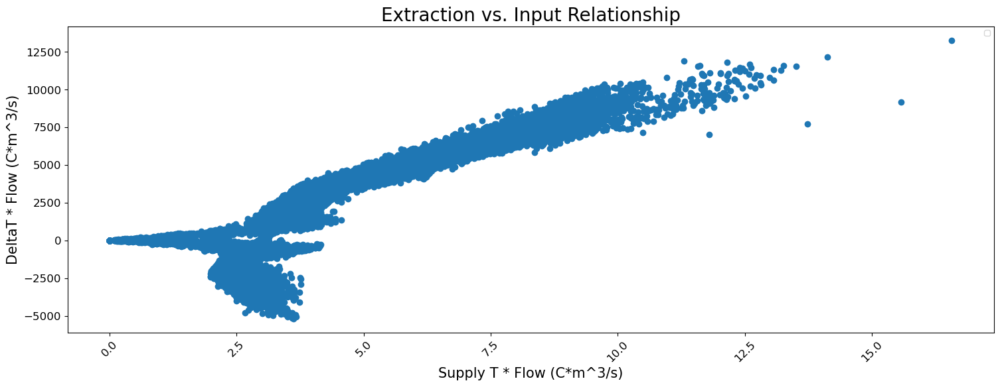

In [331]:
# Experimenting with different plots and relationships
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.scatter(data_frame_2022['Flow.Supply'], data_frame_2022["Power"])
plt.legend()
plt.xlabel("Supply T * Flow (C*m^3/s)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Extraction vs. Input Relationship" , fontsize = 20)
plt.xticks(rotation = 45,)
plt.show()

Sum Everything by Month for 2022

In [332]:
data_frame_2022month_sums = pd.DataFrame()
content = []

data_frame_2022month_sums['BF1 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF1 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF2 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF2 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF3 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF3 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF4 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF4 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2022month_sums['Total Absolute Borefield Energy Exchange (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['Total Absolute Borefield Energy Exchange (TJ)'].sum() , columns = None)

data_frame_2022month_sums['BF1 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF1 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF1 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF1 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF1 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF1 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2022month_sums['BF2 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF2 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF2 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF2 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF2 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF2 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2022month_sums['BF3 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF3 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF3 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF3 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF3 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF3 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2022month_sums['BF4 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF4 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF4 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF4 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2022month_sums['BF4 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['BF4 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2022month_sums['Total Energy From All Fields Abs (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['Total Energy From All Fields Abs (TJ)'].sum() , columns = None)
data_frame_2022month_sums['Total Energy To All Fields (TJ)'] = pd.DataFrame(data_frame_2022.groupby(['month'])['Total Energy To All Fields (TJ)'].sum() , columns = None)


data_frame_2022month_sums

,BF1 Energy Exchanged Abs (TJ),BF2 Energy Exchanged Abs (TJ),BF3 Energy Exchanged Abs (TJ),BF4 Energy Exchanged Abs (TJ),Total Absolute Borefield Energy Exchange (TJ),BF1 Energy From Field (TJ),BF1 Energy To Field (TJ),BF1 Energy From Field Abs (TJ),BF2 Energy From Field (TJ),BF2 Energy To Field (TJ),BF2 Energy From Field Abs (TJ),BF3 Energy From Field (TJ),BF3 Energy To Field (TJ),BF3 Energy From Field Abs (TJ),BF4 Energy From Field (TJ),BF4 Energy To Field (TJ),BF4 Energy From Field Abs (TJ),Total Energy From All Fields Abs (TJ),Total Energy To All Fields (TJ)
month,,,,,,,,,,,,,,,,,,,
01/2022,0.000121,2.041434,3.684864,5.227880,10.954299,-0.000121,0.0,0.000121,-2.040868,0.000566,2.040868,-3.675916e+00,0.008948,3.675916e+00,-5.203059,0.024820,5.203059,10.912344,0.005968
02/2022,0.000000,1.513921,2.950979,4.040423,8.505323,0.000000,0.0,0.000000,-1.509189,0.004731,1.509189,-2.925650e+00,0.025329,2.925650e+00,-3.970696,0.069727,3.970696,8.375477,0.031277
03/2022,0.000000,0.902021,1.864353,2.861475,5.627848,0.000000,0.0,0.000000,-0.757417,0.144604,0.757417,-1.509361e+00,0.354992,1.509361e+00,-1.974290,0.887184,1.974290,4.140300,1.214902
04/2022,0.000000,0.736115,1.497201,2.856855,5.090170,0.000000,0.0,0.000000,-0.222032,0.514083,0.222032,-4.327315e-01,1.064470,4.327315e-01,-0.505767,2.351087,0.505767,1.062561,3.780475
05/2022,0.000000,2.632889,5.301108,9.084099,17.018096,0.000000,0.0,0.000000,-0.000120,2.632769,0.000120,-4.946095e-04,5.300613,4.946095e-04,-0.000029,9.084071,0.000029,0.000000,17.011574
06/2022,0.000000,3.758727,7.877057,12.713565,24.349349,0.000000,0.0,0.000000,0.000000,3.758727,0.000000,0.000000e+00,7.877057,0.000000e+00,0.000000,12.713565,0.000000,0.000000,24.349349
07/2022,0.000000,4.584254,10.297777,16.212367,31.094397,0.000000,0.0,0.000000,0.000000,4.584254,0.000000,0.000000e+00,10.297777,0.000000e+00,0.000000,16.212367,0.000000,0.000000,31.094397
08/2022,0.000000,4.368534,10.473293,16.232231,31.074058,0.000000,0.0,0.000000,0.000000,4.368534,0.000000,0.000000e+00,10.473293,0.000000e+00,0.000000,16.232231,0.000000,0.000000,31.074058
09/2022,0.000000,2.633668,6.873389,10.698613,20.205670,0.000000,0.0,0.000000,-0.000262,2.633406,0.000262,-6.647717e-07,6.873389,6.647717e-07,0.000000,10.698613,0.000000,0.000000,20.187355


Experimenting with Plots for 2022

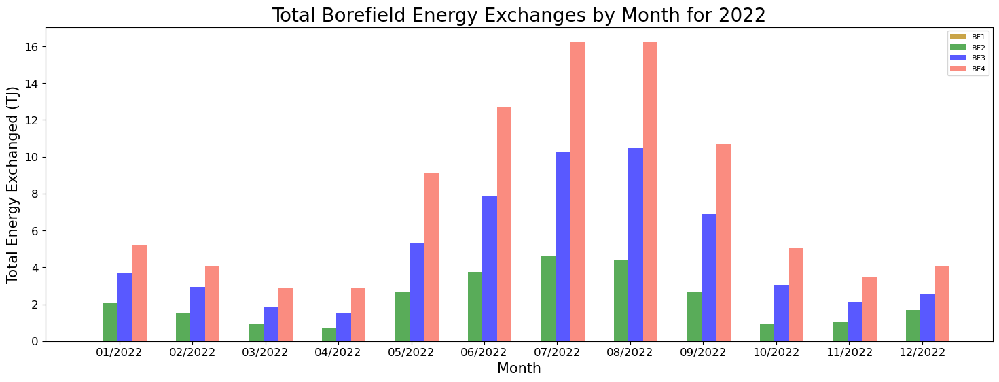

In [333]:
ticks = data_frame_2022month_sums.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
n=12
r = np.arange(n)
width = 0.25
plt.bar(r - 0.2, data_frame_2022month_sums['BF1 Energy Exchanged Abs (TJ)'], label = 'BF1', color = 'darkgoldenrod', alpha = 0.75, width = 0.2)
plt.bar(r, data_frame_2022month_sums['BF2 Energy Exchanged Abs (TJ)'], label = 'BF2', color = 'green', alpha = 0.65, width = 0.2)
plt.bar(r + 0.2, data_frame_2022month_sums['BF3 Energy Exchanged Abs (TJ)'], label = 'BF3', color = 'blue', alpha = 0.65, width = 0.2)
plt.bar(r + 0.4, data_frame_2022month_sums['BF4 Energy Exchanged Abs (TJ)'], label = 'BF4', color = 'salmon', alpha = 0.9, width = 0.2)
plt.legend()
plt.xlabel("Month",  fontsize = 15)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Total Borefield Energy Exchanges by Month for 2022" , fontsize = 20)
plt.xticks(r + width/2, ticks)
plt.show()

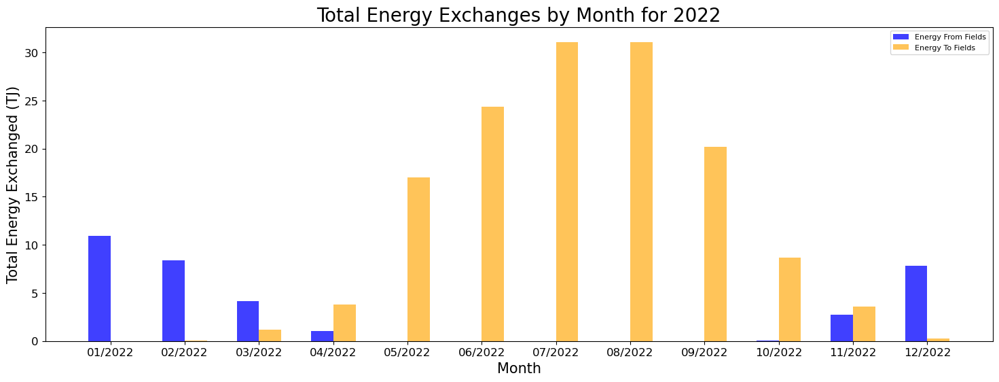

In [334]:
ticks = data_frame_2022month_sums.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
n=12
r = np.arange(n)
width = 0.25
plt.bar(r - 0.15, data_frame_2022month_sums['Total Energy From All Fields Abs (TJ)'], label = 'Energy From Fields', color = 'blue', alpha = 0.75, width = 0.3)
plt.bar(r + 0.15, data_frame_2022month_sums['Total Energy To All Fields (TJ)'], label = 'Energy To Fields', color = 'orange', alpha = 0.65, width = 0.3)
plt.legend()
plt.xlabel("Month",  fontsize = 15)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Total Energy Exchanges by Month for 2022" , fontsize = 20)
plt.xticks(r, ticks)
plt.show()

Import Data for 2021

In [335]:
data_frame_2021 = pd.DataFrame()
content = []

for i in ['01','02','03','04','05','06','07','08','09','10','11','12']:
    path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/Geo2021/2021_"+i+"_GeoData/"
    
    # # Change the directory
    os.chdir(path)
    files = glob.glob(path + "/*.csv")
    

    
    # checking all the csv files in the 
    # specified path
    for filename in files:

        # reading content of csv file
        # content.append(filename)
        df = pd.read_csv(filename, index_col=None, usecols=['TimeStamp', 'BF1 Supply Temp', 'BF1 Return Temp', 'BF1 Flow', 'BF2 Supply Temp', 
                                                            'BF2 Return Temp', 'BF2 Flow', 'BF3 Supply Temp', 'BF3 Return Temp', 'BF3 Flow', 'BF4 Supply Temp', 'BF4 Return Temp', 'BF4 Flow'])
        content.append(df)



# data_frame_2021.drop("index" , axis = 1)
data_frame_2021 = pd.concat(content , ignore_index=True)

timestamps = []
dates = []
months = []
time = []
hour = []


for i in data_frame_2021['TimeStamp']:
        

    if 10 < len(i) < 14:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H'))

    elif len(i) == 18:
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))
    
    elif 7 < len(i) < 11:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H'))
        
    elif 5 < len(i) < 8:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))

    else:
        timestamps.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H'))


data_frame_2021['date'] = dates
data_frame_2021['month'] = months
data_frame_2021['time'] = time
data_frame_2021['hour'] = hour
data_frame_2021['datetime'] = timestamps
data_frame_2021.sort_values(by = ['datetime'])

data_frame_2021['hour'][:] = data_frame_2021['hour'][:] + ':00:00'

data_frame_2021.set_index('datetime', drop=True, append=False, inplace=True, verify_integrity=False)
data_frame_2021 = data_frame_2021.sort_index()

data_frame_2021.index = pd.to_datetime(data_frame_2021.index)

type(data_frame_2021.index[0])

data_frame_2021['datetime']=data_frame_2021.index

data_frame_2021

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/3861316566.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame_2021['hour'][:] = data_frame_2021['hour'][:] + ':00:00'


,TimeStamp,BF1 Supply Temp,BF1 Return Temp,BF1 Flow,BF2 Supply Temp,BF2 Return Temp,BF2 Flow,BF3 Supply Temp,BF3 Return Temp,BF3 Flow,BF4 Supply Temp,BF4 Return Temp,BF4 Flow,date,month,time,hour,datetime
datetime,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,1/1/2021,50.120000,51.807499,1272.951131,49.813604,54.720543,1437.851196,49.271078,54.422206,2625.466146,49.644304,54.618985,3738.781250,01/01/2021,01/2021,00:00:00,00:00:00,2021-01-01 00:00:00
2021-01-01 00:15:00,1/1/2021 12:15:00 AM,50.149999,51.818750,1273.281901,50.073374,54.743062,1221.141317,49.982950,54.414107,2243.481771,50.233465,54.606127,3559.109375,01/01/2021,01/2021,00:15:00,00:00:00,2021-01-01 00:15:00
2021-01-01 00:30:00,1/1/2021 12:30:00 AM,50.127497,51.803749,1274.751953,50.261879,54.683517,1073.713745,49.846966,54.413292,2071.119792,50.203045,54.609938,3561.833333,01/01/2021,01/2021,00:30:00,00:00:00,2021-01-01 00:30:00
2021-01-01 00:45:00,1/1/2021 12:45:00 AM,50.063749,51.811249,1273.281901,50.225259,54.638575,1077.929077,49.671536,54.416496,2073.156250,49.944895,54.626802,3546.302083,01/01/2021,01/2021,00:45:00,00:00:00,2021-01-01 00:45:00
2021-01-01 01:00:00,1/1/2021 1:00:00 AM,50.142502,51.818748,1274.751953,49.986231,54.652229,1140.942464,49.281723,54.434262,2116.184896,49.574266,54.630704,3658.239583,01/01/2021,01/2021,01:00:00,01:00:00,2021-01-01 01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 22:45:00,12/31/2021 10:45:00 PM,54.233747,54.773753,0.000000,53.501732,57.724528,1083.333252,53.161073,56.620957,2027.971354,53.240405,56.420021,3210.750000,12/31/2021,12/2021,22:45:00,22:00:00,2021-12-31 22:45:00
2021-12-31 23:00:00,12/31/2021 11:00:00 PM,54.177500,54.758751,0.000000,53.524319,57.705630,1089.602214,52.993108,56.619859,2089.359375,53.115641,56.411418,3194.656250,12/31/2021,12/2021,23:00:00,23:00:00,2021-12-31 23:00:00
2021-12-31 23:15:00,12/31/2021 11:15:00 PM,54.169999,54.777498,0.000000,53.460073,57.703721,1103.545125,52.874029,56.615917,2014.848958,53.086669,56.401330,3210.755208,12/31/2021,12/2021,23:15:00,23:00:00,2021-12-31 23:15:00


Conversions and Calculations for 2021

In [336]:
data_frame_2021['BF1 Supply Celcius'] = (data_frame_2021['BF1 Supply Temp'] - 32) * (5/9)
data_frame_2021['BF1 Return Celcius'] = (data_frame_2021['BF1 Return Temp'] - 32) * (5/9)
data_frame_2021['BF2 Supply Celcius'] = (data_frame_2021['BF2 Supply Temp'] - 32) * (5/9)
data_frame_2021['BF2 Return Celcius'] = (data_frame_2021['BF2 Return Temp'] - 32) * (5/9)
data_frame_2021['BF3 Supply Celcius'] = (data_frame_2021['BF3 Supply Temp'] - 32) * (5/9)
data_frame_2021['BF3 Return Celcius'] = (data_frame_2021['BF3 Return Temp'] - 32) * (5/9)
data_frame_2021['BF4 Supply Celcius'] = (data_frame_2021['BF4 Supply Temp'] - 32) * (5/9)
data_frame_2021['BF4 Return Celcius'] = (data_frame_2021['BF4 Return Temp'] - 32) * (5/9)

data_frame_2021['BF1 Flow m3/s'] = (data_frame_2021['BF1 Flow'] * (3.78/1000) * (1/60))
data_frame_2021['BF2 Flow m3/s'] = (data_frame_2021['BF2 Flow'] * (3.78/1000) * (1/60))
data_frame_2021['BF3 Flow m3/s'] = (data_frame_2021['BF3 Flow'] * (3.78/1000) * (1/60))
data_frame_2021['BF4 Flow m3/s'] = (data_frame_2021['BF4 Flow'] * (3.78/1000) * (1/60))

data_frame_2021['BF1 Heat Flow Rate (kW)'] = (data_frame_2021['BF1 Flow m3/s'] * (data_frame_2021['BF1 Supply Celcius']-data_frame_2021['BF1 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2021['BF2 Heat Flow Rate (kW)'] = (data_frame_2021['BF2 Flow m3/s'] * (data_frame_2021['BF2 Supply Celcius']-data_frame_2021['BF2 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2021['BF3 Heat Flow Rate (kW)'] = (data_frame_2021['BF3 Flow m3/s'] * (data_frame_2021['BF3 Supply Celcius']-data_frame_2021['BF3 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2021['BF4 Heat Flow Rate (kW)'] = (data_frame_2021['BF4 Flow m3/s'] * (data_frame_2021['BF4 Supply Celcius']-data_frame_2021['BF4 Return Celcius']) * 4186 * 999.6018 * (1/1000))

data_frame_2021['BF1 Heat Flow Rate Abs (kW)'] = abs(data_frame_2021['BF1 Heat Flow Rate (kW)'])
data_frame_2021['BF2 Heat Flow Rate Abs (kW)'] = abs(data_frame_2021['BF2 Heat Flow Rate (kW)'])
data_frame_2021['BF3 Heat Flow Rate Abs (kW)'] = abs(data_frame_2021['BF3 Heat Flow Rate (kW)'])
data_frame_2021['BF4 Heat Flow Rate Abs (kW)'] = abs(data_frame_2021['BF4 Heat Flow Rate (kW)'])

data_frame_2021['BF1 Energy Exchanged (kJ)'] = data_frame_2021['BF1 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2021['BF2 Energy Exchanged (kJ)'] = data_frame_2021['BF2 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2021['BF3 Energy Exchanged (kJ)'] = data_frame_2021['BF3 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2021['BF4 Energy Exchanged (kJ)'] = data_frame_2021['BF4 Heat Flow Rate (kW)'] * (15 * 60)

data_frame_2021['BF1 Energy Exchanged Abs (kJ)'] = abs(data_frame_2021['BF1 Energy Exchanged (kJ)'])
data_frame_2021['BF2 Energy Exchanged Abs (kJ)'] = abs(data_frame_2021['BF2 Energy Exchanged (kJ)'])
data_frame_2021['BF3 Energy Exchanged Abs (kJ)'] = abs(data_frame_2021['BF3 Energy Exchanged (kJ)'])
data_frame_2021['BF4 Energy Exchanged Abs (kJ)'] = abs(data_frame_2021['BF4 Energy Exchanged (kJ)'])

data_frame_2021['BF1 Energy Exchanged Abs (TJ)'] = data_frame_2021['BF1 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2021['BF2 Energy Exchanged Abs (TJ)'] = data_frame_2021['BF2 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2021['BF3 Energy Exchanged Abs (TJ)'] = data_frame_2021['BF3 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2021['BF4 Energy Exchanged Abs (TJ)'] = data_frame_2021['BF4 Energy Exchanged Abs (kJ)'] / (1e9)


data_frame_2021['Total Absolute Borefield Power Exchange (kW)'] = data_frame_2021['BF1 Heat Flow Rate Abs (kW)'] + data_frame_2021['BF2 Heat Flow Rate Abs (kW)'] + data_frame_2021['BF3 Heat Flow Rate Abs (kW)'] + data_frame_2021['BF4 Heat Flow Rate Abs (kW)']
data_frame_2021['Total Absolute Borefield Energy Exchange (TJ)'] = data_frame_2021['BF1 Energy Exchanged Abs (TJ)'] + data_frame_2021['BF2 Energy Exchanged Abs (TJ)'] + data_frame_2021['BF3 Energy Exchanged Abs (TJ)'] + data_frame_2021['BF4 Energy Exchanged Abs (TJ)']


Separate "To" and "From" for 2021

In [337]:
mask = data_frame_2021['BF1 Energy Exchanged (kJ)'] > 0
data_frame_2021['BF1 Energy From Field (kJ)'] = data_frame_2021['BF1 Energy Exchanged (kJ)'].mask(mask)
data_frame_2021['BF1 Energy To Field (kJ)'] = data_frame_2021['BF1 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2021['BF1 Energy From Field Abs (kJ)'] = abs(data_frame_2021['BF1 Energy From Field (kJ)'])

mask = data_frame_2021['BF2 Energy Exchanged (kJ)'] > 0
data_frame_2021['BF2 Energy From Field (kJ)'] = data_frame_2021['BF2 Energy Exchanged (kJ)'].mask(mask)
data_frame_2021['BF2 Energy To Field (kJ)'] = data_frame_2021['BF2 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2021['BF2 Energy From Field Abs (kJ)'] = abs(data_frame_2021['BF2 Energy From Field (kJ)'])

mask = data_frame_2021['BF3 Energy Exchanged (kJ)'] > 0
data_frame_2021['BF3 Energy From Field (kJ)'] = data_frame_2021['BF3 Energy Exchanged (kJ)'].mask(mask)
data_frame_2021['BF3 Energy To Field (kJ)'] = data_frame_2021['BF3 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2021['BF3 Energy From Field Abs (kJ)'] = abs(data_frame_2021['BF3 Energy From Field (kJ)'])

mask = data_frame_2021['BF4 Energy Exchanged (kJ)'] > 0
data_frame_2021['BF4 Energy From Field (kJ)'] = data_frame_2021['BF4 Energy Exchanged (kJ)'].mask(mask)
data_frame_2021['BF4 Energy To Field (kJ)'] = data_frame_2021['BF4 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2021['BF4 Energy From Field Abs (kJ)'] = abs(data_frame_2021['BF4 Energy From Field (kJ)'])

data_frame_2021['BF1 Energy From Field (TJ)'] = data_frame_2021['BF1 Energy From Field (kJ)'] / (1e9)
data_frame_2021['BF1 Energy From Field Abs (TJ)'] = data_frame_2021['BF1 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2021['BF1 Energy To Field (TJ)'] = data_frame_2021['BF1 Energy To Field (kJ)'] / (1e9)

data_frame_2021['BF2 Energy From Field (TJ)'] = data_frame_2021['BF2 Energy From Field (kJ)'] / (1e9)
data_frame_2021['BF2 Energy From Field Abs (TJ)'] = data_frame_2021['BF2 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2021['BF2 Energy To Field (TJ)'] = data_frame_2021['BF2 Energy To Field (kJ)'] / (1e9)

data_frame_2021['BF3 Energy From Field (TJ)'] = data_frame_2021['BF3 Energy From Field (kJ)'] / (1e9)
data_frame_2021['BF3 Energy From Field Abs (TJ)'] = data_frame_2021['BF3 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2021['BF3 Energy To Field (TJ)'] = data_frame_2021['BF3 Energy To Field (kJ)'] / (1e9)

data_frame_2021['BF4 Energy From Field (TJ)'] = data_frame_2021['BF4 Energy From Field (kJ)'] / (1e9)
data_frame_2021['BF4 Energy From Field Abs (TJ)'] = data_frame_2021['BF4 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2021['BF4 Energy To Field (TJ)'] = data_frame_2021['BF4 Energy To Field (kJ)'] / (1e9)

data_frame_2021['Total Energy From All Fields (TJ)'] = data_frame_2021['BF1 Energy From Field (TJ)'] + data_frame_2021['BF2 Energy From Field (TJ)'] + data_frame_2021['BF3 Energy From Field (TJ)'] + data_frame_2021['BF4 Energy From Field (TJ)']
data_frame_2021['Total Energy From All Fields Abs (TJ)'] = data_frame_2021['BF1 Energy From Field Abs (TJ)'] + data_frame_2021['BF2 Energy From Field Abs (TJ)'] + data_frame_2021['BF3 Energy From Field Abs (TJ)'] + data_frame_2021['BF4 Energy From Field Abs (TJ)']
data_frame_2021['Total Energy To All Fields (TJ)'] =  (data_frame_2021['BF2 Energy To Field (TJ)'] + data_frame_2021['BF3 Energy To Field (TJ)'] + data_frame_2021['BF4 Energy To Field (TJ)'])


In [338]:
data_frame_2021['Flow.Supply'] = data_frame_2021['BF4 Supply Celcius'] * data_frame_2021['BF4 Flow m3/s']
data_frame_2021['Power'] = (data_frame_2021['BF4 Supply Celcius'] - data_frame_2021["BF4 Return Celcius"]) * data_frame_2021['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
data_frame_2021["deltaT"] = (data_frame_2021['BF4 Supply Celcius'] - data_frame_2021["BF4 Return Celcius"])

Sum by Month for 2021

In [339]:
data_frame_2021month_sums = pd.DataFrame()
content = []

data_frame_2021month_sums['BF1 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF1 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF2 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF2 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF3 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF3 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF4 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF4 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2021month_sums['Total Absolute Borefield Energy Exchange (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['Total Absolute Borefield Energy Exchange (TJ)'].sum() , columns = None)

data_frame_2021month_sums['BF1 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF1 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF1 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF1 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF1 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF1 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2021month_sums['BF2 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF2 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF2 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF2 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF2 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF2 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2021month_sums['BF3 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF3 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF3 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF3 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF3 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF3 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2021month_sums['BF4 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF4 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF4 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF4 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2021month_sums['BF4 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['BF4 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2021month_sums['Total Energy From All Fields Abs (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['Total Energy From All Fields Abs (TJ)'].sum() , columns = None)
data_frame_2021month_sums['Total Energy To All Fields (TJ)'] = pd.DataFrame(data_frame_2021.groupby(['month'])['Total Energy To All Fields (TJ)'].sum() , columns = None)


data_frame_2021month_sums

,BF1 Energy Exchanged Abs (TJ),BF2 Energy Exchanged Abs (TJ),BF3 Energy Exchanged Abs (TJ),BF4 Energy Exchanged Abs (TJ),Total Absolute Borefield Energy Exchange (TJ),BF1 Energy From Field (TJ),BF1 Energy To Field (TJ),BF1 Energy From Field Abs (TJ),BF2 Energy From Field (TJ),BF2 Energy To Field (TJ),BF2 Energy From Field Abs (TJ),BF3 Energy From Field (TJ),BF3 Energy To Field (TJ),BF3 Energy From Field Abs (TJ),BF4 Energy From Field (TJ),BF4 Energy To Field (TJ),BF4 Energy From Field Abs (TJ),Total Energy From All Fields Abs (TJ),Total Energy To All Fields (TJ)
month,,,,,,,,,,,,,,,,,,,
01/2021,0.198894,1.432188,2.976757,5.052922,9.660761,-0.106529,0.092365,0.106529,-1.432188,0.000000,1.432188,-2.976757,0.000000,2.976757,-5.052780,0.000142,5.052780,7.850476,0.000000
02/2021,0.000000,1.577087,3.632567,6.193874,11.403528,0.000000,0.000000,0.000000,-1.576221,0.000866,1.576221,-3.630939,0.001628,3.630939,-6.189474,0.004399,6.189474,11.386851,0.000252
03/2021,0.000000,0.873798,2.052536,1.130383,4.056718,0.000000,0.000000,0.000000,-0.675215,0.198583,0.675215,-1.672547,0.379989,1.672547,-0.922624,0.207759,0.922624,3.187143,0.700711
04/2021,0.041090,1.447869,2.915188,0.832960,5.237107,0.000000,0.041090,0.000000,-0.157936,1.289933,0.157936,-0.397537,2.517651,0.397537,-0.054136,0.778824,0.054136,0.561113,4.546953
05/2021,0.919203,2.992292,6.047476,3.070101,13.029072,0.000000,0.919203,0.000000,-0.000430,2.991862,0.000430,-0.003286,6.044191,0.003286,-0.000011,3.070090,0.000011,0.000094,12.095712
06/2021,0.000000,3.494052,7.302777,14.136434,24.933263,0.000000,0.000000,0.000000,0.000000,3.494052,0.000000,0.000000,7.302777,0.000000,0.000000,14.136434,0.000000,0.000000,24.933263
07/2021,0.000000,1.982919,4.282750,8.860348,15.126018,0.000000,0.000000,0.000000,0.000000,1.982919,0.000000,0.000000,4.282750,0.000000,0.000000,8.860348,0.000000,0.000000,15.126018
08/2021,0.000000,3.968559,9.335826,17.364965,30.669351,0.000000,0.000000,0.000000,0.000000,3.968559,0.000000,0.000000,9.335826,0.000000,0.000000,17.364965,0.000000,0.000000,30.669351
09/2021,0.000000,2.569507,6.385941,11.286050,20.241498,0.000000,0.000000,0.000000,0.000000,2.569507,0.000000,0.000000,6.385941,0.000000,0.000000,11.286050,0.000000,0.000000,20.241498


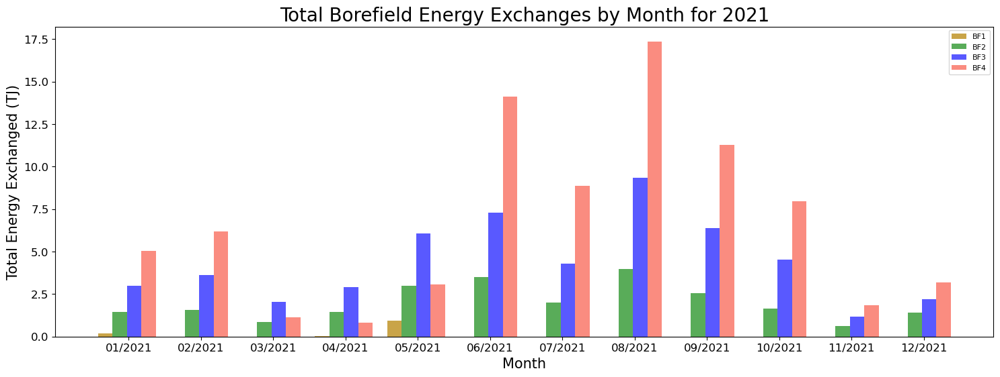

In [340]:
ticks = data_frame_2021month_sums.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
n=12
r = np.arange(n)
width = 0.25
plt.bar(r - 0.2, data_frame_2021month_sums['BF1 Energy Exchanged Abs (TJ)'], label = 'BF1', color = 'darkgoldenrod', alpha = 0.75, width = 0.2)
plt.bar(r, data_frame_2021month_sums['BF2 Energy Exchanged Abs (TJ)'], label = 'BF2', color = 'green', alpha = 0.65, width = 0.2)
plt.bar(r + 0.2, data_frame_2021month_sums['BF3 Energy Exchanged Abs (TJ)'], label = 'BF3', color = 'blue', alpha = 0.65, width = 0.2)
plt.bar(r + 0.4, data_frame_2021month_sums['BF4 Energy Exchanged Abs (TJ)'], label = 'BF4', color = 'salmon', alpha = 0.9, width = 0.2)
plt.legend()
plt.xlabel("Month",  fontsize = 15)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Total Borefield Energy Exchanges by Month for 2021" , fontsize = 20)
plt.xticks(r + width/2, ticks)
plt.show()

Combine 2022 and 2021 months sums into one dataframe

In [341]:
frames = [data_frame_2021month_sums, data_frame_2022month_sums]

sums_2022_2021 = pd.concat(frames)

sums_2022_2021

,BF1 Energy Exchanged Abs (TJ),BF2 Energy Exchanged Abs (TJ),BF3 Energy Exchanged Abs (TJ),BF4 Energy Exchanged Abs (TJ),Total Absolute Borefield Energy Exchange (TJ),BF1 Energy From Field (TJ),BF1 Energy To Field (TJ),BF1 Energy From Field Abs (TJ),BF2 Energy From Field (TJ),BF2 Energy To Field (TJ),BF2 Energy From Field Abs (TJ),BF3 Energy From Field (TJ),BF3 Energy To Field (TJ),BF3 Energy From Field Abs (TJ),BF4 Energy From Field (TJ),BF4 Energy To Field (TJ),BF4 Energy From Field Abs (TJ),Total Energy From All Fields Abs (TJ),Total Energy To All Fields (TJ)
month,,,,,,,,,,,,,,,,,,,
01/2021,0.198894,1.432188,2.976757,5.052922,9.660761,-0.106529,0.092365,0.106529,-1.432188,0.000000,1.432188,-2.976757e+00,0.000000,2.976757e+00,-5.052780,0.000142,5.052780,7.850476,0.000000
02/2021,0.000000,1.577087,3.632567,6.193874,11.403528,0.000000,0.000000,0.000000,-1.576221,0.000866,1.576221,-3.630939e+00,0.001628,3.630939e+00,-6.189474,0.004399,6.189474,11.386851,0.000252
03/2021,0.000000,0.873798,2.052536,1.130383,4.056718,0.000000,0.000000,0.000000,-0.675215,0.198583,0.675215,-1.672547e+00,0.379989,1.672547e+00,-0.922624,0.207759,0.922624,3.187143,0.700711
04/2021,0.041090,1.447869,2.915188,0.832960,5.237107,0.000000,0.041090,0.000000,-0.157936,1.289933,0.157936,-3.975375e-01,2.517651,3.975375e-01,-0.054136,0.778824,0.054136,0.561113,4.546953
05/2021,0.919203,2.992292,6.047476,3.070101,13.029072,0.000000,0.919203,0.000000,-0.000430,2.991862,0.000430,-3.285628e-03,6.044191,3.285628e-03,-0.000011,3.070090,0.000011,0.000094,12.095712
06/2021,0.000000,3.494052,7.302777,14.136434,24.933263,0.000000,0.000000,0.000000,0.000000,3.494052,0.000000,0.000000e+00,7.302777,0.000000e+00,0.000000,14.136434,0.000000,0.000000,24.933263
07/2021,0.000000,1.982919,4.282750,8.860348,15.126018,0.000000,0.000000,0.000000,0.000000,1.982919,0.000000,0.000000e+00,4.282750,0.000000e+00,0.000000,8.860348,0.000000,0.000000,15.126018
08/2021,0.000000,3.968559,9.335826,17.364965,30.669351,0.000000,0.000000,0.000000,0.000000,3.968559,0.000000,0.000000e+00,9.335826,0.000000e+00,0.000000,17.364965,0.000000,0.000000,30.669351
09/2021,0.000000,2.569507,6.385941,11.286050,20.241498,0.000000,0.000000,0.000000,0.000000,2.569507,0.000000,0.000000e+00,6.385941,0.000000e+00,0.000000,11.286050,0.000000,0.000000,20.241498


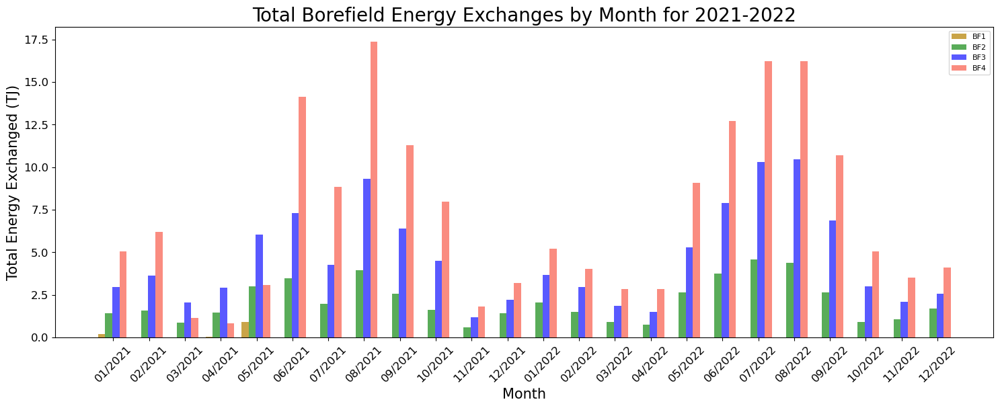

In [342]:
ticks = sums_2022_2021.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
n=24
r = np.arange(n)
width = 0.25
plt.bar(r - 0.2, sums_2022_2021['BF1 Energy Exchanged Abs (TJ)'], label = 'BF1', color = 'darkgoldenrod', alpha = 0.75, width = 0.2)
plt.bar(r, sums_2022_2021['BF2 Energy Exchanged Abs (TJ)'], label = 'BF2', color = 'green', alpha = 0.65, width = 0.2)
plt.bar(r + 0.2, sums_2022_2021['BF3 Energy Exchanged Abs (TJ)'], label = 'BF3', color = 'blue', alpha = 0.65, width = 0.2)
plt.bar(r + 0.4, sums_2022_2021['BF4 Energy Exchanged Abs (TJ)'], label = 'BF4', color = 'salmon', alpha = 0.9, width = 0.2)
plt.legend()
plt.xlabel("Month",  fontsize = 15)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Total Borefield Energy Exchanges by Month for 2021-2022" , fontsize = 20)
plt.xticks(r + width/2, ticks, rotation = 45)
plt.show()

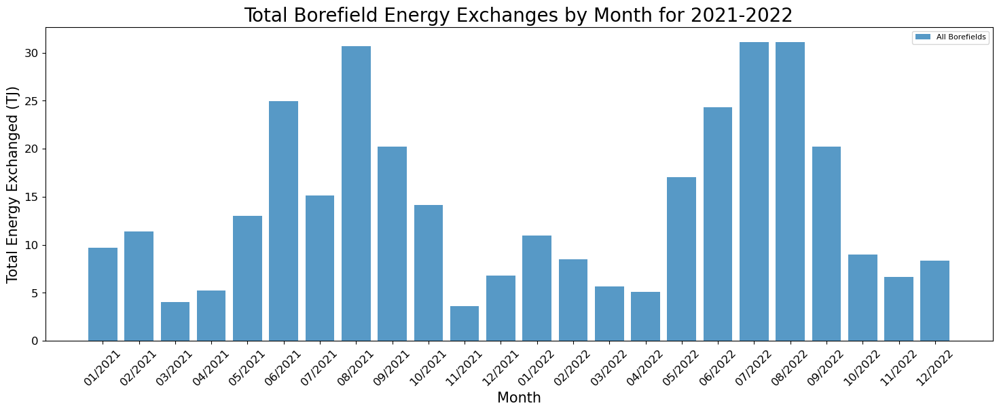

In [343]:
ticks = sums_2022_2021.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.bar(sums_2022_2021.index, sums_2022_2021['Total Absolute Borefield Energy Exchange (TJ)'], label = 'All Borefields', alpha = 0.75)
plt.legend()
plt.xlabel("Month",  fontsize = 15)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Total Borefield Energy Exchanges by Month for 2021-2022" , fontsize = 20)
plt.xticks(ticks, rotation = 45,)
plt.show()

Import 2020 Data

In [344]:
data_frame_2020 = pd.DataFrame()
content = []

for i in ['01','02','03','04','05','06','07','08','09','10','11','12']:
    path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/Geo2020/2020_"+i+"_GeoData/"
    
    # # Change the directory
    os.chdir(path)
    files = glob.glob(path + "/*.csv")
    

    
    # checking all the csv files in the 
    # specified path
    for filename in files:

        # reading content of csv file
        # content.append(filename)
        df = pd.read_csv(filename, index_col=None, usecols=['TimeStamp', 'BF1 Supply Temp', 'BF1 Return Temp', 'BF1 Flow', 'BF2 Supply Temp', 
                                                            'BF2 Return Temp', 'BF2 Flow', 'BF3 Supply Temp', 'BF3 Return Temp', 'BF3 Flow', 'BF4 Supply Temp', 'BF4 Return Temp', 'BF4 Flow'])
        content.append(df)



# data_frame_2020.drop("index" , axis = 1)
data_frame_2020 = pd.concat(content , ignore_index=True)

timestamps = []
dates = []
months = []
time = []
hour = []


for i in data_frame_2020['TimeStamp']:
        

    if 10 < len(i) < 14:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H'))

    elif len(i) == 18:
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))
    
    elif 7 < len(i) < 11:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H'))
        
    elif 5 < len(i) < 8:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))

    else:
        timestamps.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H'))


data_frame_2020['date'] = dates
data_frame_2020['month'] = months
data_frame_2020['time'] = time
data_frame_2020['hour'] = hour
data_frame_2020['datetime'] = timestamps
data_frame_2020.sort_values(by = ['datetime'])

data_frame_2020['hour'][:] = data_frame_2020['hour'][:] + ':00:00'

data_frame_2020.set_index('datetime', drop=True, append=False, inplace=True, verify_integrity=False)
data_frame_2020 = data_frame_2020.sort_index()

data_frame_2020.index = pd.to_datetime(data_frame_2020.index)

type(data_frame_2020.index[0])

data_frame_2020

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/2536375616.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame_2020['hour'][:] = data_frame_2020['hour'][:] + ':00:00'


,TimeStamp,BF1 Supply Temp,BF1 Return Temp,BF1 Flow,BF2 Supply Temp,BF2 Return Temp,BF2 Flow,BF3 Supply Temp,BF3 Return Temp,BF3 Flow,BF4 Supply Temp,BF4 Return Temp,BF4 Flow,date,month,time,hour
datetime,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,1/1/2020,49.032501,51.841248,1283.866292,49.648928,54.135910,1088.629435,49.106574,54.416757,2023.187500,49.374311,53.701057,3506.020833,01/01/2020,01/2020,00:00:00,00:00:00
2020-01-01 00:15:00,1/1/2020 12:15:00 AM,49.006250,51.856249,1271.885376,49.606738,54.152800,1085.494954,48.990820,54.386062,2058.291667,49.344216,53.714433,3507.973958,01/01/2020,01/2020,00:15:00,00:00:00
2020-01-01 00:30:00,1/1/2020 12:30:00 AM,48.987499,51.837499,1276.589518,49.500809,54.162148,1087.548584,48.918126,54.385489,2034.986979,49.204439,53.724510,3510.562500,01/01/2020,01/2020,00:30:00,00:00:00
2020-01-01 00:45:00,1/1/2020 12:45:00 AM,49.013749,51.848749,1283.498779,49.314452,54.174110,1093.925578,49.062091,54.382568,1984.080729,49.448324,53.739985,3503.046875,01/01/2020,01/2020,00:45:00,00:00:00
2020-01-01 01:00:00,1/1/2020 1:00:00 AM,49.115000,51.841250,1278.390340,49.468709,54.195849,1084.306071,49.024268,54.385822,2069.919271,49.319870,53.746186,3520.505208,01/01/2020,01/2020,01:00:00,01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-30 22:45:00,12/30/2020 10:45:00 PM,50.393748,51.916247,1276.957031,50.109740,54.783895,1084.306071,50.137907,54.497944,2048.549479,50.501050,54.677046,3488.791667,12/30/2020,12/2020,22:45:00,22:00:00
2020-12-30 23:00:00,12/30/2020 11:00:00 PM,50.506251,51.908750,1279.860392,50.078949,54.805585,1069.498413,50.204995,54.469865,2047.901042,50.509020,54.681329,3491.015625,12/30/2020,12/2020,23:00:00,23:00:00
2020-12-30 23:15:00,12/30/2020 11:15:00 PM,50.378752,51.904999,1281.661214,50.286493,54.797036,1096.195353,50.045517,54.473126,2075.671875,50.338308,54.680935,3489.390625,12/30/2020,12/2020,23:15:00,23:00:00


Conversions and Calcs for 2020

In [345]:
data_frame_2020['BF1 Supply Celcius'] = (data_frame_2020['BF1 Supply Temp'] - 32) * (5/9)
data_frame_2020['BF1 Return Celcius'] = (data_frame_2020['BF1 Return Temp'] - 32) * (5/9)
data_frame_2020['BF2 Supply Celcius'] = (data_frame_2020['BF2 Supply Temp'] - 32) * (5/9)
data_frame_2020['BF2 Return Celcius'] = (data_frame_2020['BF2 Return Temp'] - 32) * (5/9)
data_frame_2020['BF3 Supply Celcius'] = (data_frame_2020['BF3 Supply Temp'] - 32) * (5/9)
data_frame_2020['BF3 Return Celcius'] = (data_frame_2020['BF3 Return Temp'] - 32) * (5/9)
data_frame_2020['BF4 Supply Celcius'] = (data_frame_2020['BF4 Supply Temp'] - 32) * (5/9)
data_frame_2020['BF4 Return Celcius'] = (data_frame_2020['BF4 Return Temp'] - 32) * (5/9)

data_frame_2020['BF1 Flow m3/s'] = (data_frame_2020['BF1 Flow'] * (3.78/1000) * (1/60))
data_frame_2020['BF2 Flow m3/s'] = (data_frame_2020['BF2 Flow'] * (3.78/1000) * (1/60))
data_frame_2020['BF3 Flow m3/s'] = (data_frame_2020['BF3 Flow'] * (3.78/1000) * (1/60))
data_frame_2020['BF4 Flow m3/s'] = (data_frame_2020['BF4 Flow'] * (3.78/1000) * (1/60))

data_frame_2020['BF1 Heat Flow Rate (kW)'] = (data_frame_2020['BF1 Flow m3/s'] * (data_frame_2020['BF1 Supply Celcius']-data_frame_2020['BF1 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2020['BF2 Heat Flow Rate (kW)'] = (data_frame_2020['BF2 Flow m3/s'] * (data_frame_2020['BF2 Supply Celcius']-data_frame_2020['BF2 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2020['BF3 Heat Flow Rate (kW)'] = (data_frame_2020['BF3 Flow m3/s'] * (data_frame_2020['BF3 Supply Celcius']-data_frame_2020['BF3 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2020['BF4 Heat Flow Rate (kW)'] = (data_frame_2020['BF4 Flow m3/s'] * (data_frame_2020['BF4 Supply Celcius']-data_frame_2020['BF4 Return Celcius']) * 4186 * 999.6018 * (1/1000))

data_frame_2020['BF1 Heat Flow Rate Abs (kW)'] = abs(data_frame_2020['BF1 Heat Flow Rate (kW)'])
data_frame_2020['BF2 Heat Flow Rate Abs (kW)'] = abs(data_frame_2020['BF2 Heat Flow Rate (kW)'])
data_frame_2020['BF3 Heat Flow Rate Abs (kW)'] = abs(data_frame_2020['BF3 Heat Flow Rate (kW)'])
data_frame_2020['BF4 Heat Flow Rate Abs (kW)'] = abs(data_frame_2020['BF4 Heat Flow Rate (kW)'])

data_frame_2020['BF1 Energy Exchanged (kJ)'] = data_frame_2020['BF1 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2020['BF2 Energy Exchanged (kJ)'] = data_frame_2020['BF2 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2020['BF3 Energy Exchanged (kJ)'] = data_frame_2020['BF3 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2020['BF4 Energy Exchanged (kJ)'] = data_frame_2020['BF4 Heat Flow Rate (kW)'] * (15 * 60)

data_frame_2020['BF1 Energy Exchanged Abs (kJ)'] = abs(data_frame_2020['BF1 Energy Exchanged (kJ)'])
data_frame_2020['BF2 Energy Exchanged Abs (kJ)'] = abs(data_frame_2020['BF2 Energy Exchanged (kJ)'])
data_frame_2020['BF3 Energy Exchanged Abs (kJ)'] = abs(data_frame_2020['BF3 Energy Exchanged (kJ)'])
data_frame_2020['BF4 Energy Exchanged Abs (kJ)'] = abs(data_frame_2020['BF4 Energy Exchanged (kJ)'])

data_frame_2020['BF1 Energy Exchanged Abs (TJ)'] = data_frame_2020['BF1 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2020['BF2 Energy Exchanged Abs (TJ)'] = data_frame_2020['BF2 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2020['BF3 Energy Exchanged Abs (TJ)'] = data_frame_2020['BF3 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2020['BF4 Energy Exchanged Abs (TJ)'] = data_frame_2020['BF4 Energy Exchanged Abs (kJ)'] / (1e9)


data_frame_2020['Total Absolute Borefield Power Exchange (kW)'] = data_frame_2020['BF1 Heat Flow Rate Abs (kW)'] + data_frame_2020['BF2 Heat Flow Rate Abs (kW)'] + data_frame_2020['BF3 Heat Flow Rate Abs (kW)'] + data_frame_2020['BF4 Heat Flow Rate Abs (kW)']
data_frame_2020['Total Absolute Borefield Energy Exchange (TJ)'] = data_frame_2020['BF1 Energy Exchanged Abs (TJ)'] + data_frame_2020['BF2 Energy Exchanged Abs (TJ)'] + data_frame_2020['BF3 Energy Exchanged Abs (TJ)'] + data_frame_2020['BF4 Energy Exchanged Abs (TJ)']

In [346]:
mask = data_frame_2020['BF1 Energy Exchanged (kJ)'] > 0
data_frame_2020['BF1 Energy From Field (kJ)'] = data_frame_2020['BF1 Energy Exchanged (kJ)'].mask(mask)
data_frame_2020['BF1 Energy To Field (kJ)'] = data_frame_2020['BF1 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2020['BF1 Energy From Field Abs (kJ)'] = abs(data_frame_2020['BF1 Energy From Field (kJ)'])

mask = data_frame_2020['BF2 Energy Exchanged (kJ)'] > 0
data_frame_2020['BF2 Energy From Field (kJ)'] = data_frame_2020['BF2 Energy Exchanged (kJ)'].mask(mask)
data_frame_2020['BF2 Energy To Field (kJ)'] = data_frame_2020['BF2 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2020['BF2 Energy From Field Abs (kJ)'] = abs(data_frame_2020['BF2 Energy From Field (kJ)'])

mask = data_frame_2020['BF3 Energy Exchanged (kJ)'] > 0
data_frame_2020['BF3 Energy From Field (kJ)'] = data_frame_2020['BF3 Energy Exchanged (kJ)'].mask(mask)
data_frame_2020['BF3 Energy To Field (kJ)'] = data_frame_2020['BF3 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2020['BF3 Energy From Field Abs (kJ)'] = abs(data_frame_2020['BF3 Energy From Field (kJ)'])

mask = data_frame_2020['BF4 Energy Exchanged (kJ)'] > 0
data_frame_2020['BF4 Energy From Field (kJ)'] = data_frame_2020['BF4 Energy Exchanged (kJ)'].mask(mask)
data_frame_2020['BF4 Energy To Field (kJ)'] = data_frame_2020['BF4 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2020['BF4 Energy From Field Abs (kJ)'] = abs(data_frame_2020['BF4 Energy From Field (kJ)'])

data_frame_2020['BF1 Energy From Field (TJ)'] = data_frame_2020['BF1 Energy From Field (kJ)'] / (1e9)
data_frame_2020['BF1 Energy From Field Abs (TJ)'] = data_frame_2020['BF1 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2020['BF1 Energy To Field (TJ)'] = data_frame_2020['BF1 Energy To Field (kJ)'] / (1e9)

data_frame_2020['BF2 Energy From Field (TJ)'] = data_frame_2020['BF2 Energy From Field (kJ)'] / (1e9)
data_frame_2020['BF2 Energy From Field Abs (TJ)'] = data_frame_2020['BF2 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2020['BF2 Energy To Field (TJ)'] = data_frame_2020['BF2 Energy To Field (kJ)'] / (1e9)

data_frame_2020['BF3 Energy From Field (TJ)'] = data_frame_2020['BF3 Energy From Field (kJ)'] / (1e9)
data_frame_2020['BF3 Energy From Field Abs (TJ)'] = data_frame_2020['BF3 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2020['BF3 Energy To Field (TJ)'] = data_frame_2020['BF3 Energy To Field (kJ)'] / (1e9)

data_frame_2020['BF4 Energy From Field (TJ)'] = data_frame_2020['BF4 Energy From Field (kJ)'] / (1e9)
data_frame_2020['BF4 Energy From Field Abs (TJ)'] = data_frame_2020['BF4 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2020['BF4 Energy To Field (TJ)'] = data_frame_2020['BF4 Energy To Field (kJ)'] / (1e9)

data_frame_2020['Total Energy From All Fields (TJ)'] = data_frame_2020['BF1 Energy From Field (TJ)'] + data_frame_2020['BF2 Energy From Field (TJ)'] + data_frame_2020['BF3 Energy From Field (TJ)'] + data_frame_2020['BF4 Energy From Field (TJ)']
data_frame_2020['Total Energy From All Fields Abs (TJ)'] = data_frame_2020['BF1 Energy From Field Abs (TJ)'] + data_frame_2020['BF2 Energy From Field Abs (TJ)'] + data_frame_2020['BF3 Energy From Field Abs (TJ)'] + data_frame_2020['BF4 Energy From Field Abs (TJ)']
data_frame_2020['Total Energy To All Fields (TJ)'] =  (data_frame_2020['BF2 Energy To Field (TJ)'] + data_frame_2020['BF3 Energy To Field (TJ)'] + data_frame_2020['BF4 Energy To Field (TJ)'])


In [347]:
data_frame_2020['Flow.Supply'] = data_frame_2020['BF4 Supply Celcius'] * data_frame_2020['BF4 Flow m3/s']
data_frame_2020['Power'] = (data_frame_2020['BF4 Supply Celcius'] - data_frame_2020["BF4 Return Celcius"]) * data_frame_2020['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
data_frame_2020["deltaT"] = (data_frame_2020['BF4 Supply Celcius'] - data_frame_2020["BF4 Return Celcius"])

Month Sums 2020

In [348]:
data_frame_2020month_sums = pd.DataFrame()
content = []

data_frame_2020month_sums['BF1 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF1 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF2 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF2 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF3 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF3 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF4 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF4 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2020month_sums['Total Absolute Borefield Energy Exchange (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['Total Absolute Borefield Energy Exchange (TJ)'].sum() , columns = None)

data_frame_2020month_sums['BF1 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF1 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF1 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF1 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF1 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF1 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2020month_sums['BF2 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF2 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF2 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF2 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF2 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF2 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2020month_sums['BF3 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF3 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF3 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF3 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF3 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF3 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2020month_sums['BF4 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF4 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF4 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF4 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2020month_sums['BF4 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['BF4 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2020month_sums['Total Energy From All Fields Abs (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['Total Energy From All Fields Abs (TJ)'].sum() , columns = None)
data_frame_2020month_sums['Total Energy To All Fields (TJ)'] = pd.DataFrame(data_frame_2020.groupby(['month'])['Total Energy To All Fields (TJ)'].sum() , columns = None)

Import 2019 Data

In [349]:
data_frame_2019 = pd.DataFrame()
content = []

for i in ['01','02','03','04','05','06','07','08','09','10','11','12']:
    path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/Geo2019/2019_"+i+"_GeoData/"
    
    # # Change the directory
    os.chdir(path)
    files = glob.glob(path + "/*.csv")
    
    
    # checking all the csv files in the 
    # specified path
    for filename in files:

        # reading content of csv file
        # content.append(filename)
        df = pd.read_csv(filename, index_col=None)
        content.append(df)


# data_frame_2019.drop("index" , axis = 1)
data_frame_2019 = pd.concat(content , ignore_index=True)

timestamps = []
dates = []
months = []
time = []
hour = []


for i in data_frame_2019['TimeStamp']:
        

    if 10 < len(i) < 13:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H'))
    
    elif 12 < len(i) < 16:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%H'))
    
    elif 7 < len(i) < 11:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H'))
        
    elif 5 < len(i) < 8:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))

    else:
        timestamps.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H'))


data_frame_2019['date'] = dates
data_frame_2019['month'] = months
data_frame_2019['time'] = time
data_frame_2019['hour'] = hour
data_frame_2019['datetime'] = timestamps
data_frame_2019.sort_values(by = ['datetime'])

data_frame_2019['hour'][:] = data_frame_2019['hour'][:] + ':00:00'

data_frame_2019 = data_frame_2019.loc[:, ~data_frame_2019.columns.str.contains('^Unnamed')]

data_frame_2019.set_index('datetime', drop=True, append=False, inplace=True, verify_integrity=False)
data_frame_2019 = data_frame_2019.sort_index()

data_frame_2019.index = pd.to_datetime(data_frame_2019.index)

type(data_frame_2019.index[0])


data_frame_2019
#data_frame_2019.to_csv('file_name.csv')



/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/3378401419.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame_2019['hour'][:] = data_frame_2019['hour'][:] + ':00:00'


,TimeStamp,BF1 Supply Temp,BF1 Return Temp,BF1 Flow,BF2 Supply Temp,BF2 Return Temp,BF2 Flow,Pond 10 Supply Temp,Pond 10 Return Temp,Pond 11 Supply Temp,...,LC,DS,FARM CEP,C4 CEP,UB3,UB3 Shared,date,month,time,hour
datetime,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1/1/2019,50.105000,52.366249,1275.854492,50.519357,53.862017,1008.538635,48.482489,48.244649,40.443539,...,87.796875,161.432008,57.849503,300.100004,28.880001,2.000,01/01/2019,01/2019,00:00:00,00:00:00
2019-01-01 00:15:00,1/1/2019 12:15:00 AM,50.026250,52.370000,1280.595418,50.855212,53.884680,997.838277,48.480071,48.244906,40.424409,...,84.937500,153.776007,64.067504,299.600004,62.064003,2.000,01/01/2019,01/2019,00:15:00,00:00:00
2019-01-01 00:30:00,1/1/2019 12:30:00 AM,50.000000,52.366249,1286.769653,50.845814,53.899840,1001.080811,48.455783,48.250449,40.423789,...,87.843750,159.896008,61.724004,300.500004,42.008002,2.000,01/01/2019,01/2019,00:30:00,00:00:00
2019-01-01 00:45:00,1/1/2019 12:45:00 AM,50.014997,52.385000,1287.137166,50.543406,53.914394,1027.777751,48.455531,48.249235,40.435842,...,86.328125,156.696007,38.341502,299.800004,42.960002,2.000,01/01/2019,01/2019,00:45:00,00:00:00
2019-01-01 01:00:00,1/1/2019 1:00:00 AM,49.996250,52.355001,1277.692057,50.554212,53.917224,1216.817932,48.462957,48.259146,40.426458,...,87.078125,143.536007,48.372003,301.900004,38.056002,2.000,01/01/2019,01/2019,01:00:00,01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 22:45:00,12/31/2019 10:45:00 PM,48.717499,51.856249,1280.191162,48.848671,54.154574,1105.706828,66.170197,66.567245,66.669220,...,172.890625,189.936009,82.310442,344.300005,49.072002,2.016,12/31/2019,12/2019,22:45:00,22:00:00
2019-12-31 23:00:00,12/31/2019 11:00:00 PM,48.548749,51.848750,1278.427083,49.023778,54.133110,1097.168132,66.170197,66.567245,66.669220,...,173.859375,196.976009,88.890974,343.100005,73.848004,2.992,12/31/2019,12/2019,23:00:00,23:00:00
2019-12-31 23:15:00,12/31/2019 11:15:00 PM,48.605001,51.852497,1278.757853,48.881560,54.129100,1086.467773,66.170197,66.567245,66.669220,...,174.015625,199.096009,92.750630,341.900005,57.976003,2.000,12/31/2019,12/2019,23:15:00,23:00:00


2019 Conversions and Calcs

In [350]:
data_frame_2019['BF1 Supply Celcius'] = (data_frame_2019['BF1 Supply Temp'] - 32) * (5/9)
data_frame_2019['BF1 Return Celcius'] = (data_frame_2019['BF1 Return Temp'] - 32) * (5/9)
data_frame_2019['BF2 Supply Celcius'] = (data_frame_2019['BF2 Supply Temp'] - 32) * (5/9)
data_frame_2019['BF2 Return Celcius'] = (data_frame_2019['BF2 Return Temp'] - 32) * (5/9)
data_frame_2019['BF3 Supply Celcius'] = (data_frame_2019['BF3 Supply Temp'] - 32) * (5/9)
data_frame_2019['BF3 Return Celcius'] = (data_frame_2019['BF3 Return Temp'] - 32) * (5/9)
data_frame_2019['BF4 Supply Celcius'] = (data_frame_2019['BF4 Supply Temp'] - 32) * (5/9)
data_frame_2019['BF4 Return Celcius'] = (data_frame_2019['BF4 Return Temp'] - 32) * (5/9)

data_frame_2019['BF1 Flow m3/s'] = (data_frame_2019['BF1 Flow'] * (3.78/1000) * (1/60))
data_frame_2019['BF2 Flow m3/s'] = (data_frame_2019['BF2 Flow'] * (3.78/1000) * (1/60))
data_frame_2019['BF3 Flow m3/s'] = (data_frame_2019['BF3 Flow'] * (3.78/1000) * (1/60))
data_frame_2019['BF4 Flow m3/s'] = (data_frame_2019['BF4 Flow'] * (3.78/1000) * (1/60))

data_frame_2019['BF1 Heat Flow Rate (kW)'] = (data_frame_2019['BF1 Flow m3/s'] * (data_frame_2019['BF1 Supply Celcius']-data_frame_2019['BF1 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2019['BF2 Heat Flow Rate (kW)'] = (data_frame_2019['BF2 Flow m3/s'] * (data_frame_2019['BF2 Supply Celcius']-data_frame_2019['BF2 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2019['BF3 Heat Flow Rate (kW)'] = (data_frame_2019['BF3 Flow m3/s'] * (data_frame_2019['BF3 Supply Celcius']-data_frame_2019['BF3 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2019['BF4 Heat Flow Rate (kW)'] = (data_frame_2019['BF4 Flow m3/s'] * (data_frame_2019['BF4 Supply Celcius']-data_frame_2019['BF4 Return Celcius']) * 4186 * 999.6018 * (1/1000))

data_frame_2019['BF1 Heat Flow Rate Abs (kW)'] = abs(data_frame_2019['BF1 Heat Flow Rate (kW)'])
data_frame_2019['BF2 Heat Flow Rate Abs (kW)'] = abs(data_frame_2019['BF2 Heat Flow Rate (kW)'])
data_frame_2019['BF3 Heat Flow Rate Abs (kW)'] = abs(data_frame_2019['BF3 Heat Flow Rate (kW)'])
data_frame_2019['BF4 Heat Flow Rate Abs (kW)'] = abs(data_frame_2019['BF4 Heat Flow Rate (kW)'])

data_frame_2019['BF1 Energy Exchanged (kJ)'] = data_frame_2019['BF1 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2019['BF2 Energy Exchanged (kJ)'] = data_frame_2019['BF2 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2019['BF3 Energy Exchanged (kJ)'] = data_frame_2019['BF3 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2019['BF4 Energy Exchanged (kJ)'] = data_frame_2019['BF4 Heat Flow Rate (kW)'] * (15 * 60)

data_frame_2019['BF1 Energy Exchanged Abs (kJ)'] = abs(data_frame_2019['BF1 Energy Exchanged (kJ)'])
data_frame_2019['BF2 Energy Exchanged Abs (kJ)'] = abs(data_frame_2019['BF2 Energy Exchanged (kJ)'])
data_frame_2019['BF3 Energy Exchanged Abs (kJ)'] = abs(data_frame_2019['BF3 Energy Exchanged (kJ)'])
data_frame_2019['BF4 Energy Exchanged Abs (kJ)'] = abs(data_frame_2019['BF4 Energy Exchanged (kJ)'])

data_frame_2019['BF1 Energy Exchanged Abs (TJ)'] = data_frame_2019['BF1 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2019['BF2 Energy Exchanged Abs (TJ)'] = data_frame_2019['BF2 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2019['BF3 Energy Exchanged Abs (TJ)'] = data_frame_2019['BF3 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2019['BF4 Energy Exchanged Abs (TJ)'] = data_frame_2019['BF4 Energy Exchanged Abs (kJ)'] / (1e9)


data_frame_2019['Total Absolute Borefield Power Exchange (kW)'] = data_frame_2019['BF1 Heat Flow Rate Abs (kW)'] + data_frame_2019['BF2 Heat Flow Rate Abs (kW)'] + data_frame_2019['BF3 Heat Flow Rate Abs (kW)'] + data_frame_2019['BF4 Heat Flow Rate Abs (kW)']
data_frame_2019['Total Absolute Borefield Energy Exchange (TJ)'] = data_frame_2019['BF1 Energy Exchanged Abs (TJ)'] + data_frame_2019['BF2 Energy Exchanged Abs (TJ)'] + data_frame_2019['BF3 Energy Exchanged Abs (TJ)'] + data_frame_2019['BF4 Energy Exchanged Abs (TJ)']

Separate "To" and "From" for 2019

In [351]:
mask = data_frame_2019['BF1 Energy Exchanged (kJ)'] > 0
data_frame_2019['BF1 Energy From Field (kJ)'] = data_frame_2019['BF1 Energy Exchanged (kJ)'].mask(mask)
data_frame_2019['BF1 Energy To Field (kJ)'] = data_frame_2019['BF1 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2019['BF1 Energy From Field Abs (kJ)'] = abs(data_frame_2019['BF1 Energy From Field (kJ)'])

mask = data_frame_2019['BF2 Energy Exchanged (kJ)'] > 0
data_frame_2019['BF2 Energy From Field (kJ)'] = data_frame_2019['BF2 Energy Exchanged (kJ)'].mask(mask)
data_frame_2019['BF2 Energy To Field (kJ)'] = data_frame_2019['BF2 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2019['BF2 Energy From Field Abs (kJ)'] = abs(data_frame_2019['BF2 Energy From Field (kJ)'])

mask = data_frame_2019['BF3 Energy Exchanged (kJ)'] > 0
data_frame_2019['BF3 Energy From Field (kJ)'] = data_frame_2019['BF3 Energy Exchanged (kJ)'].mask(mask)
data_frame_2019['BF3 Energy To Field (kJ)'] = data_frame_2019['BF3 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2019['BF3 Energy From Field Abs (kJ)'] = abs(data_frame_2019['BF3 Energy From Field (kJ)'])

mask = data_frame_2019['BF4 Energy Exchanged (kJ)'] > 0
data_frame_2019['BF4 Energy From Field (kJ)'] = data_frame_2019['BF4 Energy Exchanged (kJ)'].mask(mask)
data_frame_2019['BF4 Energy To Field (kJ)'] = data_frame_2019['BF4 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2019['BF4 Energy From Field Abs (kJ)'] = abs(data_frame_2019['BF4 Energy From Field (kJ)'])

data_frame_2019['BF1 Energy From Field (TJ)'] = data_frame_2019['BF1 Energy From Field (kJ)'] / (1e9)
data_frame_2019['BF1 Energy From Field Abs (TJ)'] = data_frame_2019['BF1 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2019['BF1 Energy To Field (TJ)'] = data_frame_2019['BF1 Energy To Field (kJ)'] / (1e9)

data_frame_2019['BF2 Energy From Field (TJ)'] = data_frame_2019['BF2 Energy From Field (kJ)'] / (1e9)
data_frame_2019['BF2 Energy From Field Abs (TJ)'] = data_frame_2019['BF2 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2019['BF2 Energy To Field (TJ)'] = data_frame_2019['BF2 Energy To Field (kJ)'] / (1e9)

data_frame_2019['BF3 Energy From Field (TJ)'] = data_frame_2019['BF3 Energy From Field (kJ)'] / (1e9)
data_frame_2019['BF3 Energy From Field Abs (TJ)'] = data_frame_2019['BF3 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2019['BF3 Energy To Field (TJ)'] = data_frame_2019['BF3 Energy To Field (kJ)'] / (1e9)

data_frame_2019['BF4 Energy From Field (TJ)'] = data_frame_2019['BF4 Energy From Field (kJ)'] / (1e9)
data_frame_2019['BF4 Energy From Field Abs (TJ)'] = data_frame_2019['BF4 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2019['BF4 Energy To Field (TJ)'] = data_frame_2019['BF4 Energy To Field (kJ)'] / (1e9)

data_frame_2019['Total Energy From All Fields (TJ)'] = data_frame_2019['BF1 Energy From Field (TJ)'] + data_frame_2019['BF2 Energy From Field (TJ)'] + data_frame_2019['BF3 Energy From Field (TJ)'] + data_frame_2019['BF4 Energy From Field (TJ)']
data_frame_2019['Total Energy From All Fields Abs (TJ)'] = data_frame_2019['BF1 Energy From Field Abs (TJ)'] + data_frame_2019['BF2 Energy From Field Abs (TJ)'] + data_frame_2019['BF3 Energy From Field Abs (TJ)'] + data_frame_2019['BF4 Energy From Field Abs (TJ)']
data_frame_2019['Total Energy To All Fields (TJ)'] =  (data_frame_2019['BF2 Energy To Field (TJ)'] + data_frame_2019['BF3 Energy To Field (TJ)'] + data_frame_2019['BF4 Energy To Field (TJ)'])


In [352]:
data_frame_2019['Flow.Supply'] = data_frame_2019['BF4 Supply Celcius'] * data_frame_2019['BF4 Flow m3/s']
data_frame_2019['Power'] = (data_frame_2019['BF4 Supply Celcius'] - data_frame_2019["BF4 Return Celcius"]) * data_frame_2019['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
data_frame_2019["deltaT"] = (data_frame_2019['BF4 Supply Celcius'] - data_frame_2019["BF4 Return Celcius"])

Month Sums for 2019

In [353]:
data_frame_2019month_sums = pd.DataFrame()
content = []

data_frame_2019month_sums['BF1 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF1 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF2 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF2 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF3 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF3 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF4 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF4 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2019month_sums['Total Absolute Borefield Energy Exchange (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['Total Absolute Borefield Energy Exchange (TJ)'].sum() , columns = None)

data_frame_2019month_sums['BF1 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF1 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF1 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF1 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF1 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF1 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2019month_sums['BF2 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF2 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF2 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF2 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF2 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF2 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2019month_sums['BF3 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF3 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF3 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF3 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF3 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF3 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2019month_sums['BF4 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF4 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF4 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF4 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2019month_sums['BF4 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['BF4 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2019month_sums['Total Energy From All Fields Abs (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['Total Energy From All Fields Abs (TJ)'].sum() , columns = None)
data_frame_2019month_sums['Total Energy To All Fields (TJ)'] = pd.DataFrame(data_frame_2019.groupby(['month'])['Total Energy To All Fields (TJ)'].sum() , columns = None)

Import 2018 Data

In [354]:
data_frame_2018 = pd.DataFrame()
content = []

for i in ['01','02','03','04','05','06','07','08','09','10','11','12']:
    path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/Geo2018/2018_"+i+"_GeoData/"
    
    # # Change the directory
    os.chdir(path)
    files = glob.glob(path + "/*.csv")
    

    
    # checking all the csv files in the 
    # specified path
    for filename in files:

        # reading content of csv file
        # content.append(filename)
        df = pd.read_csv(filename, index_col=None, usecols=['TimeStamp', 'BF1 Supply Temp', 'BF1 Return Temp', 'BF1 Flow', 'BF2 Supply Temp', 
                                                            'BF2 Return Temp', 'BF2 Flow', 'BF3 Supply Temp', 'BF3 Return Temp', 'BF3 Flow', 'BF4 Supply Temp', 'BF4 Return Temp', 'BF4 Flow'])
        content.append(df)



# data_frame_2018.drop("index" , axis = 1)
data_frame_2018 = pd.concat(content , ignore_index=True)

timestamps = []
dates = []
months = []
time = []
hour = []


for i in data_frame_2018['TimeStamp']:
        

    if 10 < len(i) < 13:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H'))
    
    elif 12 < len(i) < 16:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%H'))
    
    elif 7 < len(i) < 11:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H'))
        
    elif 5 < len(i) < 8:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))

    else:
        timestamps.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H'))


data_frame_2018['date'] = dates
data_frame_2018['month'] = months
data_frame_2018['time'] = time
data_frame_2018['hour'] = hour
data_frame_2018['datetime'] = timestamps
data_frame_2018.sort_values(by = ['datetime'])

data_frame_2018['hour'][:] = data_frame_2018['hour'][:] + ':00:00'

data_frame_2018.set_index('datetime', drop=True, append=False, inplace=True, verify_integrity=False)
data_frame_2018 = data_frame_2018.sort_index()

data_frame_2018.index = pd.to_datetime(data_frame_2018.index)

type(data_frame_2018.index[0])

data_frame_2018

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/3809864562.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame_2018['hour'][:] = data_frame_2018['hour'][:] + ':00:00'


,TimeStamp,BF1 Supply Temp,BF1 Return Temp,BF1 Flow,BF2 Supply Temp,BF2 Return Temp,BF2 Flow,BF3 Supply Temp,BF3 Return Temp,BF3 Flow,BF4 Supply Temp,BF4 Return Temp,BF4 Flow,date,month,time,hour
datetime,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,1/1/2018,56.541069,57.226189,1248.254313,51.705794,53.004790,6569.714355,51.447779,53.389313,11980.940104,51.467613,53.546482,10200.114583,01/01/2018,01/2018,00:00:00,00:00:00
2018-01-01 00:15:00,1/1/2018 12:15:00 AM,56.541069,57.226189,1246.821045,51.889647,53.043841,6534.478678,51.196229,53.364073,11946.645833,51.224906,53.510782,10172.479167,01/01/2018,01/2018,00:15:00,00:00:00
2018-01-01 00:30:00,1/1/2018 12:30:00 AM,56.541069,57.226189,1255.531087,51.676676,53.129417,6548.421712,51.299034,53.416839,12012.468750,51.280890,53.496269,10180.192708,01/01/2018,01/2018,00:30:00,00:00:00
2018-01-01 00:45:00,1/1/2018 12:45:00 AM,56.541069,57.226189,1250.422648,51.708288,53.028778,6535.559733,51.440249,53.429181,11968.484375,51.525322,53.507779,10191.156250,01/01/2018,01/2018,00:45:00,00:00:00
2018-01-01 01:00:00,1/1/2018 1:00:00 AM,56.541069,57.226189,1250.091878,51.851481,53.047246,6588.953451,51.524027,53.372901,11901.825521,51.536238,53.532366,10166.901042,01/01/2018,01/2018,01:00:00,01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 22:45:00,12/31/2018 10:45:00 PM,50.708750,52.403750,1276.222005,49.626035,53.881920,988.326803,50.585997,54.545700,2006.296875,50.848688,53.981704,3576.869792,12/31/2018,12/2018,22:45:00,22:00:00
2018-12-31 23:00:00,12/31/2018 11:00:00 PM,50.734998,52.396250,1277.692057,49.913408,53.852165,1025.616089,50.103156,54.485244,2000.268229,50.333002,53.967981,3596.562500,12/31/2018,12/2018,23:00:00,23:00:00
2018-12-31 23:15:00,12/31/2018 11:15:00 PM,50.723750,52.392499,1283.094482,50.145231,53.861012,984.976176,50.120797,54.261855,2006.372396,50.365660,53.969824,3580.937500,12/31/2018,12/2018,23:15:00,23:00:00


2018 Calcs and Conversions

In [355]:
data_frame_2018['BF1 Supply Celcius'] = (data_frame_2018['BF1 Supply Temp'] - 32) * (5/9)
data_frame_2018['BF1 Return Celcius'] = (data_frame_2018['BF1 Return Temp'] - 32) * (5/9)
data_frame_2018['BF2 Supply Celcius'] = (data_frame_2018['BF2 Supply Temp'] - 32) * (5/9)
data_frame_2018['BF2 Return Celcius'] = (data_frame_2018['BF2 Return Temp'] - 32) * (5/9)
data_frame_2018['BF3 Supply Celcius'] = (data_frame_2018['BF3 Supply Temp'] - 32) * (5/9)
data_frame_2018['BF3 Return Celcius'] = (data_frame_2018['BF3 Return Temp'] - 32) * (5/9)
data_frame_2018['BF4 Supply Celcius'] = (data_frame_2018['BF4 Supply Temp'] - 32) * (5/9)
data_frame_2018['BF4 Return Celcius'] = (data_frame_2018['BF4 Return Temp'] - 32) * (5/9)

data_frame_2018['BF1 Flow m3/s'] = (data_frame_2018['BF1 Flow'] * (3.78/1000) * (1/60))
data_frame_2018['BF2 Flow m3/s'] = (data_frame_2018['BF2 Flow'] * (3.78/1000) * (1/60))
data_frame_2018['BF3 Flow m3/s'] = (data_frame_2018['BF3 Flow'] * (3.78/1000) * (1/60))
data_frame_2018['BF4 Flow m3/s'] = (data_frame_2018['BF4 Flow'] * (3.78/1000) * (1/60))

data_frame_2018['BF1 Heat Flow Rate (kW)'] = (data_frame_2018['BF1 Flow m3/s'] * (data_frame_2018['BF1 Supply Celcius']-data_frame_2018['BF1 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2018['BF2 Heat Flow Rate (kW)'] = (data_frame_2018['BF2 Flow m3/s'] * (data_frame_2018['BF2 Supply Celcius']-data_frame_2018['BF2 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2018['BF3 Heat Flow Rate (kW)'] = (data_frame_2018['BF3 Flow m3/s'] * (data_frame_2018['BF3 Supply Celcius']-data_frame_2018['BF3 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2018['BF4 Heat Flow Rate (kW)'] = (data_frame_2018['BF4 Flow m3/s'] * (data_frame_2018['BF4 Supply Celcius']-data_frame_2018['BF4 Return Celcius']) * 4186 * 999.6018 * (1/1000))

data_frame_2018['BF1 Heat Flow Rate Abs (kW)'] = abs(data_frame_2018['BF1 Heat Flow Rate (kW)'])
data_frame_2018['BF2 Heat Flow Rate Abs (kW)'] = abs(data_frame_2018['BF2 Heat Flow Rate (kW)'])
data_frame_2018['BF3 Heat Flow Rate Abs (kW)'] = abs(data_frame_2018['BF3 Heat Flow Rate (kW)'])
data_frame_2018['BF4 Heat Flow Rate Abs (kW)'] = abs(data_frame_2018['BF4 Heat Flow Rate (kW)'])

data_frame_2018['BF1 Energy Exchanged (kJ)'] = data_frame_2018['BF1 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2018['BF2 Energy Exchanged (kJ)'] = data_frame_2018['BF2 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2018['BF3 Energy Exchanged (kJ)'] = data_frame_2018['BF3 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2018['BF4 Energy Exchanged (kJ)'] = data_frame_2018['BF4 Heat Flow Rate (kW)'] * (15 * 60)

data_frame_2018['BF1 Energy Exchanged Abs (kJ)'] = abs(data_frame_2018['BF1 Energy Exchanged (kJ)'])
data_frame_2018['BF2 Energy Exchanged Abs (kJ)'] = abs(data_frame_2018['BF2 Energy Exchanged (kJ)'])
data_frame_2018['BF3 Energy Exchanged Abs (kJ)'] = abs(data_frame_2018['BF3 Energy Exchanged (kJ)'])
data_frame_2018['BF4 Energy Exchanged Abs (kJ)'] = abs(data_frame_2018['BF4 Energy Exchanged (kJ)'])

data_frame_2018['BF1 Energy Exchanged Abs (TJ)'] = data_frame_2018['BF1 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2018['BF2 Energy Exchanged Abs (TJ)'] = data_frame_2018['BF2 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2018['BF3 Energy Exchanged Abs (TJ)'] = data_frame_2018['BF3 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2018['BF4 Energy Exchanged Abs (TJ)'] = data_frame_2018['BF4 Energy Exchanged Abs (kJ)'] / (1e9)


data_frame_2018['Total Absolute Borefield Power Exchange (kW)'] = data_frame_2018['BF1 Heat Flow Rate Abs (kW)'] + data_frame_2018['BF2 Heat Flow Rate Abs (kW)'] + data_frame_2018['BF3 Heat Flow Rate Abs (kW)'] + data_frame_2018['BF4 Heat Flow Rate Abs (kW)']
data_frame_2018['Total Absolute Borefield Energy Exchange (TJ)'] = data_frame_2018['BF1 Energy Exchanged Abs (TJ)'] + data_frame_2018['BF2 Energy Exchanged Abs (TJ)'] + data_frame_2018['BF3 Energy Exchanged Abs (TJ)'] + data_frame_2018['BF4 Energy Exchanged Abs (TJ)']

Separate "To" and "From" for 2018

In [356]:
mask = data_frame_2018['BF1 Energy Exchanged (kJ)'] > 0
data_frame_2018['BF1 Energy From Field (kJ)'] = data_frame_2018['BF1 Energy Exchanged (kJ)'].mask(mask)
data_frame_2018['BF1 Energy To Field (kJ)'] = data_frame_2018['BF1 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2018['BF1 Energy From Field Abs (kJ)'] = abs(data_frame_2018['BF1 Energy From Field (kJ)'])

mask = data_frame_2018['BF2 Energy Exchanged (kJ)'] > 0
data_frame_2018['BF2 Energy From Field (kJ)'] = data_frame_2018['BF2 Energy Exchanged (kJ)'].mask(mask)
data_frame_2018['BF2 Energy To Field (kJ)'] = data_frame_2018['BF2 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2018['BF2 Energy From Field Abs (kJ)'] = abs(data_frame_2018['BF2 Energy From Field (kJ)'])

mask = data_frame_2018['BF3 Energy Exchanged (kJ)'] > 0
data_frame_2018['BF3 Energy From Field (kJ)'] = data_frame_2018['BF3 Energy Exchanged (kJ)'].mask(mask)
data_frame_2018['BF3 Energy To Field (kJ)'] = data_frame_2018['BF3 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2018['BF3 Energy From Field Abs (kJ)'] = abs(data_frame_2018['BF3 Energy From Field (kJ)'])

mask = data_frame_2018['BF4 Energy Exchanged (kJ)'] > 0
data_frame_2018['BF4 Energy From Field (kJ)'] = data_frame_2018['BF4 Energy Exchanged (kJ)'].mask(mask)
data_frame_2018['BF4 Energy To Field (kJ)'] = data_frame_2018['BF4 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2018['BF4 Energy From Field Abs (kJ)'] = abs(data_frame_2018['BF4 Energy From Field (kJ)'])

data_frame_2018['BF1 Energy From Field (TJ)'] = data_frame_2018['BF1 Energy From Field (kJ)'] / (1e9)
data_frame_2018['BF1 Energy From Field Abs (TJ)'] = data_frame_2018['BF1 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2018['BF1 Energy To Field (TJ)'] = data_frame_2018['BF1 Energy To Field (kJ)'] / (1e9)

data_frame_2018['BF2 Energy From Field (TJ)'] = data_frame_2018['BF2 Energy From Field (kJ)'] / (1e9)
data_frame_2018['BF2 Energy From Field Abs (TJ)'] = data_frame_2018['BF2 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2018['BF2 Energy To Field (TJ)'] = data_frame_2018['BF2 Energy To Field (kJ)'] / (1e9)

data_frame_2018['BF3 Energy From Field (TJ)'] = data_frame_2018['BF3 Energy From Field (kJ)'] / (1e9)
data_frame_2018['BF3 Energy From Field Abs (TJ)'] = data_frame_2018['BF3 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2018['BF3 Energy To Field (TJ)'] = data_frame_2018['BF3 Energy To Field (kJ)'] / (1e9)

data_frame_2018['BF4 Energy From Field (TJ)'] = data_frame_2018['BF4 Energy From Field (kJ)'] / (1e9)
data_frame_2018['BF4 Energy From Field Abs (TJ)'] = data_frame_2018['BF4 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2018['BF4 Energy To Field (TJ)'] = data_frame_2018['BF4 Energy To Field (kJ)'] / (1e9)

data_frame_2018['Total Energy From All Fields (TJ)'] = data_frame_2018['BF1 Energy From Field (TJ)'] + data_frame_2018['BF2 Energy From Field (TJ)'] + data_frame_2018['BF3 Energy From Field (TJ)'] + data_frame_2018['BF4 Energy From Field (TJ)']
data_frame_2018['Total Energy From All Fields Abs (TJ)'] = data_frame_2018['BF1 Energy From Field Abs (TJ)'] + data_frame_2018['BF2 Energy From Field Abs (TJ)'] + data_frame_2018['BF3 Energy From Field Abs (TJ)'] + data_frame_2018['BF4 Energy From Field Abs (TJ)']
data_frame_2018['Total Energy To All Fields (TJ)'] =  (data_frame_2018['BF2 Energy To Field (TJ)'] + data_frame_2018['BF3 Energy To Field (TJ)'] + data_frame_2018['BF4 Energy To Field (TJ)'])


In [357]:
data_frame_2018['Flow.Supply'] = data_frame_2018['BF4 Supply Celcius'] * data_frame_2018['BF4 Flow m3/s']
data_frame_2018['Power'] = (data_frame_2018['BF4 Supply Celcius'] - data_frame_2018["BF4 Return Celcius"]) * data_frame_2018['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
data_frame_2018["deltaT"] = (data_frame_2018['BF4 Supply Celcius'] - data_frame_2018["BF4 Return Celcius"])

Experiment with Relationships

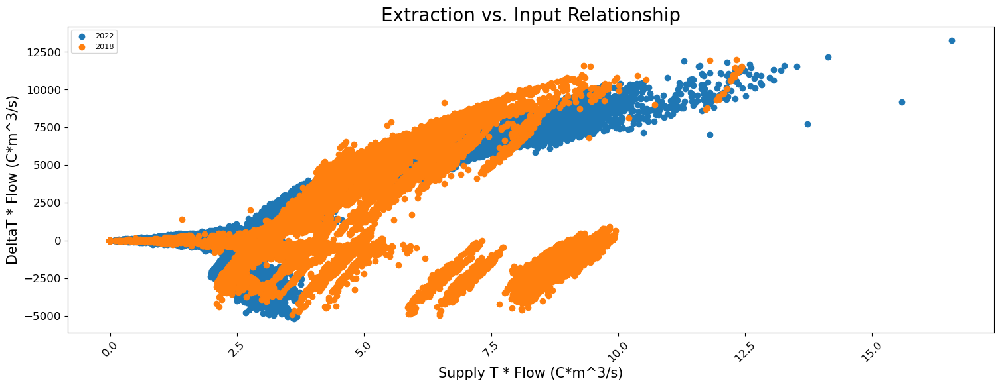

In [358]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2022['Flow.Supply'], data_frame_2022["Power"])
b = plt.scatter(data_frame_2018['Flow.Supply'], data_frame_2018["Power"])
plt.legend((a,b),("2022","2018"))
plt.xlabel("Supply T * Flow (C*m^3/s)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Extraction vs. Input Relationship" , fontsize = 20)
plt.xticks(rotation = 45,)
plt.show()

Month Sums of 2018

In [359]:
data_frame_2018month_sums = pd.DataFrame()
content = []

data_frame_2018month_sums['BF1 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF1 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF2 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF2 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF3 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF3 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF4 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF4 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2018month_sums['Total Absolute Borefield Energy Exchange (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['Total Absolute Borefield Energy Exchange (TJ)'].sum() , columns = None)

data_frame_2018month_sums['BF1 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF1 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF1 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF1 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF1 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF1 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2018month_sums['BF2 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF2 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF2 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF2 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF2 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF2 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2018month_sums['BF3 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF3 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF3 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF3 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF3 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF3 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2018month_sums['BF4 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF4 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF4 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF4 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2018month_sums['BF4 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['BF4 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2018month_sums['Total Energy From All Fields Abs (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['Total Energy From All Fields Abs (TJ)'].sum() , columns = None)
data_frame_2018month_sums['Total Energy To All Fields (TJ)'] = pd.DataFrame(data_frame_2018.groupby(['month'])['Total Energy To All Fields (TJ)'].sum() , columns = None)

Import 2017 Data

In [360]:
data_frame_2017 = pd.DataFrame()
content = []

for i in ['01','02','03','04','05','06','07','08','09','10','11','12']:
    path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/Geo2017/2017_"+i+"_GeoData/"
    
    # # Change the directory
    os.chdir(path)
    files = glob.glob(path + "/*.csv")
    

    
    # checking all the csv files in the 
    # specified path
    for filename in files:

        # reading content of csv file
        # content.append(filename)
        df = pd.read_csv(filename, index_col=None, usecols=['TimeStamp', 'BF1 Supply Temp', 'BF1 Return Temp', 'BF1 Flow', 'BF2 Supply Temp', 
                                                            'BF2 Return Temp', 'BF2 Flow', 'BF3 Supply Temp', 'BF3 Return Temp', 'BF3 Flow', 'BF4 Supply Temp', 'BF4 Return Temp', 'BF4 Flow'])
        content.append(df)



# data_frame_2017.drop("index" , axis = 1)
data_frame_2017 = pd.concat(content , ignore_index=True)

timestamps = []
dates = []
months = []
time = []
hour = []


for i in data_frame_2017['TimeStamp']:
        

    if 10 < len(i) < 14:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H'))

    elif len(i) == 18:
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))
    
    elif 7 < len(i) < 11:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H'))
        
    elif 5 < len(i) < 8:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))

    else:
        timestamps.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H'))


data_frame_2017['date'] = dates
data_frame_2017['month'] = months
data_frame_2017['time'] = time
data_frame_2017['hour'] = hour
data_frame_2017['datetime'] = timestamps
data_frame_2017.sort_values(by = ['datetime'])

data_frame_2017['hour'][:] = data_frame_2017['hour'][:] + ':00:00'

data_frame_2017.set_index('datetime', drop=True, append=False, inplace=True, verify_integrity=False)
data_frame_2017 = data_frame_2017.sort_index()

data_frame_2017.index = pd.to_datetime(data_frame_2017.index)

type(data_frame_2017.index[0])

data_frame_2017

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1142405780.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame_2017['hour'][:] = data_frame_2017['hour'][:] + ':00:00'


,TimeStamp,BF1 Supply Temp,BF1 Return Temp,BF1 Flow,BF2 Supply Temp,BF2 Return Temp,BF2 Flow,BF3 Supply Temp,BF3 Return Temp,BF3 Flow,BF4 Supply Temp,BF4 Return Temp,BF4 Flow,date,month,time,hour
datetime,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,1/1/2017,53.576691,55.262562,1264.939412,53.546794,54.531080,7055.771484,53.108440,54.715228,12917.843750,53.383866,54.393240,7757.145833,01/01/2017,01/2017,00:00:00,00:00:00
2017-01-01 00:15:00,1/1/2017 12:15:00 AM,53.575703,55.252167,1255.898600,53.560996,54.557790,7071.768066,52.896963,54.734304,12785.401042,53.159790,54.404559,7751.791667,01/01/2017,01/2017,00:15:00,00:00:00
2017-01-01 00:30:00,1/1/2017 12:30:00 AM,53.646889,55.254606,1252.958496,53.391652,54.553847,7054.690755,52.905580,54.748326,12800.955729,53.139773,54.394683,7749.078125,01/01/2017,01/2017,00:30:00,00:00:00
2017-01-01 00:45:00,1/1/2017 12:45:00 AM,53.567268,55.245387,1266.409465,53.329201,54.449964,7051.448079,53.047431,54.687669,12798.179688,53.290280,54.382516,7739.937500,01/01/2017,01/2017,00:45:00,00:00:00
2017-01-01 01:00:00,1/1/2017 1:00:00 AM,53.390055,55.254002,1258.066935,53.448547,54.439220,7049.286458,53.043930,54.625466,12957.281250,53.271117,54.377106,7739.609375,01/01/2017,01/2017,01:00:00,01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-31 22:45:00,12/31/2017 10:45:00 PM,56.541069,57.226189,1255.531087,51.987806,53.257440,6552.637044,51.547598,53.575132,11883.380208,51.542913,53.570678,10165.744792,12/31/2017,12/2017,22:45:00,22:00:00
2017-12-31 23:00:00,12/31/2017 11:00:00 PM,56.541069,57.226189,1247.886800,51.983139,53.238029,6539.774902,51.357542,53.551291,11936.929688,51.298816,53.578279,10184.411458,12/31/2017,12/2017,23:00:00,23:00:00
2017-12-31 23:15:00,12/31/2017 11:15:00 PM,56.541069,57.226189,1246.416748,51.837755,53.212858,6572.957031,51.165296,53.540707,12029.385417,51.132215,53.587566,10143.640625,12/31/2017,12/2017,23:15:00,23:00:00


Conversions and Calcs 2017

In [361]:
data_frame_2017['BF1 Supply Celcius'] = (data_frame_2017['BF1 Supply Temp'] - 32) * (5/9)
data_frame_2017['BF1 Return Celcius'] = (data_frame_2017['BF1 Return Temp'] - 32) * (5/9)
data_frame_2017['BF2 Supply Celcius'] = (data_frame_2017['BF2 Supply Temp'] - 32) * (5/9)
data_frame_2017['BF2 Return Celcius'] = (data_frame_2017['BF2 Return Temp'] - 32) * (5/9)
data_frame_2017['BF3 Supply Celcius'] = (data_frame_2017['BF3 Supply Temp'] - 32) * (5/9)
data_frame_2017['BF3 Return Celcius'] = (data_frame_2017['BF3 Return Temp'] - 32) * (5/9)
data_frame_2017['BF4 Supply Celcius'] = (data_frame_2017['BF4 Supply Temp'] - 32) * (5/9)
data_frame_2017['BF4 Return Celcius'] = (data_frame_2017['BF4 Return Temp'] - 32) * (5/9)

data_frame_2017['BF1 Flow m3/s'] = (data_frame_2017['BF1 Flow'] * (3.78/1000) * (1/60))
data_frame_2017['BF2 Flow m3/s'] = (data_frame_2017['BF2 Flow'] * (3.78/1000) * (1/60))
data_frame_2017['BF3 Flow m3/s'] = (data_frame_2017['BF3 Flow'] * (3.78/1000) * (1/60))
data_frame_2017['BF4 Flow m3/s'] = (data_frame_2017['BF4 Flow'] * (3.78/1000) * (1/60))

data_frame_2017['BF1 Heat Flow Rate (kW)'] = (data_frame_2017['BF1 Flow m3/s'] * (data_frame_2017['BF1 Supply Celcius']-data_frame_2017['BF1 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2017['BF2 Heat Flow Rate (kW)'] = (data_frame_2017['BF2 Flow m3/s'] * (data_frame_2017['BF2 Supply Celcius']-data_frame_2017['BF2 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2017['BF3 Heat Flow Rate (kW)'] = (data_frame_2017['BF3 Flow m3/s'] * (data_frame_2017['BF3 Supply Celcius']-data_frame_2017['BF3 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2017['BF4 Heat Flow Rate (kW)'] = (data_frame_2017['BF4 Flow m3/s'] * (data_frame_2017['BF4 Supply Celcius']-data_frame_2017['BF4 Return Celcius']) * 4186 * 999.6018 * (1/1000))

data_frame_2017['BF1 Heat Flow Rate Abs (kW)'] = abs(data_frame_2017['BF1 Heat Flow Rate (kW)'])
data_frame_2017['BF2 Heat Flow Rate Abs (kW)'] = abs(data_frame_2017['BF2 Heat Flow Rate (kW)'])
data_frame_2017['BF3 Heat Flow Rate Abs (kW)'] = abs(data_frame_2017['BF3 Heat Flow Rate (kW)'])
data_frame_2017['BF4 Heat Flow Rate Abs (kW)'] = abs(data_frame_2017['BF4 Heat Flow Rate (kW)'])

data_frame_2017['BF1 Energy Exchanged (kJ)'] = data_frame_2017['BF1 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2017['BF2 Energy Exchanged (kJ)'] = data_frame_2017['BF2 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2017['BF3 Energy Exchanged (kJ)'] = data_frame_2017['BF3 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2017['BF4 Energy Exchanged (kJ)'] = data_frame_2017['BF4 Heat Flow Rate (kW)'] * (15 * 60)

data_frame_2017['BF1 Energy Exchanged Abs (kJ)'] = abs(data_frame_2017['BF1 Energy Exchanged (kJ)'])
data_frame_2017['BF2 Energy Exchanged Abs (kJ)'] = abs(data_frame_2017['BF2 Energy Exchanged (kJ)'])
data_frame_2017['BF3 Energy Exchanged Abs (kJ)'] = abs(data_frame_2017['BF3 Energy Exchanged (kJ)'])
data_frame_2017['BF4 Energy Exchanged Abs (kJ)'] = abs(data_frame_2017['BF4 Energy Exchanged (kJ)'])

data_frame_2017['BF1 Energy Exchanged Abs (TJ)'] = data_frame_2017['BF1 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2017['BF2 Energy Exchanged Abs (TJ)'] = data_frame_2017['BF2 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2017['BF3 Energy Exchanged Abs (TJ)'] = data_frame_2017['BF3 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2017['BF4 Energy Exchanged Abs (TJ)'] = data_frame_2017['BF4 Energy Exchanged Abs (kJ)'] / (1e9)


data_frame_2017['Total Absolute Borefield Power Exchange (kW)'] = data_frame_2017['BF1 Heat Flow Rate Abs (kW)'] + data_frame_2017['BF2 Heat Flow Rate Abs (kW)'] + data_frame_2017['BF3 Heat Flow Rate Abs (kW)'] + data_frame_2017['BF4 Heat Flow Rate Abs (kW)']
data_frame_2017['Total Absolute Borefield Energy Exchange (TJ)'] = data_frame_2017['BF1 Energy Exchanged Abs (TJ)'] + data_frame_2017['BF2 Energy Exchanged Abs (TJ)'] + data_frame_2017['BF3 Energy Exchanged Abs (TJ)'] + data_frame_2017['BF4 Energy Exchanged Abs (TJ)']

Separate "To" and "From" for 2017

In [362]:
mask = data_frame_2017['BF1 Energy Exchanged (kJ)'] > 0
data_frame_2017['BF1 Energy From Field (kJ)'] = data_frame_2017['BF1 Energy Exchanged (kJ)'].mask(mask)
data_frame_2017['BF1 Energy To Field (kJ)'] = data_frame_2017['BF1 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2017['BF1 Energy From Field Abs (kJ)'] = abs(data_frame_2017['BF1 Energy From Field (kJ)'])

mask = data_frame_2017['BF2 Energy Exchanged (kJ)'] > 0
data_frame_2017['BF2 Energy From Field (kJ)'] = data_frame_2017['BF2 Energy Exchanged (kJ)'].mask(mask)
data_frame_2017['BF2 Energy To Field (kJ)'] = data_frame_2017['BF2 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2017['BF2 Energy From Field Abs (kJ)'] = abs(data_frame_2017['BF2 Energy From Field (kJ)'])

mask = data_frame_2017['BF3 Energy Exchanged (kJ)'] > 0
data_frame_2017['BF3 Energy From Field (kJ)'] = data_frame_2017['BF3 Energy Exchanged (kJ)'].mask(mask)
data_frame_2017['BF3 Energy To Field (kJ)'] = data_frame_2017['BF3 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2017['BF3 Energy From Field Abs (kJ)'] = abs(data_frame_2017['BF3 Energy From Field (kJ)'])

mask = data_frame_2017['BF4 Energy Exchanged (kJ)'] > 0
data_frame_2017['BF4 Energy From Field (kJ)'] = data_frame_2017['BF4 Energy Exchanged (kJ)'].mask(mask)
data_frame_2017['BF4 Energy To Field (kJ)'] = data_frame_2017['BF4 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2017['BF4 Energy From Field Abs (kJ)'] = abs(data_frame_2017['BF4 Energy From Field (kJ)'])

data_frame_2017['BF1 Energy From Field (TJ)'] = data_frame_2017['BF1 Energy From Field (kJ)'] / (1e9)
data_frame_2017['BF1 Energy From Field Abs (TJ)'] = data_frame_2017['BF1 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2017['BF1 Energy To Field (TJ)'] = data_frame_2017['BF1 Energy To Field (kJ)'] / (1e9)

data_frame_2017['BF2 Energy From Field (TJ)'] = data_frame_2017['BF2 Energy From Field (kJ)'] / (1e9)
data_frame_2017['BF2 Energy From Field Abs (TJ)'] = data_frame_2017['BF2 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2017['BF2 Energy To Field (TJ)'] = data_frame_2017['BF2 Energy To Field (kJ)'] / (1e9)

data_frame_2017['BF3 Energy From Field (TJ)'] = data_frame_2017['BF3 Energy From Field (kJ)'] / (1e9)
data_frame_2017['BF3 Energy From Field Abs (TJ)'] = data_frame_2017['BF3 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2017['BF3 Energy To Field (TJ)'] = data_frame_2017['BF3 Energy To Field (kJ)'] / (1e9)

data_frame_2017['BF4 Energy From Field (TJ)'] = data_frame_2017['BF4 Energy From Field (kJ)'] / (1e9)
data_frame_2017['BF4 Energy From Field Abs (TJ)'] = data_frame_2017['BF4 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2017['BF4 Energy To Field (TJ)'] = data_frame_2017['BF4 Energy To Field (kJ)'] / (1e9)

data_frame_2017['Total Energy From All Fields (TJ)'] = data_frame_2017['BF1 Energy From Field (TJ)'] + data_frame_2017['BF2 Energy From Field (TJ)'] + data_frame_2017['BF3 Energy From Field (TJ)'] + data_frame_2017['BF4 Energy From Field (TJ)']
data_frame_2017['Total Energy From All Fields Abs (TJ)'] = data_frame_2017['BF1 Energy From Field Abs (TJ)'] + data_frame_2017['BF2 Energy From Field Abs (TJ)'] + data_frame_2017['BF3 Energy From Field Abs (TJ)'] + data_frame_2017['BF4 Energy From Field Abs (TJ)']
data_frame_2017['Total Energy To All Fields (TJ)'] =  (data_frame_2017['BF2 Energy To Field (TJ)'] + data_frame_2017['BF3 Energy To Field (TJ)'] + data_frame_2017['BF4 Energy To Field (TJ)'])


In [363]:
data_frame_2017['Flow.Supply'] = data_frame_2017['BF4 Supply Celcius'] * data_frame_2017['BF4 Flow m3/s']
data_frame_2017['Power'] = (data_frame_2017['BF4 Supply Celcius'] - data_frame_2017["BF4 Return Celcius"]) * data_frame_2017['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
data_frame_2017["deltaT"] = (data_frame_2017['BF4 Supply Celcius'] - data_frame_2017["BF4 Return Celcius"])

2017 Month Sums

In [364]:
data_frame_2017month_sums = pd.DataFrame()
content = []

data_frame_2017month_sums['BF1 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF1 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF2 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF2 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF3 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF3 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF4 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF4 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2017month_sums['Total Absolute Borefield Energy Exchange (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['Total Absolute Borefield Energy Exchange (TJ)'].sum() , columns = None)

data_frame_2017month_sums['BF1 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF1 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF1 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF1 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF1 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF1 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2017month_sums['BF2 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF2 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF2 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF2 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF2 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF2 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2017month_sums['BF3 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF3 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF3 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF3 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF3 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF3 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2017month_sums['BF4 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF4 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF4 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF4 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2017month_sums['BF4 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['BF4 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2017month_sums['Total Energy From All Fields Abs (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['Total Energy From All Fields Abs (TJ)'].sum() , columns = None)
data_frame_2017month_sums['Total Energy To All Fields (TJ)'] = pd.DataFrame(data_frame_2017.groupby(['month'])['Total Energy To All Fields (TJ)'].sum() , columns = None)

Import 2016 Data

In [365]:
data_frame_2016 = pd.DataFrame()
content = []

for i in ['01','02','03','04','05','06','07','08','09','10','11','12']:
    path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/Geo2016/2016_"+i+"_GeoData/"
    
    # # Change the directory
    os.chdir(path)
    files = glob.glob(path + "/*.csv")
    

    
    # checking all the csv files in the 
    # specified path
    for filename in files:

        # reading content of csv file
        # content.append(filename)
        df = pd.read_csv(filename, index_col=None, usecols=['TimeStamp', 'BF1 Supply Temp', 'BF1 Return Temp', 'BF1 Flow', 'BF2 Supply Temp', 
                                                            'BF2 Return Temp', 'BF2 Flow', 'BF3 Supply Temp', 'BF3 Return Temp', 'BF3 Flow', 'BF4 Supply Temp', 'BF4 Return Temp', 'BF4 Flow'])
        content.append(df)



# data_frame_2016.drop("index" , axis = 1)
data_frame_2016 = pd.concat(content , ignore_index=True)

timestamps = []
dates = []
months = []
time = []
hour = []


for i in data_frame_2016['TimeStamp']:
        

    if 10 < len(i) < 13:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H'))
    
    elif 12 < len(i) < 16:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%H'))
    
    elif 7 < len(i) < 11:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H'))
        
    elif 5 < len(i) < 8:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))

    else:
        timestamps.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H'))


data_frame_2016['date'] = dates
data_frame_2016['month'] = months
data_frame_2016['time'] = time
data_frame_2016['hour'] = hour
data_frame_2016['datetime'] = timestamps
data_frame_2016.sort_values(by = ['datetime'])

data_frame_2016['hour'][:] = data_frame_2016['hour'][:] + ':00:00'

data_frame_2016.set_index('datetime', drop=True, append=False, inplace=True, verify_integrity=False)
data_frame_2016 = data_frame_2016.sort_index()

data_frame_2016.index = pd.to_datetime(data_frame_2016.index)

type(data_frame_2016.index[0])

data_frame_2016

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/2297903938.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame_2016['hour'][:] = data_frame_2016['hour'][:] + ':00:00'


,TimeStamp,BF1 Supply Temp,BF1 Return Temp,BF1 Flow,BF2 Supply Temp,BF2 Return Temp,BF2 Flow,BF3 Supply Temp,BF3 Return Temp,BF3 Flow,BF4 Supply Temp,BF4 Return Temp,BF4 Flow,date,month,time,hour
datetime,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00,1/1/2016,53.085897,54.813691,1265.674438,53.294473,55.043269,4367.487956,52.631143,55.293584,7968.054688,52.660360,52.391869,6425.557292,01/01/2016,01/2016,00:00:00,00:00:00
2016-01-01 00:15:00,1/1/2016 12:15:00 AM,52.969827,54.799548,1267.548706,53.173939,55.112624,4338.629395,52.529453,55.245678,7931.239583,52.603246,52.378342,6414.828125,01/01/2016,01/2016,00:15:00,00:00:00
2016-01-01 00:30:00,1/1/2016 12:30:00 AM,53.172215,54.811909,1269.276082,53.094303,55.173252,4326.848145,52.576812,55.279950,7929.562500,52.578928,52.364686,6427.630208,01/01/2016,01/2016,00:30:00,00:00:00
2016-01-01 00:45:00,1/1/2016 12:45:00 AM,53.304516,54.794902,1271.113607,52.907036,55.097281,4355.706706,52.718703,55.309006,7928.856771,52.904871,52.350206,6402.510417,01/01/2016,01/2016,00:45:00,00:00:00
2016-01-01 01:00:00,1/1/2016 1:00:00 AM,53.168348,54.793327,1270.415283,53.128938,55.070821,4333.333333,52.613885,55.293388,7905.989583,52.689365,52.350051,6398.088542,01/01/2016,01/2016,01:00:00,01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 22:45:00,12/31/2016 10:45:00 PM,53.757057,55.256490,1258.066935,53.570371,54.614583,7031.128092,53.198680,54.813498,12854.497396,53.446810,54.410481,7743.593750,12/31/2016,12/2016,22:45:00,22:00:00
2016-12-31 23:00:00,12/31/2016 11:00:00 PM,53.638761,55.250145,1255.126831,53.607385,54.575840,7080.198568,53.287573,54.758449,12879.156250,53.512603,54.404159,7729.833333,12/31/2016,12/2016,23:00:00,23:00:00
2016-12-31 23:15:00,12/31/2016 11:15:00 PM,53.631640,55.259022,1256.964396,53.715075,54.608406,7050.367350,53.084838,54.751513,12859.848958,53.337097,54.412078,7743.229167,12/31/2016,12/2016,23:15:00,23:00:00


2016 Conversions and Calcs

In [366]:
data_frame_2016['BF1 Supply Celcius'] = (data_frame_2016['BF1 Supply Temp'] - 32) * (5/9)
data_frame_2016['BF1 Return Celcius'] = (data_frame_2016['BF1 Return Temp'] - 32) * (5/9)
data_frame_2016['BF2 Supply Celcius'] = (data_frame_2016['BF2 Supply Temp'] - 32) * (5/9)
data_frame_2016['BF2 Return Celcius'] = (data_frame_2016['BF2 Return Temp'] - 32) * (5/9)
data_frame_2016['BF3 Supply Celcius'] = (data_frame_2016['BF3 Supply Temp'] - 32) * (5/9)
data_frame_2016['BF3 Return Celcius'] = (data_frame_2016['BF3 Return Temp'] - 32) * (5/9)
data_frame_2016['BF4 Supply Celcius'] = (data_frame_2016['BF4 Supply Temp'] - 32) * (5/9)
data_frame_2016['BF4 Return Celcius'] = (data_frame_2016['BF4 Return Temp'] - 32) * (5/9)

data_frame_2016['BF1 Flow m3/s'] = (data_frame_2016['BF1 Flow'] * (3.78/1000) * (1/60))
data_frame_2016['BF2 Flow m3/s'] = (data_frame_2016['BF2 Flow'] * (3.78/1000) * (1/60))
data_frame_2016['BF3 Flow m3/s'] = (data_frame_2016['BF3 Flow'] * (3.78/1000) * (1/60))
data_frame_2016['BF4 Flow m3/s'] = (data_frame_2016['BF4 Flow'] * (3.78/1000) * (1/60))

data_frame_2016['BF1 Heat Flow Rate (kW)'] = (data_frame_2016['BF1 Flow m3/s'] * (data_frame_2016['BF1 Supply Celcius']-data_frame_2016['BF1 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2016['BF2 Heat Flow Rate (kW)'] = (data_frame_2016['BF2 Flow m3/s'] * (data_frame_2016['BF2 Supply Celcius']-data_frame_2016['BF2 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2016['BF3 Heat Flow Rate (kW)'] = (data_frame_2016['BF3 Flow m3/s'] * (data_frame_2016['BF3 Supply Celcius']-data_frame_2016['BF3 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2016['BF4 Heat Flow Rate (kW)'] = (data_frame_2016['BF4 Flow m3/s'] * (data_frame_2016['BF4 Supply Celcius']-data_frame_2016['BF4 Return Celcius']) * 4186 * 999.6018 * (1/1000))

data_frame_2016['BF1 Heat Flow Rate Abs (kW)'] = abs(data_frame_2016['BF1 Heat Flow Rate (kW)'])
data_frame_2016['BF2 Heat Flow Rate Abs (kW)'] = abs(data_frame_2016['BF2 Heat Flow Rate (kW)'])
data_frame_2016['BF3 Heat Flow Rate Abs (kW)'] = abs(data_frame_2016['BF3 Heat Flow Rate (kW)'])
data_frame_2016['BF4 Heat Flow Rate Abs (kW)'] = abs(data_frame_2016['BF4 Heat Flow Rate (kW)'])

data_frame_2016['BF1 Energy Exchanged (kJ)'] = data_frame_2016['BF1 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2016['BF2 Energy Exchanged (kJ)'] = data_frame_2016['BF2 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2016['BF3 Energy Exchanged (kJ)'] = data_frame_2016['BF3 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2016['BF4 Energy Exchanged (kJ)'] = data_frame_2016['BF4 Heat Flow Rate (kW)'] * (15 * 60)

data_frame_2016['BF1 Energy Exchanged Abs (kJ)'] = abs(data_frame_2016['BF1 Energy Exchanged (kJ)'])
data_frame_2016['BF2 Energy Exchanged Abs (kJ)'] = abs(data_frame_2016['BF2 Energy Exchanged (kJ)'])
data_frame_2016['BF3 Energy Exchanged Abs (kJ)'] = abs(data_frame_2016['BF3 Energy Exchanged (kJ)'])
data_frame_2016['BF4 Energy Exchanged Abs (kJ)'] = abs(data_frame_2016['BF4 Energy Exchanged (kJ)'])

data_frame_2016['BF1 Energy Exchanged Abs (TJ)'] = data_frame_2016['BF1 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2016['BF2 Energy Exchanged Abs (TJ)'] = data_frame_2016['BF2 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2016['BF3 Energy Exchanged Abs (TJ)'] = data_frame_2016['BF3 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2016['BF4 Energy Exchanged Abs (TJ)'] = data_frame_2016['BF4 Energy Exchanged Abs (kJ)'] / (1e9)


data_frame_2016['Total Absolute Borefield Power Exchange (kW)'] = data_frame_2016['BF1 Heat Flow Rate Abs (kW)'] + data_frame_2016['BF2 Heat Flow Rate Abs (kW)'] + data_frame_2016['BF3 Heat Flow Rate Abs (kW)'] + data_frame_2016['BF4 Heat Flow Rate Abs (kW)']
data_frame_2016['Total Absolute Borefield Energy Exchange (TJ)'] = data_frame_2016['BF1 Energy Exchanged Abs (TJ)'] + data_frame_2016['BF2 Energy Exchanged Abs (TJ)'] + data_frame_2016['BF3 Energy Exchanged Abs (TJ)'] + data_frame_2016['BF4 Energy Exchanged Abs (TJ)']

Separate "To" and "From" for 2016

In [367]:
mask = data_frame_2016['BF1 Energy Exchanged (kJ)'] > 0
data_frame_2016['BF1 Energy From Field (kJ)'] = data_frame_2016['BF1 Energy Exchanged (kJ)'].mask(mask)
data_frame_2016['BF1 Energy To Field (kJ)'] = data_frame_2016['BF1 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2016['BF1 Energy From Field Abs (kJ)'] = abs(data_frame_2016['BF1 Energy From Field (kJ)'])

mask = data_frame_2016['BF2 Energy Exchanged (kJ)'] > 0
data_frame_2016['BF2 Energy From Field (kJ)'] = data_frame_2016['BF2 Energy Exchanged (kJ)'].mask(mask)
data_frame_2016['BF2 Energy To Field (kJ)'] = data_frame_2016['BF2 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2016['BF2 Energy From Field Abs (kJ)'] = abs(data_frame_2016['BF2 Energy From Field (kJ)'])

mask = data_frame_2016['BF3 Energy Exchanged (kJ)'] > 0
data_frame_2016['BF3 Energy From Field (kJ)'] = data_frame_2016['BF3 Energy Exchanged (kJ)'].mask(mask)
data_frame_2016['BF3 Energy To Field (kJ)'] = data_frame_2016['BF3 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2016['BF3 Energy From Field Abs (kJ)'] = abs(data_frame_2016['BF3 Energy From Field (kJ)'])

mask = data_frame_2016['BF4 Energy Exchanged (kJ)'] > 0
data_frame_2016['BF4 Energy From Field (kJ)'] = data_frame_2016['BF4 Energy Exchanged (kJ)'].mask(mask)
data_frame_2016['BF4 Energy To Field (kJ)'] = data_frame_2016['BF4 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2016['BF4 Energy From Field Abs (kJ)'] = abs(data_frame_2016['BF4 Energy From Field (kJ)'])

data_frame_2016['BF1 Energy From Field (TJ)'] = data_frame_2016['BF1 Energy From Field (kJ)'] / (1e9)
data_frame_2016['BF1 Energy From Field Abs (TJ)'] = data_frame_2016['BF1 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2016['BF1 Energy To Field (TJ)'] = data_frame_2016['BF1 Energy To Field (kJ)'] / (1e9)

data_frame_2016['BF2 Energy From Field (TJ)'] = data_frame_2016['BF2 Energy From Field (kJ)'] / (1e9)
data_frame_2016['BF2 Energy From Field Abs (TJ)'] = data_frame_2016['BF2 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2016['BF2 Energy To Field (TJ)'] = data_frame_2016['BF2 Energy To Field (kJ)'] / (1e9)

data_frame_2016['BF3 Energy From Field (TJ)'] = data_frame_2016['BF3 Energy From Field (kJ)'] / (1e9)
data_frame_2016['BF3 Energy From Field Abs (TJ)'] = data_frame_2016['BF3 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2016['BF3 Energy To Field (TJ)'] = data_frame_2016['BF3 Energy To Field (kJ)'] / (1e9)

data_frame_2016['BF4 Energy From Field (TJ)'] = data_frame_2016['BF4 Energy From Field (kJ)'] / (1e9)
data_frame_2016['BF4 Energy From Field Abs (TJ)'] = data_frame_2016['BF4 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2016['BF4 Energy To Field (TJ)'] = data_frame_2016['BF4 Energy To Field (kJ)'] / (1e9)

data_frame_2016['Total Energy From All Fields (TJ)'] = data_frame_2016['BF1 Energy From Field (TJ)'] + data_frame_2016['BF2 Energy From Field (TJ)'] + data_frame_2016['BF3 Energy From Field (TJ)'] + data_frame_2016['BF4 Energy From Field (TJ)']
data_frame_2016['Total Energy From All Fields Abs (TJ)'] = data_frame_2016['BF1 Energy From Field Abs (TJ)'] + data_frame_2016['BF2 Energy From Field Abs (TJ)'] + data_frame_2016['BF3 Energy From Field Abs (TJ)'] + data_frame_2016['BF4 Energy From Field Abs (TJ)']
data_frame_2016['Total Energy To All Fields (TJ)'] =  (data_frame_2016['BF2 Energy To Field (TJ)'] + data_frame_2016['BF3 Energy To Field (TJ)'] + data_frame_2016['BF4 Energy To Field (TJ)'])


In [368]:
data_frame_2016['Flow.Supply'] = data_frame_2016['BF4 Supply Celcius'] * data_frame_2016['BF4 Flow m3/s']
data_frame_2016['Power'] = (data_frame_2016['BF4 Supply Celcius'] - data_frame_2016["BF4 Return Celcius"]) * data_frame_2016['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
data_frame_2016["deltaT"] = (data_frame_2016['BF4 Supply Celcius'] - data_frame_2016["BF4 Return Celcius"])

2016 Month Sums

In [369]:
data_frame_2016month_sums = pd.DataFrame()
content = []

data_frame_2016month_sums['BF1 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF1 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF2 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF2 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF3 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF3 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF4 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF4 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2016month_sums['Total Absolute Borefield Energy Exchange (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['Total Absolute Borefield Energy Exchange (TJ)'].sum() , columns = None)

data_frame_2016month_sums['BF1 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF1 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF1 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF1 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF1 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF1 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2016month_sums['BF2 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF2 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF2 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF2 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF2 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF2 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2016month_sums['BF3 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF3 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF3 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF3 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF3 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF3 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2016month_sums['BF4 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF4 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF4 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF4 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2016month_sums['BF4 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['BF4 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2016month_sums['Total Energy From All Fields Abs (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['Total Energy From All Fields Abs (TJ)'].sum() , columns = None)
data_frame_2016month_sums['Total Energy To All Fields (TJ)'] = pd.DataFrame(data_frame_2016.groupby(['month'])['Total Energy To All Fields (TJ)'].sum() , columns = None)

data_frame_2016month_sums

,BF1 Energy Exchanged Abs (TJ),BF2 Energy Exchanged Abs (TJ),BF3 Energy Exchanged Abs (TJ),BF4 Energy Exchanged Abs (TJ),Total Absolute Borefield Energy Exchange (TJ),BF1 Energy From Field (TJ),BF1 Energy To Field (TJ),BF1 Energy From Field Abs (TJ),BF2 Energy From Field (TJ),BF2 Energy To Field (TJ),BF2 Energy From Field Abs (TJ),BF3 Energy From Field (TJ),BF3 Energy To Field (TJ),BF3 Energy From Field Abs (TJ),BF4 Energy From Field (TJ),BF4 Energy To Field (TJ),BF4 Energy From Field Abs (TJ),Total Energy From All Fields Abs (TJ),Total Energy To All Fields (TJ)
month,,,,,,,,,,,,,,,,,,,
01/2016,0.620585,2.988827,7.660845,1.893979,13.164236,-0.582465,0.038120,0.582465,-2.988827,0.000000,2.988827,-7.660845,0.000000,7.660845,-0.367062,1.526917,0.367062,4.248989,0.000000
02/2016,0.675169,2.818517,8.721317,1.345831,13.560834,-0.661315,0.013854,0.661315,-2.818517,0.000000,2.818517,-8.721317,0.000000,8.721317,-0.784044,0.561787,0.784044,8.484248,0.000000
03/2016,0.570532,1.451916,5.622066,3.185061,10.829574,-0.145901,0.424630,0.145901,-1.441466,0.010450,1.441466,-5.619369,0.002696,5.619369,-0.110322,3.074739,0.110322,1.647746,0.048418
04/2016,0.832067,0.952633,3.450942,4.976024,10.211666,-0.038510,0.793557,0.038510,-0.674039,0.278594,0.674039,-3.179523,0.271419,3.179523,-0.003391,4.972633,0.003391,0.110152,1.968995
05/2016,1.543269,1.333952,2.929136,9.469981,15.276338,-0.000431,1.542838,0.000431,-0.090572,1.243380,0.090572,-0.731369,2.197767,0.731369,0.000000,9.469981,0.000000,0.000000,10.434902
06/2016,1.835861,2.626531,5.882962,13.181975,23.527330,0.000000,1.835861,0.000000,0.000000,2.626531,0.000000,-0.000303,5.882659,0.000303,0.000000,13.181975,0.000000,0.000000,21.672714
07/2016,1.498111,3.050141,7.547100,17.472936,29.568287,-0.001181,1.496929,0.001181,-0.000228,3.049912,0.000228,-0.000054,7.547045,0.000054,-0.000014,17.472922,0.000014,0.000000,28.048445
08/2016,1.050716,2.841330,7.648202,16.734497,28.274745,-0.006833,1.043883,0.006833,0.000000,2.841330,0.000000,0.000000,7.648202,0.000000,-0.000062,16.734436,0.000062,0.000000,27.115454
09/2016,0.663753,1.734109,5.191841,11.685481,19.275183,-0.135513,0.528240,0.135513,-0.035175,1.698934,0.035175,-0.028613,5.163227,0.028613,0.000000,11.685481,0.000000,0.000000,17.953800


Import 2015 Data

In [370]:
data_frame_2015 = pd.DataFrame()
content = []

for i in ['01','02','03','04','05','06','07','08','09','10','11','12']:
    path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/Geo2015/2015_"+i+"_GeoData/"
    
    # # Change the directory
    os.chdir(path)
    files = glob.glob(path + "/*.csv")
    

    
    # checking all the csv files in the 
    # specified path
    for filename in files:

        # reading content of csv file
        # content.append(filename)
        df = pd.read_csv(filename, index_col=None, usecols=['TimeStamp', 'BF1 Supply Temp', 'BF1 Return Temp', 'BF1 Flow', 'BF2 Supply Temp', 
                                                            'BF2 Return Temp', 'BF2 Flow', 'BF3 Supply Temp', 'BF3 Return Temp', 'BF3 Flow', 'BF4 Supply Temp', 'BF4 Return Temp', 'BF4 Flow'])
        content.append(df)



# data_frame_2015.drop("index" , axis = 1)
data_frame_2015 = pd.concat(content , ignore_index=True)

timestamps = []
dates = []
months = []
time = []
hour = []


for i in data_frame_2015['TimeStamp']:
        

    if 10 < len(i) < 13:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%y %H:%M:%S').strftime('%H'))
    
    elif 12 < len(i) < 16:
        j = i + ':00'
        timestamps.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%m/%Y'))
        time.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(j, '%m/%d/%Y %H:%M:%S').strftime('%H'))

    elif len(i) == 18:
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))
    
    elif 7 < len(i) < 11:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%Y %H:%M:%S %p').strftime('%H'))
        
    elif 5 < len(i) < 8:
        k = i + ' 00:00:00 AM'
        timestamps.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(k, '%m/%d/%y %H:%M:%S %p').strftime('%H'))

    else:
        timestamps.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y %H:%M:%S'))
        dates.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%d/%Y'))
        months.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%m/%Y'))
        time.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H:%M:%S'))
        hour.append(datetime.strptime(i, '%m/%d/%Y %I:%M:%S %p').strftime('%H'))


data_frame_2015['date'] = dates
data_frame_2015['month'] = months
data_frame_2015['time'] = time
data_frame_2015['hour'] = hour
data_frame_2015['datetime'] = timestamps
data_frame_2015.sort_values(by = ['datetime'])

data_frame_2015['hour'][:] = data_frame_2015['hour'][:] + ':00:00'

data_frame_2015.set_index('datetime', drop=True, append=False, inplace=True, verify_integrity=False)
data_frame_2015 = data_frame_2015.sort_index()

data_frame_2015.index = pd.to_datetime(data_frame_2015.index)

type(data_frame_2015.index[0])

data_frame_2015

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/3628897075.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame_2015['hour'][:] = data_frame_2015['hour'][:] + ':00:00'


,TimeStamp,BF1 Supply Temp,BF1 Return Temp,BF1 Flow,BF2 Supply Temp,BF2 Return Temp,BF2 Flow,BF3 Supply Temp,BF3 Return Temp,BF3 Flow,BF4 Supply Temp,BF4 Return Temp,BF4 Flow,date,month,time,hour
datetime,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00,1/1/2015,52.389656,54.031342,1289.268677,52.551299,55.929632,2395.914225,52.152383,55.973305,4475.007813,52.384212,51.805210,7244.276042,01/01/2015,01/2015,00:00:00,00:00:00
2015-01-01 00:15:00,1/1/2015 0:15,52.419128,54.013672,1284.197062,52.508405,55.937401,2414.072510,52.063936,55.978400,4368.932292,52.292545,51.802133,7236.869792,01/01/2015,01/2015,00:15:00,00:00:00
2015-01-01 00:30:00,1/1/2015 0:30,52.449852,54.018476,1288.570435,52.506761,55.945714,2379.917725,51.943078,55.977455,4415.294271,52.166497,51.815779,7236.848958,01/01/2015,01/2015,00:30:00,00:00:00
2015-01-01 00:45:00,1/1/2015 0:45,52.440564,54.030800,1284.968831,52.557325,55.954389,2411.802734,51.878917,55.980705,4449.450521,52.119986,51.835765,7233.468750,01/01/2015,01/2015,00:45:00,00:00:00
2015-01-01 01:00:00,1/1/2015 1:00,52.485153,54.009954,1276.552775,52.508565,55.968988,2383.052165,51.901296,55.989833,4365.479167,52.118083,51.814016,7233.953125,01/01/2015,01/2015,01:00:00,01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-31 22:45:00,12/31/2015 10:45:00 PM,53.308149,54.811373,1267.475260,53.381577,55.192557,4355.706706,52.659629,55.316536,7892.609375,52.774616,52.381887,6405.890625,12/31/2015,12/2015,22:45:00,22:00:00
2015-12-31 23:00:00,12/31/2015 11:00:00 PM,53.312494,54.833378,1272.216105,53.208438,55.208447,4346.195312,52.517140,55.338992,7881.278646,52.575057,52.370879,6391.406250,12/31/2015,12/2015,23:00:00,23:00:00
2015-12-31 23:15:00,12/31/2015 11:15:00 PM,53.387848,54.802784,1268.246989,53.086318,55.199532,4330.090658,52.427499,55.357302,7816.567708,52.527287,52.374495,6442.473958,12/31/2015,12/2015,23:15:00,23:00:00


2015 Conversions and Calcs

In [371]:
data_frame_2015['BF1 Supply Celcius'] = (data_frame_2015['BF1 Supply Temp'] - 32) * (5/9)
data_frame_2015['BF1 Return Celcius'] = (data_frame_2015['BF1 Return Temp'] - 32) * (5/9)
data_frame_2015['BF2 Supply Celcius'] = (data_frame_2015['BF2 Supply Temp'] - 32) * (5/9)
data_frame_2015['BF2 Return Celcius'] = (data_frame_2015['BF2 Return Temp'] - 32) * (5/9)
data_frame_2015['BF3 Supply Celcius'] = (data_frame_2015['BF3 Supply Temp'] - 32) * (5/9)
data_frame_2015['BF3 Return Celcius'] = (data_frame_2015['BF3 Return Temp'] - 32) * (5/9)
data_frame_2015['BF4 Supply Celcius'] = (data_frame_2015['BF4 Supply Temp'] - 32) * (5/9)
data_frame_2015['BF4 Return Celcius'] = (data_frame_2015['BF4 Return Temp'] - 32) * (5/9)

data_frame_2015['BF1 Flow m3/s'] = (data_frame_2015['BF1 Flow'] * (3.78/1000) * (1/60))
data_frame_2015['BF2 Flow m3/s'] = (data_frame_2015['BF2 Flow'] * (3.78/1000) * (1/60))
data_frame_2015['BF3 Flow m3/s'] = (data_frame_2015['BF3 Flow'] * (3.78/1000) * (1/60))
data_frame_2015['BF4 Flow m3/s'] = (data_frame_2015['BF4 Flow'] * (3.78/1000) * (1/60))

data_frame_2015['BF1 Heat Flow Rate (kW)'] = (data_frame_2015['BF1 Flow m3/s'] * (data_frame_2015['BF1 Supply Celcius']-data_frame_2015['BF1 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2015['BF2 Heat Flow Rate (kW)'] = (data_frame_2015['BF2 Flow m3/s'] * (data_frame_2015['BF2 Supply Celcius']-data_frame_2015['BF2 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2015['BF3 Heat Flow Rate (kW)'] = (data_frame_2015['BF3 Flow m3/s'] * (data_frame_2015['BF3 Supply Celcius']-data_frame_2015['BF3 Return Celcius']) * 4186 * 999.6018 * (1/1000))
data_frame_2015['BF4 Heat Flow Rate (kW)'] = (data_frame_2015['BF4 Flow m3/s'] * (data_frame_2015['BF4 Supply Celcius']-data_frame_2015['BF4 Return Celcius']) * 4186 * 999.6018 * (1/1000))

data_frame_2015['BF1 Heat Flow Rate Abs (kW)'] = abs(data_frame_2015['BF1 Heat Flow Rate (kW)'])
data_frame_2015['BF2 Heat Flow Rate Abs (kW)'] = abs(data_frame_2015['BF2 Heat Flow Rate (kW)'])
data_frame_2015['BF3 Heat Flow Rate Abs (kW)'] = abs(data_frame_2015['BF3 Heat Flow Rate (kW)'])
data_frame_2015['BF4 Heat Flow Rate Abs (kW)'] = abs(data_frame_2015['BF4 Heat Flow Rate (kW)'])

data_frame_2015['BF1 Energy Exchanged (kJ)'] = data_frame_2015['BF1 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2015['BF2 Energy Exchanged (kJ)'] = data_frame_2015['BF2 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2015['BF3 Energy Exchanged (kJ)'] = data_frame_2015['BF3 Heat Flow Rate (kW)'] * (15 * 60)
data_frame_2015['BF4 Energy Exchanged (kJ)'] = data_frame_2015['BF4 Heat Flow Rate (kW)'] * (15 * 60)

data_frame_2015['BF1 Energy Exchanged Abs (kJ)'] = abs(data_frame_2015['BF1 Energy Exchanged (kJ)'])
data_frame_2015['BF2 Energy Exchanged Abs (kJ)'] = abs(data_frame_2015['BF2 Energy Exchanged (kJ)'])
data_frame_2015['BF3 Energy Exchanged Abs (kJ)'] = abs(data_frame_2015['BF3 Energy Exchanged (kJ)'])
data_frame_2015['BF4 Energy Exchanged Abs (kJ)'] = abs(data_frame_2015['BF4 Energy Exchanged (kJ)'])

data_frame_2015['BF1 Energy Exchanged Abs (TJ)'] = data_frame_2015['BF1 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2015['BF2 Energy Exchanged Abs (TJ)'] = data_frame_2015['BF2 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2015['BF3 Energy Exchanged Abs (TJ)'] = data_frame_2015['BF3 Energy Exchanged Abs (kJ)'] / (1e9)
data_frame_2015['BF4 Energy Exchanged Abs (TJ)'] = data_frame_2015['BF4 Energy Exchanged Abs (kJ)'] / (1e9)


data_frame_2015['Total Absolute Borefield Power Exchange (kW)'] = data_frame_2015['BF1 Heat Flow Rate Abs (kW)'] + data_frame_2015['BF2 Heat Flow Rate Abs (kW)'] + data_frame_2015['BF3 Heat Flow Rate Abs (kW)'] + data_frame_2015['BF4 Heat Flow Rate Abs (kW)']
data_frame_2015['Total Absolute Borefield Energy Exchange (TJ)'] = data_frame_2015['BF1 Energy Exchanged Abs (TJ)'] + data_frame_2015['BF2 Energy Exchanged Abs (TJ)'] + data_frame_2015['BF3 Energy Exchanged Abs (TJ)'] + data_frame_2015['BF4 Energy Exchanged Abs (TJ)']

Separate "To" and "From" for 2015

In [372]:
mask = data_frame_2015['BF1 Energy Exchanged (kJ)'] > 0
data_frame_2015['BF1 Energy From Field (kJ)'] = data_frame_2015['BF1 Energy Exchanged (kJ)'].mask(mask)
data_frame_2015['BF1 Energy To Field (kJ)'] = data_frame_2015['BF1 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2015['BF1 Energy From Field Abs (kJ)'] = abs(data_frame_2015['BF1 Energy From Field (kJ)'])

mask = data_frame_2015['BF2 Energy Exchanged (kJ)'] > 0
data_frame_2015['BF2 Energy From Field (kJ)'] = data_frame_2015['BF2 Energy Exchanged (kJ)'].mask(mask)
data_frame_2015['BF2 Energy To Field (kJ)'] = data_frame_2015['BF2 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2015['BF2 Energy From Field Abs (kJ)'] = abs(data_frame_2015['BF2 Energy From Field (kJ)'])

mask = data_frame_2015['BF3 Energy Exchanged (kJ)'] > 0
data_frame_2015['BF3 Energy From Field (kJ)'] = data_frame_2015['BF3 Energy Exchanged (kJ)'].mask(mask)
data_frame_2015['BF3 Energy To Field (kJ)'] = data_frame_2015['BF3 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2015['BF3 Energy From Field Abs (kJ)'] = abs(data_frame_2015['BF3 Energy From Field (kJ)'])

mask = data_frame_2015['BF4 Energy Exchanged (kJ)'] > 0
data_frame_2015['BF4 Energy From Field (kJ)'] = data_frame_2015['BF4 Energy Exchanged (kJ)'].mask(mask)
data_frame_2015['BF4 Energy To Field (kJ)'] = data_frame_2015['BF4 Energy Exchanged (kJ)'].mask(~mask)
data_frame_2015['BF4 Energy From Field Abs (kJ)'] = abs(data_frame_2015['BF4 Energy From Field (kJ)'])

data_frame_2015['BF1 Energy From Field (TJ)'] = data_frame_2015['BF1 Energy From Field (kJ)'] / (1e9)
data_frame_2015['BF1 Energy From Field Abs (TJ)'] = data_frame_2015['BF1 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2015['BF1 Energy To Field (TJ)'] = data_frame_2015['BF1 Energy To Field (kJ)'] / (1e9)

data_frame_2015['BF2 Energy From Field (TJ)'] = data_frame_2015['BF2 Energy From Field (kJ)'] / (1e9)
data_frame_2015['BF2 Energy From Field Abs (TJ)'] = data_frame_2015['BF2 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2015['BF2 Energy To Field (TJ)'] = data_frame_2015['BF2 Energy To Field (kJ)'] / (1e9)

data_frame_2015['BF3 Energy From Field (TJ)'] = data_frame_2015['BF3 Energy From Field (kJ)'] / (1e9)
data_frame_2015['BF3 Energy From Field Abs (TJ)'] = data_frame_2015['BF3 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2015['BF3 Energy To Field (TJ)'] = data_frame_2015['BF3 Energy To Field (kJ)'] / (1e9)

data_frame_2015['BF4 Energy From Field (TJ)'] = data_frame_2015['BF4 Energy From Field (kJ)'] / (1e9)
data_frame_2015['BF4 Energy From Field Abs (TJ)'] = data_frame_2015['BF4 Energy From Field Abs (kJ)'] / (1e9)
data_frame_2015['BF4 Energy To Field (TJ)'] = data_frame_2015['BF4 Energy To Field (kJ)'] / (1e9)

data_frame_2015['Total Energy From All Fields (TJ)'] = data_frame_2015['BF1 Energy From Field (TJ)'] + data_frame_2015['BF2 Energy From Field (TJ)'] + data_frame_2015['BF3 Energy From Field (TJ)'] + data_frame_2015['BF4 Energy From Field (TJ)']
data_frame_2015['Total Energy From All Fields Abs (TJ)'] = data_frame_2015['BF1 Energy From Field Abs (TJ)'] + data_frame_2015['BF2 Energy From Field Abs (TJ)'] + data_frame_2015['BF3 Energy From Field Abs (TJ)'] + data_frame_2015['BF4 Energy From Field Abs (TJ)']
data_frame_2015['Total Energy To All Fields (TJ)'] =  (data_frame_2015['BF2 Energy To Field (TJ)'] + data_frame_2015['BF3 Energy To Field (TJ)'] + data_frame_2015['BF4 Energy To Field (TJ)'])


In [373]:
data_frame_2015['Flow.Supply'] = data_frame_2015['BF4 Supply Celcius'] * data_frame_2015['BF4 Flow m3/s']
data_frame_2015['Power'] = (data_frame_2015['BF4 Supply Celcius'] - data_frame_2015["BF4 Return Celcius"]) * data_frame_2015['BF4 Flow m3/s'] * 4186 * 999.6018 * (1/1000)
data_frame_2015["deltaT"] = (data_frame_2015['BF4 Supply Celcius'] - data_frame_2015["BF4 Return Celcius"])

2015 Month Sums

In [374]:
data_frame_2015month_sums = pd.DataFrame()
content = []

data_frame_2015month_sums['BF1 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF1 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF2 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF2 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF3 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF3 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF4 Energy Exchanged Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF4 Energy Exchanged Abs (TJ)'].sum() , columns = None)
data_frame_2015month_sums['Total Absolute Borefield Energy Exchange (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['Total Absolute Borefield Energy Exchange (TJ)'].sum() , columns = None)

data_frame_2015month_sums['BF1 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF1 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF1 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF1 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF1 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF1 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2015month_sums['BF2 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF2 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF2 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF2 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF2 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF2 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2015month_sums['BF3 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF3 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF3 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF3 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF3 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF3 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2015month_sums['BF4 Energy From Field (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF4 Energy From Field (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF4 Energy To Field (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF4 Energy To Field (TJ)'].sum() , columns = None)
data_frame_2015month_sums['BF4 Energy From Field Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['BF4 Energy From Field Abs (TJ)'].sum() , columns = None)

data_frame_2015month_sums['Total Energy From All Fields Abs (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['Total Energy From All Fields Abs (TJ)'].sum() , columns = None)
data_frame_2015month_sums['Total Energy To All Fields (TJ)'] = pd.DataFrame(data_frame_2015.groupby(['month'])['Total Energy To All Fields (TJ)'].sum() , columns = None)

data_frame_2015month_sums

,BF1 Energy Exchanged Abs (TJ),BF2 Energy Exchanged Abs (TJ),BF3 Energy Exchanged Abs (TJ),BF4 Energy Exchanged Abs (TJ),Total Absolute Borefield Energy Exchange (TJ),BF1 Energy From Field (TJ),BF1 Energy To Field (TJ),BF1 Energy From Field Abs (TJ),BF2 Energy From Field (TJ),BF2 Energy To Field (TJ),BF2 Energy From Field Abs (TJ),BF3 Energy From Field (TJ),BF3 Energy To Field (TJ),BF3 Energy From Field Abs (TJ),BF4 Energy From Field (TJ),BF4 Energy To Field (TJ),BF4 Energy From Field Abs (TJ),Total Energy From All Fields Abs (TJ),Total Energy To All Fields (TJ)
month,,,,,,,,,,,,,,,,,,,
01/2015,0.368863,2.714539,6.161577,1.632340,10.877319,-0.216804,0.152060,0.216804,-2.714539,0.000000,2.714539,-6.161577,0.000000,6.161577,-1.122059e-02,1.621119,1.122059e-02,0.348371,0.000000
02/2015,0.575973,3.577062,10.229553,0.532803,14.915391,-0.574727,0.001246,0.574727,-3.577062,0.000000,3.577062,-10.229553,0.000000,10.229553,-1.221783e-01,0.410625,1.221783e-01,5.349566,0.000000
03/2015,0.746195,1.883039,6.380158,2.383121,11.392513,-0.080040,0.666155,0.080040,-1.875393,0.007646,1.875393,-6.372520,0.007638,6.372520,-6.179586e-03,2.376941,6.179586e-03,0.433735,0.064932
04/2015,0.694353,0.626250,2.072510,3.710328,7.103441,-0.025967,0.668386,0.025967,-0.450033,0.176217,0.450033,-1.822457,0.250053,1.822457,-4.423340e-07,3.710328,4.423340e-07,0.002447,1.507532
05/2015,2.356250,2.011735,4.593741,4.170453,13.132179,0.000000,2.356250,0.000000,-0.025554,1.986181,0.025554,-0.158317,4.435424,0.158317,-1.835431e-03,4.168617,1.835431e-03,0.000000,6.059174
06/2015,2.315402,2.695557,6.736143,8.020855,19.767956,0.000000,2.315402,0.000000,-0.002110,2.693447,0.002110,-0.016832,6.719311,0.016832,0.000000e+00,8.020855,0.000000e+00,0.000000,17.339097
07/2015,2.303519,3.514550,9.528383,8.841534,24.187986,0.000000,2.303519,0.000000,0.000000,3.514550,0.000000,0.000000,9.528383,0.000000,0.000000e+00,8.841534,0.000000e+00,0.000000,21.884467
08/2015,1.533476,2.861825,8.562983,8.529959,21.488244,-0.000472,1.533004,0.000472,0.000000,2.861825,0.000000,-0.000009,8.562974,0.000009,0.000000e+00,8.529959,0.000000e+00,0.000000,19.885926
09/2015,1.287327,2.617090,8.053068,7.857310,19.814795,-0.028118,1.259209,0.028118,-0.000910,2.616180,0.000910,-0.000008,8.053060,0.000008,-1.108581e-02,7.846224,1.108581e-02,0.000000,18.346463


Combine Month Sums Data Frames to One Data Frame

In [375]:
frames = [data_frame_2015month_sums, data_frame_2016month_sums, data_frame_2017month_sums, data_frame_2018month_sums, data_frame_2019month_sums, data_frame_2020month_sums, data_frame_2021month_sums, data_frame_2022month_sums]

sums_2015_2022 = pd.concat(frames)

sums_2015_2022

,BF1 Energy Exchanged Abs (TJ),BF2 Energy Exchanged Abs (TJ),BF3 Energy Exchanged Abs (TJ),BF4 Energy Exchanged Abs (TJ),Total Absolute Borefield Energy Exchange (TJ),BF1 Energy From Field (TJ),BF1 Energy To Field (TJ),BF1 Energy From Field Abs (TJ),BF2 Energy From Field (TJ),BF2 Energy To Field (TJ),BF2 Energy From Field Abs (TJ),BF3 Energy From Field (TJ),BF3 Energy To Field (TJ),BF3 Energy From Field Abs (TJ),BF4 Energy From Field (TJ),BF4 Energy To Field (TJ),BF4 Energy From Field Abs (TJ),Total Energy From All Fields Abs (TJ),Total Energy To All Fields (TJ)
month,,,,,,,,,,,,,,,,,,,
01/2015,0.368863,2.714539,6.161577,1.632340,10.877319,-0.216804,0.152060,0.216804,-2.714539,0.000000,2.714539,-6.161577e+00,0.000000,6.161577e+00,-1.122059e-02,1.621119,1.122059e-02,0.348371,0.000000
02/2015,0.575973,3.577062,10.229553,0.532803,14.915391,-0.574727,0.001246,0.574727,-3.577062,0.000000,3.577062,-1.022955e+01,0.000000,1.022955e+01,-1.221783e-01,0.410625,1.221783e-01,5.349566,0.000000
03/2015,0.746195,1.883039,6.380158,2.383121,11.392513,-0.080040,0.666155,0.080040,-1.875393,0.007646,1.875393,-6.372520e+00,0.007638,6.372520e+00,-6.179586e-03,2.376941,6.179586e-03,0.433735,0.064932
04/2015,0.694353,0.626250,2.072510,3.710328,7.103441,-0.025967,0.668386,0.025967,-0.450033,0.176217,0.450033,-1.822457e+00,0.250053,1.822457e+00,-4.423340e-07,3.710328,4.423340e-07,0.002447,1.507532
05/2015,2.356250,2.011735,4.593741,4.170453,13.132179,0.000000,2.356250,0.000000,-0.025554,1.986181,0.025554,-1.583175e-01,4.435424,1.583175e-01,-1.835431e-03,4.168617,1.835431e-03,0.000000,6.059174
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
08/2022,0.000000,4.368534,10.473293,16.232231,31.074058,0.000000,0.000000,0.000000,0.000000,4.368534,0.000000,0.000000e+00,10.473293,0.000000e+00,0.000000e+00,16.232231,0.000000e+00,0.000000,31.074058
09/2022,0.000000,2.633668,6.873389,10.698613,20.205670,0.000000,0.000000,0.000000,-0.000262,2.633406,0.000262,-6.647717e-07,6.873389,6.647717e-07,0.000000e+00,10.698613,0.000000e+00,0.000000,20.187355
10/2022,0.000000,0.918853,3.020289,5.061797,9.000939,0.000000,0.000000,0.000000,-0.030938,0.887915,0.030938,-1.442699e-02,3.005862,1.442699e-02,-1.395629e-02,5.047841,1.395629e-02,0.037454,8.652955


Total Energy Exchange for All Fields Plot

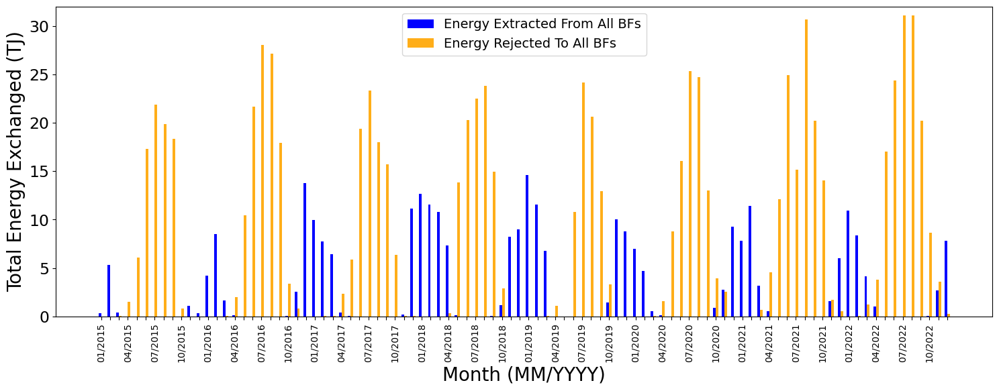

In [378]:
ticks = sums_2015_2022.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
n=96
r = np.arange(n)
width = 0.25
plt.bar(r - 0.15, sums_2015_2022['Total Energy From All Fields Abs (TJ)'], label = 'Energy Extracted From All BFs', color = 'blue', alpha = 1, width = 0.3)
plt.bar(r + 0.15, sums_2015_2022['Total Energy To All Fields (TJ)'], label = 'Energy Rejected To All BFs', color = 'orange', alpha = 0.9, width = 0.3)
plt.legend(fontsize=14)
plt.xlabel("Month (MM/YYYY)",  fontsize = 20)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 20)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
#plt.title("Total All BF Energy Exchanges by Month for 2015-2022" , fontsize = 30)
plt.xticks(r, ticks, rotation = 90, size = 7)
plt.xticks(r, [tick if i % 3 == 0 else '' for i, tick in enumerate(ticks)], rotation=90, size=10)
plt.ylim(0,32)
plt.show()

Write to CSV File

In [ ]:
# Specify the file path where you want to save the CSV file
file_path = "/Users/evanheeg/Documents/UWEpicGreenGeoData/EnergyFlows/sums_2015_2022.csv"

# Write the DataFrame to a CSV file including the index
sums_2015_2022.to_csv(file_path, index=True)

Calculations of Energy Extracted and Rejected

In [ ]:
# energy dissipated in BF4 from 2015-2022 in TJ
BF4_energy_dissipated = sums_2015_2022['BF4 Energy To Field (TJ)'].sum()

# energy extracted in BF4 from 2015-2022 in TJ
BF4_energy_extracted = sums_2015_2022['BF4 Energy From Field Abs (TJ)'].sum()

total_energy = BF4_energy_extracted + BF4_energy_dissipated

fraction_BF4_energy_dissipated = BF4_energy_dissipated / total_energy
fraction_BF4_energy_extracted = BF4_energy_extracted / total_energy

print('BF4 Energy Dissipated 2015-2022=', BF4_energy_dissipated, 'TJ')
print('BF4 Energy Extracted 2015-2022=', BF4_energy_extracted, 'TJ')

print('BF4 Fraction Energy Dissipated 2015-2022=', fraction_BF4_energy_dissipated, 'TJ')
print('B4F Fraction Energy Extracted 2015-2022=', fraction_BF4_energy_extracted, 'TJ')


BF4 Energy Dissipated 2015-2022= 522.8803148180142 TJ
BF4 Energy Extracted 2015-2022= 136.5389437782222 TJ
BF4 Fraction Energy Dissipated 2015-2022= 0.7929406185847762 TJ
B4F Fraction Energy Extracted 2015-2022= 0.2070593814152238 TJ


In [ ]:
# energy dissipated in BF4 from 2015-2022 in TJ
BF4_energy_dissipated = data_frame_2022month_sums['BF4 Energy To Field (TJ)'].sum()

# energy extracted in BF4 from 2015-2022 in TJ
BF4_energy_extracted = data_frame_2022month_sums['BF4 Energy From Field Abs (TJ)'].sum()

total_energy = BF4_energy_extracted + BF4_energy_dissipated

fraction_BF4_energy_dissipated = BF4_energy_dissipated / total_energy
fraction_BF4_energy_extracted = BF4_energy_extracted / total_energy

print('BF4 Energy Dissipated 2022=', BF4_energy_dissipated, 'TJ')
print('BF4 Energy Extracted 2022=', BF4_energy_extracted, 'TJ')

print('BF4 Fraction Energy Dissipated 2022=', fraction_BF4_energy_dissipated, 'TJ')
print('B4F Fraction Energy Extracted 2022=', fraction_BF4_energy_extracted, 'TJ')


BF4 Energy Dissipated 2022= 75.87339204409281 TJ
BF4 Energy Extracted 2022= 16.723005388685593 TJ
BF4 Fraction Energy Dissipated 2022= 0.8193989631094895 TJ
B4F Fraction Energy Extracted 2022= 0.1806010368905106 TJ


In [ ]:
# energy dissipated in Total from 2015-2022 in TJ
Total_energy_dissipated = sums_2015_2022['Total Energy To All Fields (TJ)'].sum()

# energy extracted in Total from 2015-2022 in TJ
Total_energy_extracted = sums_2015_2022['Total Energy From All Fields Abs (TJ)'].sum()

total_energy = Total_energy_extracted + Total_energy_dissipated

fraction_Total_energy_dissipated = Total_energy_dissipated / total_energy
fraction_Total_energy_extracted = Total_energy_extracted / total_energy

print('Total Energy Dissipated 2015-2022=', Total_energy_dissipated, 'TJ')
print('Total Energy Extracted 2015-2022=', Total_energy_extracted, 'TJ')

print('Total Fraction Energy Dissipated 2015-2022=', fraction_Total_energy_dissipated, 'TJ')
print('Total Fraction Energy Extracted 2015-2022=', fraction_Total_energy_extracted, 'TJ')

Total Energy Dissipated 2015-2022= 822.0912333058413 TJ
Total Energy Extracted 2015-2022= 279.4277266981259 TJ
Total Fraction Energy Dissipated 2015-2022= 0.7463250866811049 TJ
Total Fraction Energy Extracted 2015-2022= 0.25367491331889513 TJ


More Plots!!

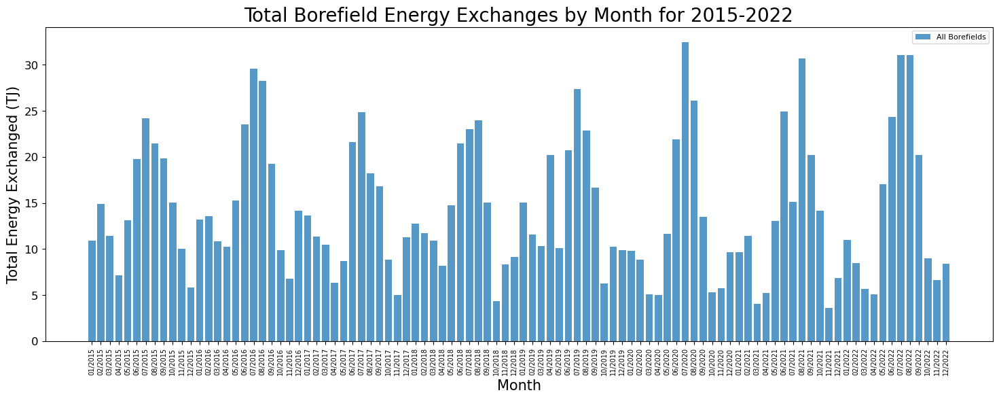

In [ ]:
ticks = sums_2015_2022.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.bar(sums_2015_2022.index, sums_2015_2022['Total Absolute Borefield Energy Exchange (TJ)'], label = 'All Borefields', alpha = 0.75)
plt.legend()
plt.xlabel("Month",  fontsize = 15)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Total Borefield Energy Exchanges by Month for 2015-2022" , fontsize = 20)
plt.xticks(ticks, rotation = 90, size = 7)
plt.show()

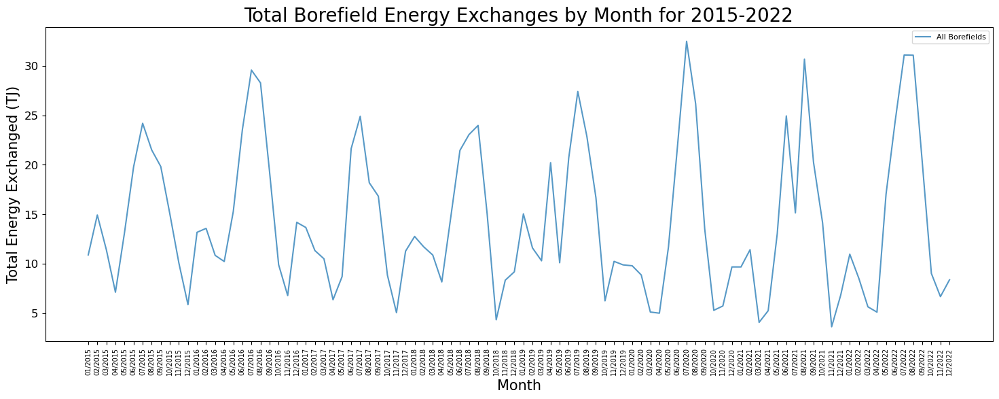

In [ ]:
ticks = sums_2015_2022.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.plot(sums_2015_2022.index, sums_2015_2022['Total Absolute Borefield Energy Exchange (TJ)'], label = 'All Borefields', alpha = 0.75)
plt.legend()
plt.xlabel("Month",  fontsize = 15)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Total Borefield Energy Exchanges by Month for 2015-2022" , fontsize = 20)
plt.xticks(ticks, rotation = 90, size = 7)
plt.show()

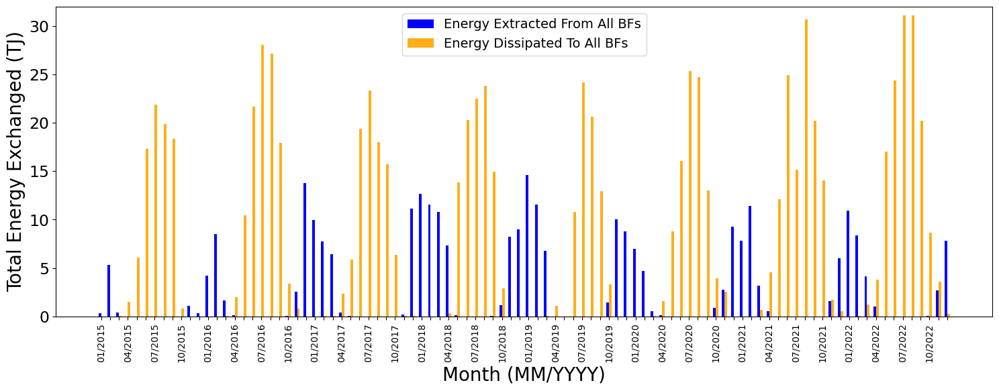

In [ ]:
ticks = sums_2015_2022.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
n=96
r = np.arange(n)
width = 0.25
plt.bar(r - 0.15, sums_2015_2022['Total Energy From All Fields Abs (TJ)'], label = 'Energy Extracted From All BFs', color = 'blue', alpha = 1, width = 0.3)
plt.bar(r + 0.15, sums_2015_2022['Total Energy To All Fields (TJ)'], label = 'Energy Dissipated To All BFs', color = 'orange', alpha = 0.9, width = 0.3)
plt.legend(fontsize=14)
plt.xlabel("Month (MM/YYYY)",  fontsize = 20)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 20)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
#plt.title("Total Energy Exchanges by Month for 2015-2022" , fontsize = 30)
# Select every 4th element for x-tick labels
plt.xticks(r, [tick if i % 3 == 0 else '' for i, tick in enumerate(ticks)], rotation=90, size=10)
plt.ylim(0,32)
plt.show()

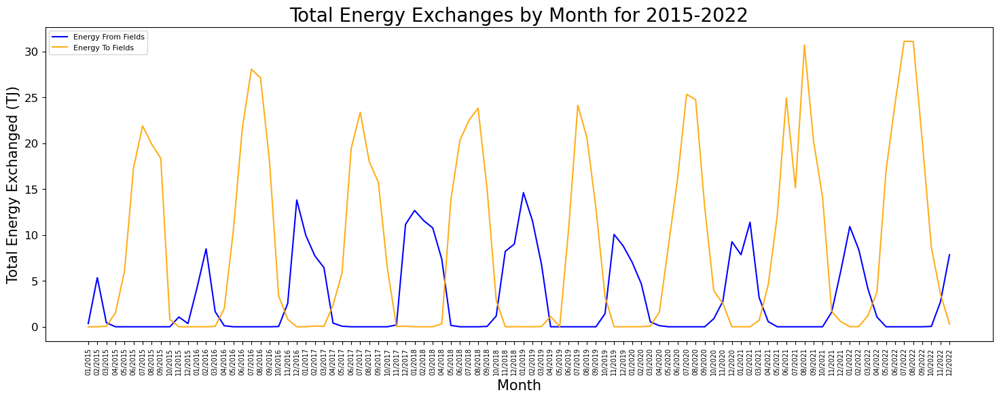

In [ ]:
ticks = sums_2015_2022.index

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.plot(sums_2015_2022['Total Energy From All Fields Abs (TJ)'], label = 'Energy From Fields', color = 'blue', alpha = 1)
plt.plot(sums_2015_2022['Total Energy To All Fields (TJ)'], label = 'Energy To Fields', color = 'orange', alpha = 0.9)
plt.legend()
plt.xlabel("Month",  fontsize = 15)
plt.ylabel("Total Energy Exchanged (TJ)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Total Energy Exchanges by Month for 2015-2022" , fontsize = 20)
plt.xticks(r, ticks, rotation = 90, size = 7)
plt.show()

These Next Plots are Mostly Experimentation

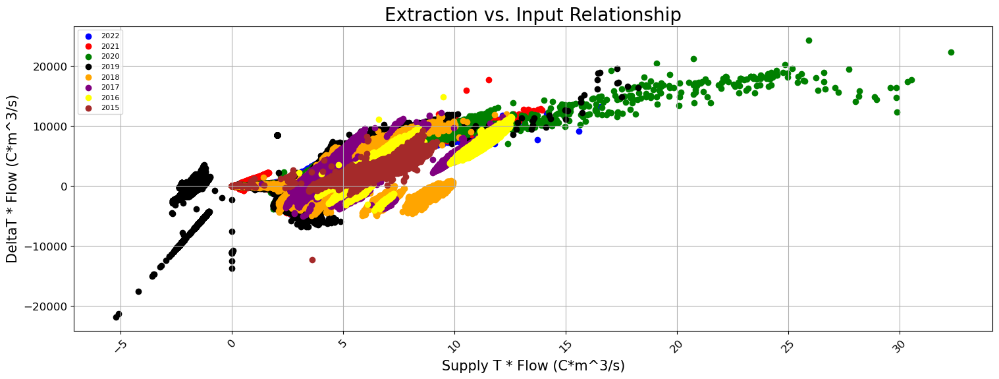

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2022['Flow.Supply'], data_frame_2022["Power"], color = "blue")
b = plt.scatter(data_frame_2021['Flow.Supply'], data_frame_2021["Power"], color = "red")
c = plt.scatter(data_frame_2020['Flow.Supply'], data_frame_2020["Power"], color = "green")
d = plt.scatter(data_frame_2019['Flow.Supply'], data_frame_2019["Power"], color = "black")
e = plt.scatter(data_frame_2018['Flow.Supply'], data_frame_2018["Power"], color = "orange")
f = plt.scatter(data_frame_2017['Flow.Supply'], data_frame_2017["Power"], color = "purple")
g = plt.scatter(data_frame_2016['Flow.Supply'], data_frame_2016["Power"], color = "yellow")
h = plt.scatter(data_frame_2015['Flow.Supply'], data_frame_2015["Power"], color = "brown")
plt.legend((a,b,c,d,e,f,g,h),("2022","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Supply T * Flow (C*m^3/s)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.grid()
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Extraction vs. Input Relationship" , fontsize = 20)
plt.xticks(rotation = 45,)
plt.xlim()
plt.show()

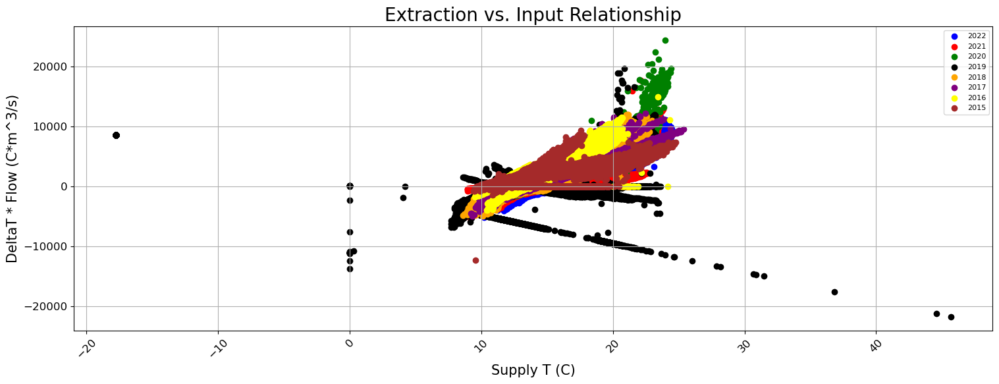

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2022["BF4 Supply Celcius"], data_frame_2022["Power"], color = "blue")
b = plt.scatter(data_frame_2021['BF4 Supply Celcius'], data_frame_2021["Power"], color = "red")
c = plt.scatter(data_frame_2020['BF4 Supply Celcius'], data_frame_2020["Power"], color = "green")
d = plt.scatter(data_frame_2019['BF4 Supply Celcius'], data_frame_2019["Power"], color = "black")
e = plt.scatter(data_frame_2018['BF4 Supply Celcius'], data_frame_2018["Power"], color = "orange")
f = plt.scatter(data_frame_2017['BF4 Supply Celcius'], data_frame_2017["Power"], color = "purple")
g = plt.scatter(data_frame_2016['BF4 Supply Celcius'], data_frame_2016["Power"], color = "yellow")
h = plt.scatter(data_frame_2015['BF4 Supply Celcius'], data_frame_2015["Power"], color = "brown")
plt.legend((a,b,c,d,e,f,g,h),("2022","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Extraction vs. Input Relationship" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
plt.xlim()
plt.show()

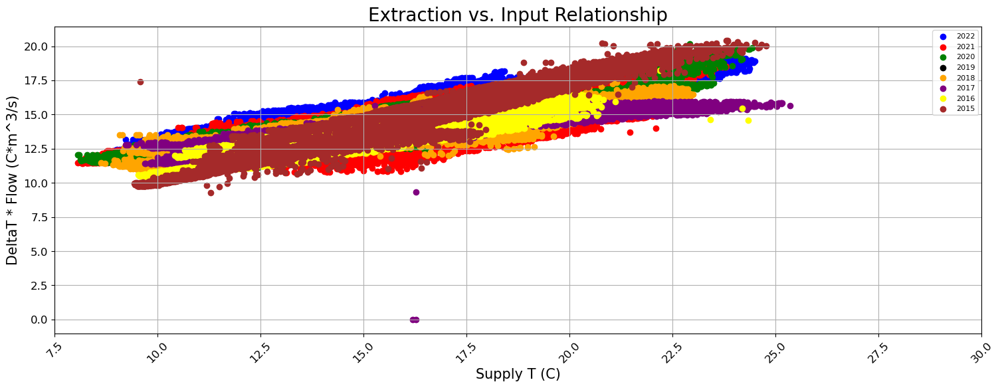

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2022["BF4 Supply Celcius"], data_frame_2022["BF4 Return Celcius"], color = "blue")
b = plt.scatter(data_frame_2021['BF4 Supply Celcius'], data_frame_2021["BF4 Return Celcius"], color = "red")
c = plt.scatter(data_frame_2020['BF4 Supply Celcius'], data_frame_2020["BF4 Return Celcius"], color = "green")
#d = plt.scatter(data_frame_2019['BF4 Supply Celcius'], data_frame_2019["BF4 Return Celcius"], color = "black")
e = plt.scatter(data_frame_2018['BF4 Supply Celcius'], data_frame_2018["BF4 Return Celcius"], color = "orange")
f = plt.scatter(data_frame_2017['BF4 Supply Celcius'], data_frame_2017["BF4 Return Celcius"], color = "purple")
g = plt.scatter(data_frame_2016['BF4 Supply Celcius'], data_frame_2016["BF4 Return Celcius"], color = "yellow")
h = plt.scatter(data_frame_2015['BF4 Supply Celcius'], data_frame_2015["BF4 Return Celcius"], color = "brown")
plt.legend((a,b,c,d,e,f,g,h),("2022","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Extraction vs. Input Relationship" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
plt.xlim(7.5,30)
plt.show()

Plots of dT and Power vs Supply Temp used in Stanford Paper

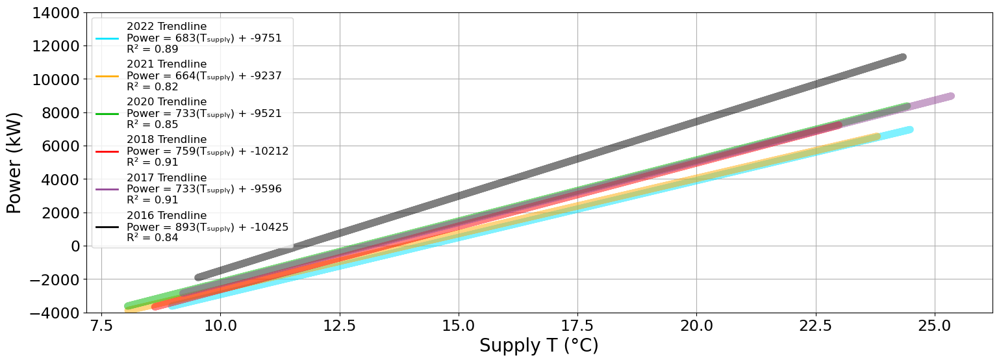

In [ ]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2022, data_frame_2021, data_frame_2020,
            data_frame_2018, data_frame_2017, data_frame_2016]

labels = ["2022", "2021", "2020", "2018", "2017", "2016"]

# Set distinct colors and line styles for the trendlines
trendline_colors = ['#00e5ff', '#ffaa00', '#00b803', '#ff0000', '#934896', '#000000']
trendline_labels = []
r2_values = []
equation_labels = []

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["Power"].fillna(dataset["Power"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["Power"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline label
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    equation_labels.append(f"Power = {slope:.0f}(Tₛᵤₚₚₗᵧ) + {intercept:.0f}")

    # Plot the trendline with transparency, adjusted linewidth, and line style
    plt.plot(x, model.predict(x), color=trendline_colors[i], linewidth=8, alpha=0.5)

# Create legend labels with r^2 values
legend_labels = [f"{trendline}\n{equation}\nR² = {r2:.2f}" for trendline, equation, r2 in zip(trendline_labels, equation_labels, r2_values)]

# Add custom legend with line styles
legend_lines = [Line2D([0], [0], color=color, linewidth=2) for color in trendline_colors]
plt.legend(legend_lines, legend_labels, fontsize=12)

# Add labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("Power (kW)", fontsize=20)
plt.ylim(-4000,14000)
plt.grid()
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)

plt.show()

In [ ]:
data_frame_2022['Power'] = data_frame_2022['Power']/(1e3)
data_frame_2021['Power'] = data_frame_2021['Power']/(1e3)
data_frame_2020['Power'] = data_frame_2020['Power']/(1e3)
data_frame_2018['Power'] = data_frame_2018['Power']/(1e3)
data_frame_2017['Power'] = data_frame_2017['Power']/(1e3)
data_frame_2016['Power'] = data_frame_2016['Power']/(1e3)

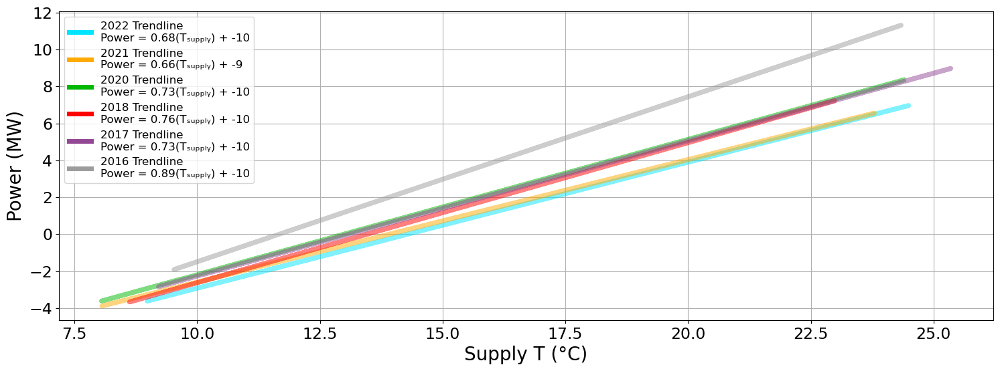

In [ ]:

# Create a list of data and labels for easy iteration
datasets = [data_frame_2022, data_frame_2021, data_frame_2020,
            data_frame_2018, data_frame_2017, data_frame_2016]

labels = ["2022", "2021", "2020", "2018", "2017", "2016"]


plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = ['#00e5ff', '#ffaa00', '#00b803', '#ff0000', '#934896', '#9c9c9c']
trendline_labels = []
r2_values = []
equation_labels = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["Power"].fillna(dataset["Power"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["Power"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    equation_labels.append(f"Power = {slope:.2f}(Tₛᵤₚₚₗᵧ) + {intercept:.0f}")

    # Plot the trendline
    plt.plot(x, model.predict(x), color=trendline_colors[i], linewidth=5, alpha=0.5)

# Create legend labels with r^2 values
legend_labels = [f"{trendline}\n{equation}" for trendline, equation in zip(trendline_labels, equation_labels)]

# Add custom legend
legend_lines = [Line2D([0], [0], color=color, linewidth=5) for color in trendline_colors]
plt.legend(legend_lines, legend_labels, fontsize=12)

# Add labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("Power (MW)", fontsize=20)
#plt.title("Trendlines for Power vs. Supply Temperature", fontsize=27)
plt.grid()
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
#plt.xlim(20,22.5)
#plt.ylim(4000,7000)
plt.show()


Zooming in On Different Sections

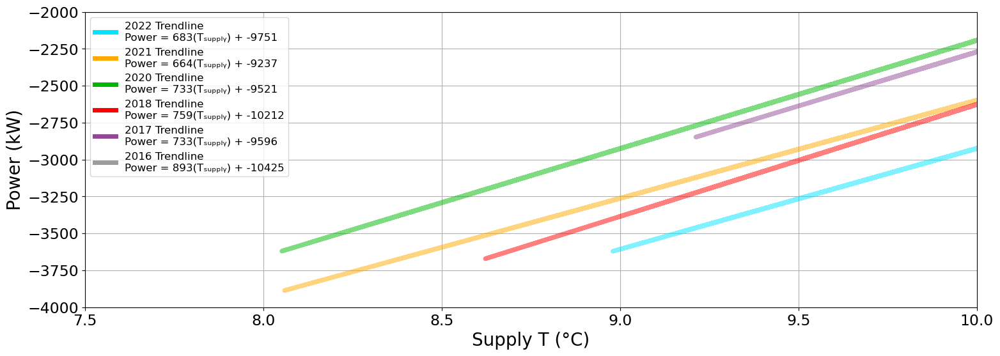

In [379]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2022, data_frame_2021, data_frame_2020,
            data_frame_2018, data_frame_2017, data_frame_2016]

labels = ["2022", "2021", "2020", "2018", "2017", "2016"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = ['#00e5ff', '#ffaa00', '#00b803', '#ff0000', '#934896', '#9c9c9c']
trendline_labels = []
r2_values = []
equation_labels = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["Power"].fillna(dataset["Power"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["Power"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    equation_labels.append(f"Power = {slope:.0f}(Tₛᵤₚₚₗᵧ) + {intercept:.0f}")

    # Plot the trendline
    plt.plot(x, model.predict(x), color=trendline_colors[i], linewidth=5, alpha=0.5)

# Create legend labels with r^2 values
legend_labels = [f"{trendline}\n{equation}" for trendline, equation in zip(trendline_labels, equation_labels)]

# Add custom legend
legend_lines = [Line2D([0], [0], color=color, linewidth=5) for color in trendline_colors]
plt.legend(legend_lines, legend_labels, fontsize=12)

# Add labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("Power (kW)", fontsize=20)
#plt.title("Trendlines for Power vs. Supply Temperature", fontsize=27)
plt.grid()
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
plt.xlim(7.5,10)
plt.ylim(-4000,-2000)
plt.show()

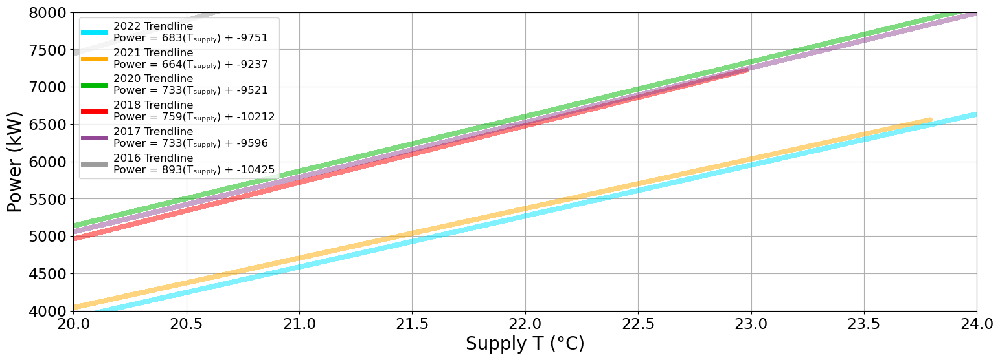

In [380]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2022, data_frame_2021, data_frame_2020,
            data_frame_2018, data_frame_2017, data_frame_2016]

labels = ["2022", "2021", "2020", "2018", "2017", "2016"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = ['#00e5ff', '#ffaa00', '#00b803', '#ff0000', '#934896', '#9c9c9c']
trendline_labels = []
r2_values = []
equation_labels = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["Power"].fillna(dataset["Power"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["Power"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    equation_labels.append(f"Power = {slope:.0f}(Tₛᵤₚₚₗᵧ) + {intercept:.0f}")

    # Plot the trendline
    plt.plot(x, model.predict(x), color=trendline_colors[i], linewidth=5, alpha=0.5)

# Create legend labels with r^2 values
legend_labels = [f"{trendline}\n{equation}" for trendline, equation in zip(trendline_labels, equation_labels)]

# Add custom legend
legend_lines = [Line2D([0], [0], color=color, linewidth=5) for color in trendline_colors]
plt.legend(legend_lines, legend_labels, fontsize=12)

# Add labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("Power (kW)", fontsize=20)
#plt.title("Trendlines for Power vs. Supply Temperature", fontsize=27)
plt.grid()
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
plt.xlim(20,24)
plt.ylim(4000,8000)
plt.show()

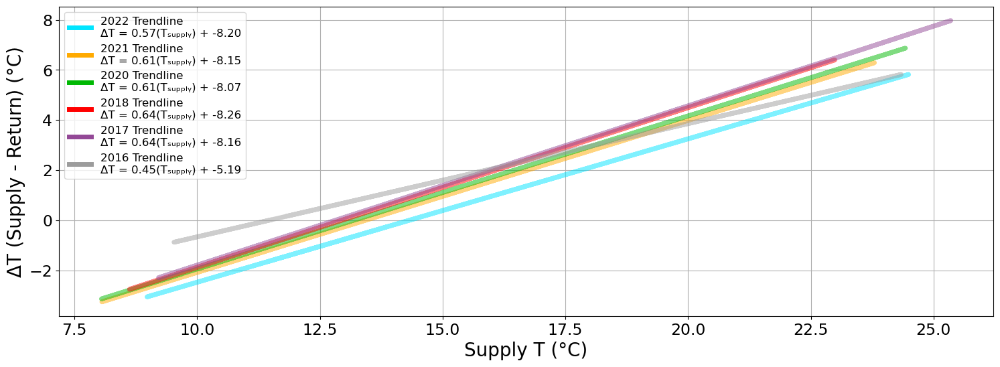

In [ ]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2022, data_frame_2021, data_frame_2020,
            data_frame_2018, data_frame_2017, data_frame_2016]

labels = ["2022", "2021", "2020", "2018", "2017", "2016"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = ['#00e5ff', '#ffaa00', '#00b803', '#ff0000', '#934896', '#9c9c9c']
trendline_labels = []
r2_values = []
equation_labels = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["deltaT"].fillna(dataset["deltaT"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["deltaT"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    intercept_0 = -intercept / slope
    equation_labels.append(f"ΔT = {slope:.2f}(Tₛᵤₚₚₗᵧ) + {intercept:.2f}")

    # Plot the trendline
    plt.plot(x, model.predict(x), color=trendline_colors[i], linewidth=5, alpha=0.5)

# Create legend labels with equations of the line
legend_labels = [f"{trendline}\n{equation}" for trendline, equation in zip(trendline_labels, equation_labels)]

# Add custom legend
legend_lines = [Line2D([0], [0], linestyle='-', color=color, linewidth=5) for color in trendline_colors]
plt.legend(legend_lines, legend_labels, fontsize=12, loc='upper left')

# Add labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("ΔT (Supply - Return) (°C)", fontsize=20)
#plt.title("Trendlines for ΔT vs. Supply Temperature", fontsize=27)
plt.grid()
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
plt.show()

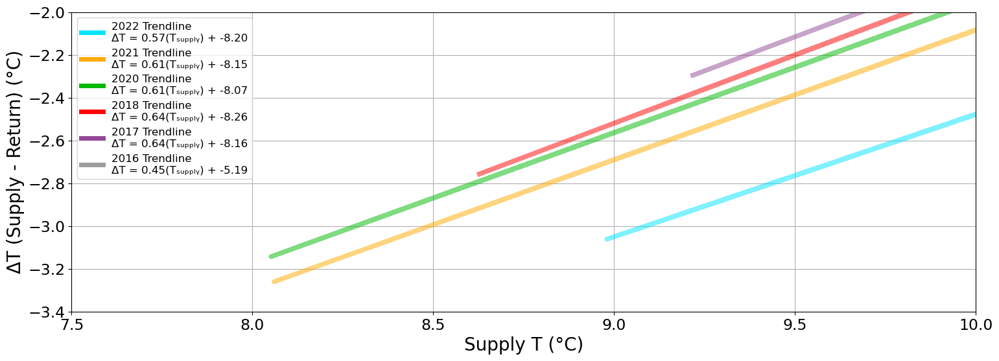

In [ ]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2022, data_frame_2021, data_frame_2020,
            data_frame_2018, data_frame_2017, data_frame_2016]

labels = ["2022", "2021", "2020", "2018", "2017", "2016"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = ['#00e5ff', '#ffaa00', '#00b803', '#ff0000', '#934896', '#9c9c9c']
trendline_labels = []
r2_values = []
equation_labels = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["deltaT"].fillna(dataset["deltaT"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["deltaT"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    intercept_0 = -intercept / slope
    equation_labels.append(f"ΔT = {slope:.2f}(Tₛᵤₚₚₗᵧ) + {intercept:.2f}")

    # Plot the trendline
    plt.plot(x, model.predict(x), color=trendline_colors[i], linewidth=5, alpha=0.5)

# Create legend labels with equations of the line
legend_labels = [f"{trendline}\n{equation}" for trendline, equation in zip(trendline_labels, equation_labels)]

# Add custom legend
legend_lines = [Line2D([0], [0], linestyle='-', color=color, linewidth=5) for color in trendline_colors]
plt.legend(legend_lines, legend_labels, fontsize=12, loc='upper left')

# Add labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("ΔT (Supply - Return) (°C)", fontsize=20)
#plt.title("Trendlines for ΔT vs. Supply Temperature", fontsize=27)
plt.grid()
plt.ylim(-3.4,-2)
plt.xlim(7.5,10)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
plt.show()

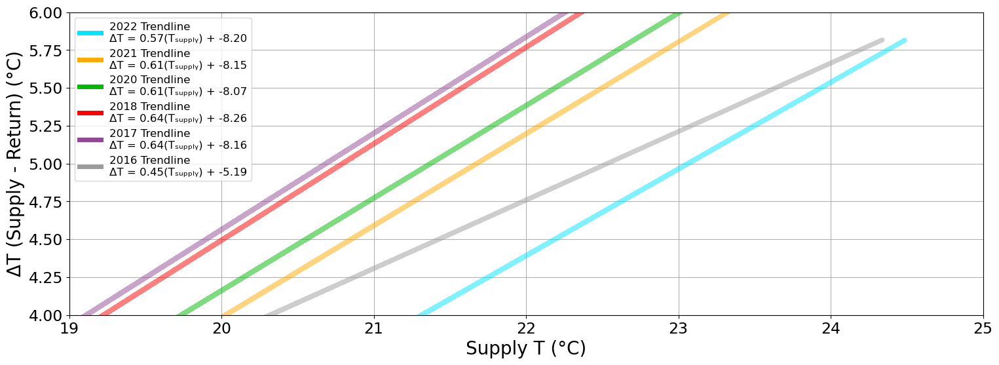

In [ ]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2022, data_frame_2021, data_frame_2020,
            data_frame_2018, data_frame_2017, data_frame_2016]

labels = ["2022", "2021", "2020", "2018", "2017", "2016"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = ['#00e5ff', '#ffaa00', '#00b803', '#ff0000', '#934896', '#9c9c9c']
trendline_labels = []
r2_values = []
equation_labels = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["deltaT"].fillna(dataset["deltaT"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["deltaT"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    intercept_0 = -intercept / slope
    equation_labels.append(f"ΔT = {slope:.2f}(Tₛᵤₚₚₗᵧ) + {intercept:.2f}")

    # Plot the trendline
    plt.plot(x, model.predict(x), color=trendline_colors[i], linewidth=5, alpha=0.5)

# Create legend labels with equations of the line
legend_labels = [f"{trendline}\n{equation}" for trendline, equation in zip(trendline_labels, equation_labels)]

# Add custom legend
legend_lines = [Line2D([0], [0], linestyle='-', color=color, linewidth=5) for color in trendline_colors]
plt.legend(legend_lines, legend_labels, fontsize=12, loc='upper left')

# Add labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("ΔT (Supply - Return) (°C)", fontsize=20)
#plt.title("Trendlines for ΔT vs. Supply Temperature", fontsize=27)
plt.grid()
plt.ylim(4,6)
plt.xlim(19,25)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
plt.show()

Plotting the Slope Values of the Trendlines for Each Year

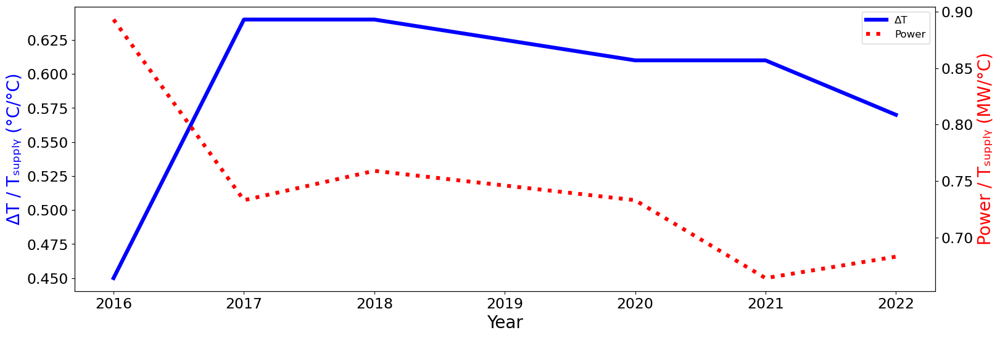

In [ ]:
dT_slopes = [0.45, 0.64, 0.64, 0.61, 0.61, 0.57]
power_slopes = [0.893, 0.733, 0.759, 0.733, 0.664, 0.683]
year_labels = [2016, 2017, 2018, 2020, 2021, 2022]

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

# Plotting with increased line thickness and different line types
line1, = ax1.plot(year_labels, dT_slopes, color='blue', linestyle='-', linewidth=4.5, label='ΔT')
line2, = ax2.plot(year_labels, power_slopes, color='red', linestyle=':', linewidth=4.5, label='Power')

# Combining into one legend
lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc='upper right', fontsize=12)  # Adjust the location as needed

# Add labels and legends
ax1.set_ylabel('ΔT / Tₛᵤₚₚₗᵧ (°C/°C)', color='blue', fontsize=20)
ax2.set_ylabel('Power / Tₛᵤₚₚₗᵧ (MW/°C)', color='red', fontsize=20)
ax1.set_xlabel('Year', fontsize=20)
#ax1.set_title('Slopes by Year for deltaT and Power', fontsize=27)

ax1.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='x', which='major', labelsize=17)
ax1.tick_params(axis='x', which='major', labelsize=17) 

plt.show()

In [ ]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2016, data_frame_2017, data_frame_2018, data_frame_2020, data_frame_2021, data_frame_2022]

labels = ["2016", "2017", "2018", "2020", "2021", "2022"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = []
trendline_labels = []
r2_values = []

# Create an empty DataFrame to store intercept_0 values
intercept_dT = pd.DataFrame(columns=['Label', 'Intercept_0'])
slope_dT = pd.DataFrame(columns=['Label', 'Slope'])

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["deltaT"].fillna(dataset["deltaT"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["deltaT"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store the intercept_0 value
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    intercept_0 = -intercept / slope

    # Append the values to the DataFrame
    intercept_dT = intercept_dT.append({'Label': label, 'Intercept_0': intercept_0}, ignore_index=True)
    slope_dT = slope_dT.append({'Label': label, 'Slope': slope}, ignore_index=True)

    # Store trendline color and label
    color = plt.cm.tab10(i)
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    equation_labels.append(f"ΔT = {slope:.2f}(Tₛᵤₚₚₗᵧ) + {intercept:.2f}")

# Display the DataFrame
print(slope_dT)


  Label     Slope
0  2016  0.452210
1  2017  0.636207
2  2018  0.637543
3  2020  0.611345
4  2021  0.606737
5  2022  0.572498


/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/3223183441.py:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  intercept_dT = intercept_dT.append({'Label': label, 'Intercept_0': intercept_0}, ignore_index=True)
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/3223183441.py:43: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  slope_dT = slope_dT.append({'Label': label, 'Slope': slope}, ignore_index=True)
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/3223183441.py:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  intercept_dT = intercept_dT.append({'Label': label, 'Intercept_0': intercept_0}, ignore_index=True)
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/3

Find the X-Intercepts of the Trendlines

In [ ]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2016, data_frame_2017, data_frame_2018, data_frame_2020, data_frame_2021, data_frame_2022]

labels = ["2016", "2017", "2018", "2020", "2021", "2022"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = []
trendline_labels = []
r2_values = []

# Create an empty DataFrame to store intercept_0 values
intercept_power = pd.DataFrame(columns=['Label', 'Intercept_1'])
slope_power = pd.DataFrame(columns=['Label', 'Slope'])

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["Power"].fillna(dataset["Power"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["Power"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store the intercept_0 value
    slope = model.coef_[0][0]
    intercept = model.intercept_[0]
    intercept_1 = -intercept / slope

    # Append the values to the DataFrame
    intercept_power = intercept_power.append({'Label': label, 'Intercept_1': intercept_1}, ignore_index=True)
    slope_power = slope_power.append({'Label': label, 'Slope': slope}, ignore_index=True)

    # Store trendline color and label
    color = plt.cm.tab10(i)
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Store the equation of the line
    equation_labels.append(f"ΔT = {slope:.2f}(Tₛᵤₚₚₗᵧ) + {intercept:.2f}")

# Display the DataFrame
print(intercept_power)

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1180360906.py:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  intercept_power = intercept_power.append({'Label': label, 'Intercept_1': intercept_1}, ignore_index=True)
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1180360906.py:43: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  slope_power = slope_power.append({'Label': label, 'Slope': slope}, ignore_index=True)
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1180360906.py:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  intercept_power = intercept_power.append({'Label': label, 'Intercept_1': intercept_1}, ignore_index=True)
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T

  Label  Intercept_1
0  2016    11.669639
1  2017    13.098616
2  2018    13.461574
3  2020    12.990951
4  2021    13.913058
5  2022    14.283121


Plot X-Intercept Values over Time

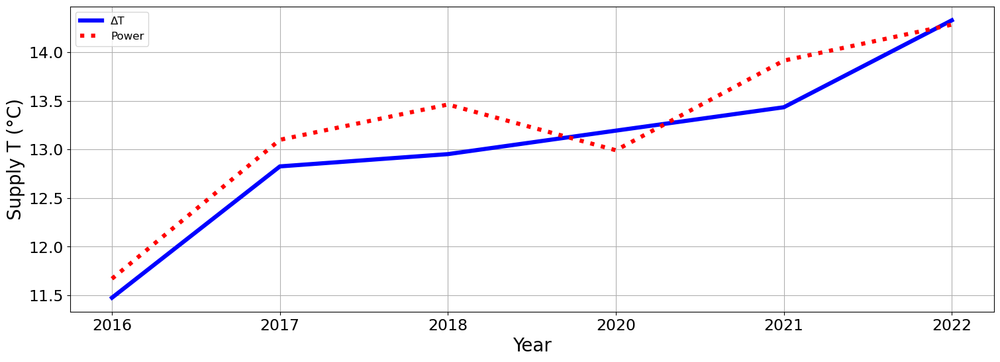

In [ ]:
# Plotting with increased line thickness and different line types
plt.plot(intercept_dT['Label'], intercept_dT['Intercept_0'], color='blue', linestyle='-', linewidth=4.5, label='ΔT')
plt.plot(intercept_power['Label'], intercept_power['Intercept_1'], color='red', linestyle=':', linewidth=4.5, label='Power')

plt.legend(fontsize=12)

# Add labels and title
plt.xlabel("Year", fontsize=20)
plt.ylabel("Supply T (°C)", fontsize=20)
#plt.title("Trendlines for ΔT vs. Supply Temperature", fontsize=27)
plt.grid()
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
plt.show()

plt.show()

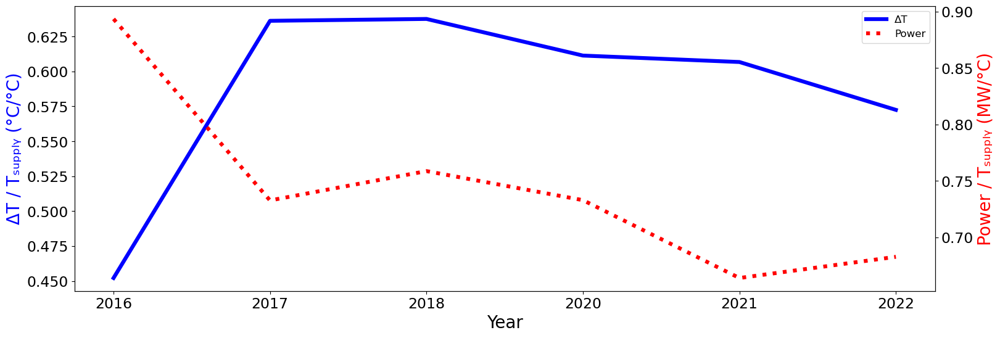

In [ ]:

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

# Plotting with increased line thickness and different line types
line1, = ax1.plot(slope_dT['Label'], slope_dT['Slope'], color='blue', linestyle='-', linewidth=4.5, label='ΔT')
line2, = ax2.plot(slope_power['Label'], slope_power['Slope'], color='red', linestyle=':', linewidth=4.5, label='Power')

# Combining into one legend
lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc='upper right', fontsize=12)  # Adjust the location as needed

# Add labels and legends
ax1.set_ylabel('ΔT / Tₛᵤₚₚₗᵧ (°C/°C)', color='blue', fontsize=20)
ax2.set_ylabel('Power / Tₛᵤₚₚₗᵧ (MW/°C)', color='red', fontsize=20)
ax1.set_xlabel('Year', fontsize=20)
#ax1.set_title('Slopes by Year for deltaT and Power', fontsize=27)

ax1.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='x', which='major', labelsize=17)
ax1.tick_params(axis='x', which='major', labelsize=17) 

plt.show()

Next Plots were Experimentation

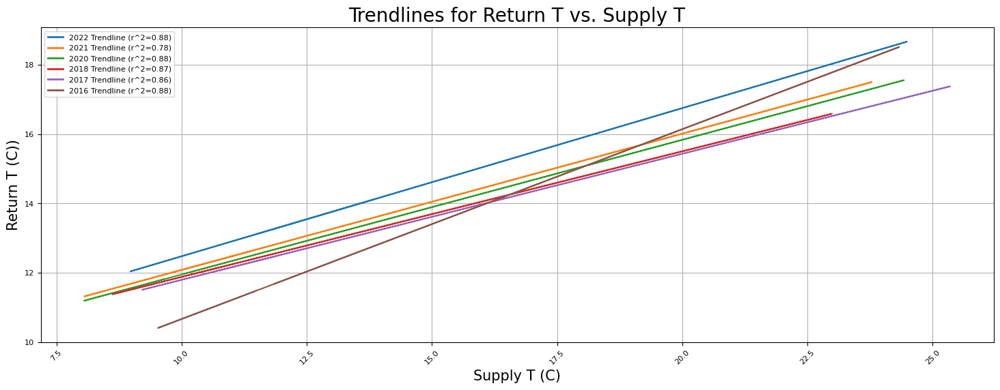

In [ ]:
# Create a list of data and labels for easy iteration
datasets = [data_frame_2022, data_frame_2021, data_frame_2020,
            data_frame_2018, data_frame_2017, data_frame_2016,]

labels = ["2022", "2021", "2020", "2018", "2017", "2016"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = []
trendline_labels = []
r2_values = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["BF4 Return Celcius"].fillna(dataset["BF4 Return Celcius"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["BF4 Return Celcius"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Plot the trendline
    plt.plot(x, model.predict(x), color=color)

# Create legend labels with r^2 values
legend_labels = [f"{label} Trendline (r^2={r2:.2f})" for label, r2 in zip(labels, r2_values)]

# Add custom legend
legend_lines = [Line2D([0], [0], color=color, linewidth=2) for color in trendline_colors]
plt.legend(legend_lines, legend_labels)

# Add labels and title
plt.xlabel("Supply T (C)", fontsize=15)
plt.ylabel("Return T (C))", fontsize=15)
plt.title("Trendlines for Return T vs. Supply T", fontsize=20)
plt.grid()
plt.xticks(rotation=45)
plt.xlim()
plt.show()

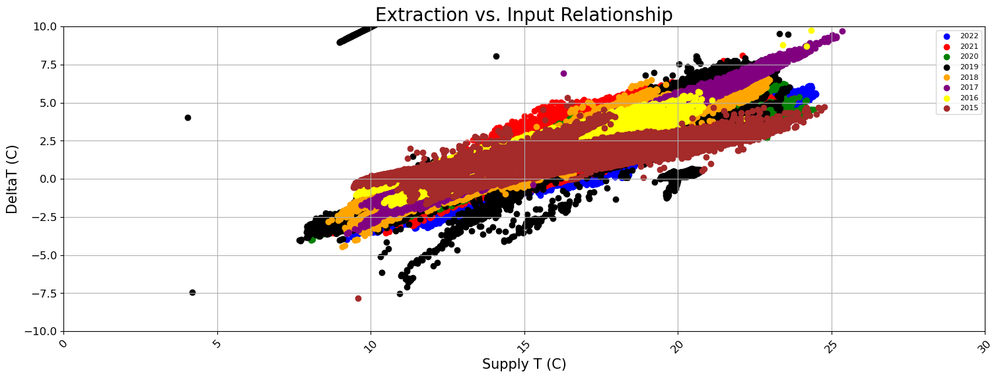

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2022['BF4 Supply Celcius'], data_frame_2022["deltaT"], color = "blue")
b = plt.scatter(data_frame_2021['BF4 Supply Celcius'], data_frame_2021["deltaT"], color = "red")
c = plt.scatter(data_frame_2020['BF4 Supply Celcius'], data_frame_2020["deltaT"], color = "green")
d = plt.scatter(data_frame_2019['BF4 Supply Celcius'], data_frame_2019["deltaT"], color = "black")
e = plt.scatter(data_frame_2018['BF4 Supply Celcius'], data_frame_2018["deltaT"], color = "orange")
f = plt.scatter(data_frame_2017['BF4 Supply Celcius'], data_frame_2017["deltaT"], color = "purple")
g = plt.scatter(data_frame_2016['BF4 Supply Celcius'], data_frame_2016["deltaT"], color = "yellow")
h = plt.scatter(data_frame_2015['BF4 Supply Celcius'], data_frame_2015["deltaT"], color = "brown")
plt.legend((a,b,c,d,e,f,g,h),("2022","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT (C)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Extraction vs. Input Relationship" , fontsize = 20)
plt.xticks(rotation = 45,)
plt.grid()
plt.xlim(0,30)
plt.ylim(-10,10)
plt.show()

In [ ]:
data_frame_2022_dropzeroes = data_frame_2022.copy()
data_frame_2021_dropzeroes = data_frame_2021.copy()
data_frame_2020_dropzeroes = data_frame_2020.copy()
data_frame_2019_dropzeroes = data_frame_2019.copy()
data_frame_2018_dropzeroes = data_frame_2018.copy()
data_frame_2017_dropzeroes = data_frame_2017.copy()
data_frame_2016_dropzeroes = data_frame_2016.copy()
data_frame_2015_dropzeroes = data_frame_2015.copy()


data_frame_2022_dropzeroes.drop(data_frame_2022_dropzeroes[(data_frame_2022_dropzeroes['Power'] > -0.003) & (data_frame_2022_dropzeroes['Power'] < 0.003)].index, inplace = True)
data_frame_2021_dropzeroes.drop(data_frame_2021_dropzeroes[(data_frame_2021_dropzeroes['Power'] > -0.01) & (data_frame_2021_dropzeroes['Power'] < 0.01)].index, inplace = True)
data_frame_2020_dropzeroes.drop(data_frame_2020_dropzeroes[(data_frame_2020_dropzeroes['Power'] > -0.01) & (data_frame_2020_dropzeroes['Power'] < 0.01)].index, inplace = True)
data_frame_2019_dropzeroes.drop(data_frame_2019_dropzeroes[(data_frame_2018_dropzeroes['Power'] > -0.01) & (data_frame_2019_dropzeroes['Power'] < 0.01)].index, inplace = True)
data_frame_2018_dropzeroes.drop(data_frame_2018_dropzeroes[(data_frame_2018_dropzeroes['Power'] > -0.01) & (data_frame_2018_dropzeroes['Power'] < 0.01)].index, inplace = True)
data_frame_2017_dropzeroes.drop(data_frame_2017_dropzeroes[(data_frame_2017_dropzeroes['Power'] > -0.01) & (data_frame_2017_dropzeroes['Power'] < 0.01)].index, inplace = True)
data_frame_2016_dropzeroes.drop(data_frame_2016_dropzeroes[(data_frame_2016_dropzeroes['Power'] > -0.01) & (data_frame_2016_dropzeroes['Power'] < 0.01)].index, inplace = True)
data_frame_2015_dropzeroes.drop(data_frame_2015_dropzeroes[(data_frame_2015_dropzeroes['Power'] > -0.01) & (data_frame_2015_dropzeroes['Power'] < 0.01)].index, inplace = True)





/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/1016596208.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_frame_2019_dropzeroes.drop(data_frame_2019_dropzeroes[(data_frame_2018_dropzeroes['Power'] > -0.01) & (data_frame_2019_dropzeroes['Power'] < 0.01)].index, inplace = True)


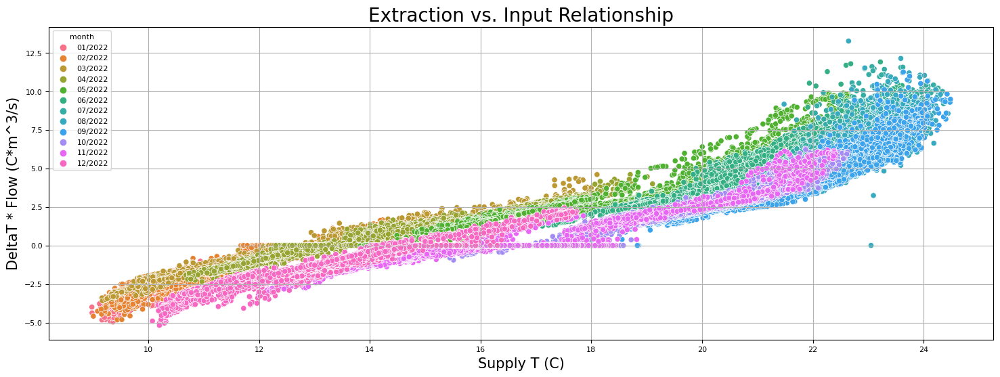

In [ ]:
x=data_frame_2022["BF4 Supply Celcius"]
y=data_frame_2022['Power']
h=data_frame_2022['month']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.title("Extraction vs. Input Relationship" , fontsize = 20)
plt.grid()

In [ ]:


#Add Quarter to 2022 data frame

data_frame_2022_dropzeroes['quarter'] = data_frame_2022_dropzeroes.index.quarter.astype(int).copy()

Data Point Cloud with Trendline Over

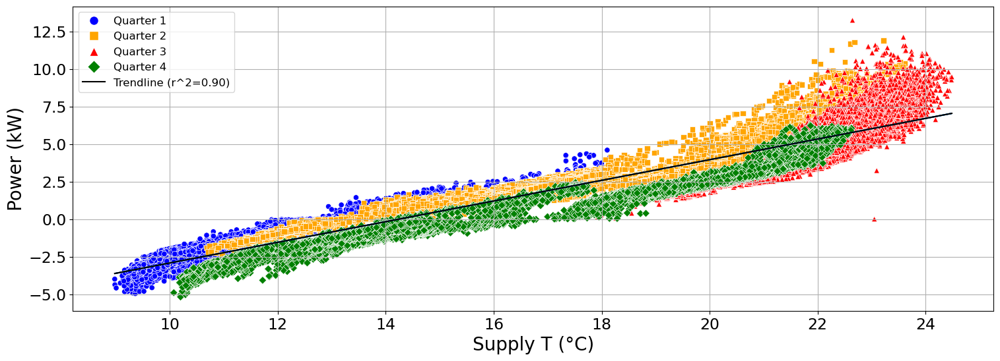

In [ ]:
# Assuming data_frame_2022_dropzeroes is your DataFrame containing 2022 data
x1 = data_frame_2022_dropzeroes["BF4 Supply Celcius"]
y1 = data_frame_2022_dropzeroes['Power']
h1 = data_frame_2022_dropzeroes['quarter']

# Create a list of data and labels for easy iteration
datasets = [data_frame_2022_dropzeroes]
labels = ["2022"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = []
trendline_labels = []
r2_values = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["Power"].fillna(dataset["Power"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["Power"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Plot the trendline
    plt.plot(x, model.predict(x), color=color)

    # Plot the linear trendline over the 2022 data
    x_line = np.linspace(min(x), max(x), 100).reshape(-1, 1)
    plt.plot(x_line, model.predict(x_line), color='black', alpha=1)

# Corrected markers parameter
markers = {1: 'o', 2: 's', 3: '^', 4: 'D'}

# Create the scatter plot with corrected markers
ax = sns.scatterplot(x=x1, y=y1, hue=h1, style=h1, markers=markers, palette={1: 'blue', 2: 'orange', 3: 'red', 4: 'green'})

# Create custom legend for quarters with shapes
legend_handles = [
   plt.Line2D([0], [0], marker=marker, color='w', label=f'Quarter {i+1}', markerfacecolor=color, markersize=10)
  for i, (color, marker) in enumerate(zip(['blue', 'orange', 'red', 'green'], ['o', 's', '^', 'D']))
]

# Add a black line to the legend
legend_handles.append(plt.Line2D([0], [0], color='black', label='Trendline (r^2=0.90)'))

# Create legend
plt.legend(handles=legend_handles, loc='upper left', fontsize = 12)

# Set labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("Power (kW)", fontsize=20)
#plt.title("Power vs. Supply Temperature for 2022", fontsize=27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)

# Show the plot
plt.grid()
plt.show()

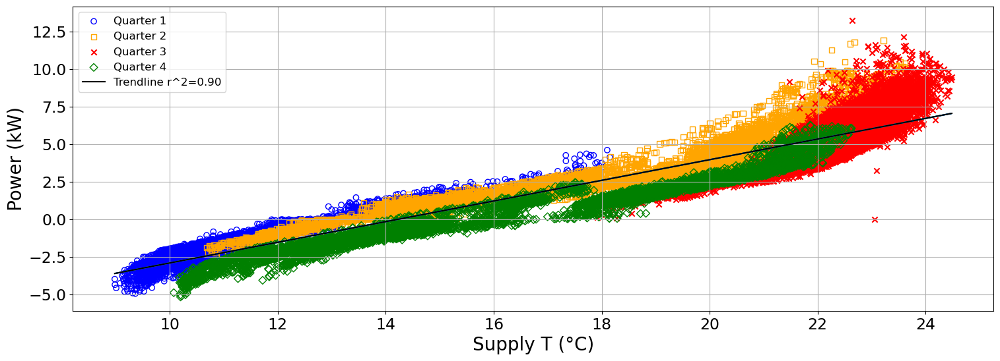

In [ ]:
df_q1 = data_frame_2022_dropzeroes[data_frame_2022_dropzeroes['quarter'] == 1].copy()
df_q2 = data_frame_2022_dropzeroes[data_frame_2022_dropzeroes['quarter'] == 2].copy()
df_q3 = data_frame_2022_dropzeroes[data_frame_2022_dropzeroes['quarter'] == 3].copy()
df_q4 = data_frame_2022_dropzeroes[data_frame_2022_dropzeroes['quarter'] == 4].copy()

plt.scatter(df_q1['BF4 Supply Celcius'], df_q1['Power'], edgecolor='blue', facecolor='none', label = 'Quarter 1')
plt.scatter(df_q2['BF4 Supply Celcius'], df_q2['Power'], edgecolor='orange', facecolor='none', marker='s', label = 'Quarter 2')
plt.scatter(df_q3['BF4 Supply Celcius'], df_q3['Power'], color='red', marker='x', label = 'Quarter 3')
plt.scatter(df_q4['BF4 Supply Celcius'], df_q4['Power'], edgecolor='green', facecolor='none', marker='D', label = 'Quarter 4')


# Set labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("Power (kW)", fontsize=20)
#plt.title("Power vs. Supply Temperature for 2022", fontsize=27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)

# Assuming data_frame_2022_dropzeroes is your DataFrame containing 2022 data
x1 = data_frame_2022_dropzeroes["BF4 Supply Celcius"]
y1 = data_frame_2022_dropzeroes['Power']
h1 = data_frame_2022_dropzeroes['quarter']

# Create a list of data and labels for easy iteration
datasets = [data_frame_2022_dropzeroes]
labels = ["2022"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = []
trendline_labels = []
r2_values = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["Power"].fillna(dataset["Power"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["Power"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Plot the trendline
    plt.plot(x, model.predict(x), color=color)

    # Plot the linear trendline over the 2022 data
    x_line = np.linspace(min(x), max(x), 100).reshape(-1, 1)
    
plt.plot(x_line, model.predict(x_line), color='black', alpha=1, label= 'Trendline r^2=0.90')

plt.legend(fontsize=12)

# Show the plot
plt.grid()
plt.show()

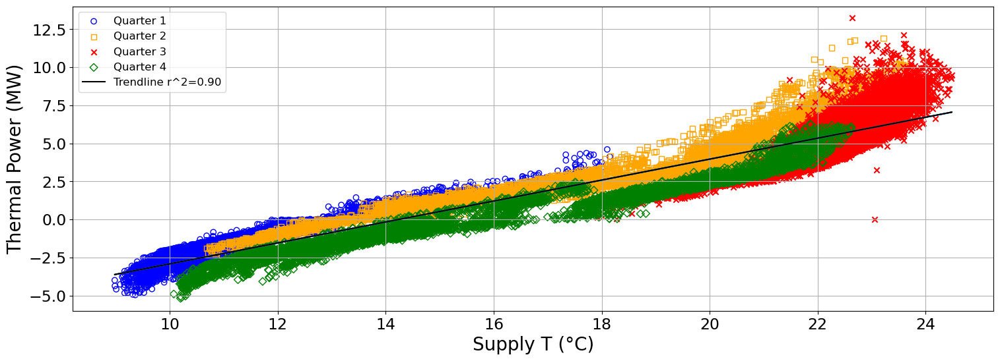

In [ ]:
df_q1 = data_frame_2022_dropzeroes[data_frame_2022_dropzeroes['quarter'] == 1].copy()
df_q2 = data_frame_2022_dropzeroes[data_frame_2022_dropzeroes['quarter'] == 2].copy()
df_q3 = data_frame_2022_dropzeroes[data_frame_2022_dropzeroes['quarter'] == 3].copy()
df_q4 = data_frame_2022_dropzeroes[data_frame_2022_dropzeroes['quarter'] == 4].copy()

plt.scatter(df_q1['BF4 Supply Celcius'], df_q1['Power'], edgecolor='blue', facecolor='none', label = 'Quarter 1')
plt.scatter(df_q2['BF4 Supply Celcius'], df_q2['Power'], edgecolor='orange', facecolor='none', marker='s', label = 'Quarter 2')
plt.scatter(df_q3['BF4 Supply Celcius'], df_q3['Power'], color='red', marker='x', label = 'Quarter 3')
plt.scatter(df_q4['BF4 Supply Celcius'], df_q4['Power'], edgecolor='green', facecolor='none', marker='D', label = 'Quarter 4')


# Set labels and title
plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("Thermal Power (MW)", fontsize=20)
#plt.title("Power vs. Supply Temperature for 2022", fontsize=27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)

# Assuming data_frame_2022_dropzeroes is your DataFrame containing 2022 data
x1 = data_frame_2022_dropzeroes["BF4 Supply Celcius"]
y1 = data_frame_2022_dropzeroes['Power']
h1 = data_frame_2022_dropzeroes['quarter']

# Create a list of data and labels for easy iteration
datasets = [data_frame_2022_dropzeroes]
labels = ["2022"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = []
trendline_labels = []
r2_values = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["Power"].fillna(dataset["Power"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["Power"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Plot the trendline
    plt.plot(x, model.predict(x), color=color)

    # Plot the linear trendline over the 2022 data
    x_line = np.linspace(min(x), max(x), 100).reshape(-1, 1)
    
plt.plot(x_line, model.predict(x_line), color='black', alpha=1, label= 'Trendline r^2=0.90')

plt.legend(loc='upper left', fontsize=12)
plt.ylim(-6,14)

# Show the plot
plt.grid()
plt.show()

In [ ]:
print(r2_values)

[0.9016150585875592]


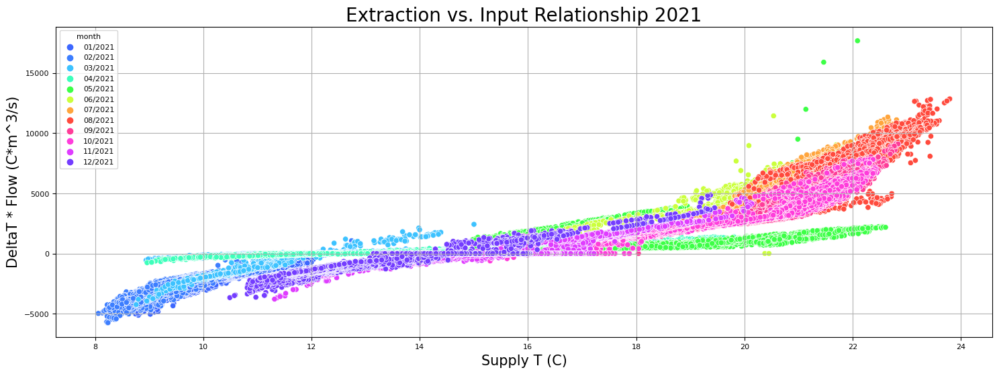

In [ ]:
x=data_frame_2021_dropzeroes["BF4 Supply Celcius"]
y=data_frame_2021_dropzeroes['Power']
h=data_frame_2021_dropzeroes['month']

sns.scatterplot(x=x, y=y, hue=h, palette = ['#3d67ff', '#3d7eff', '#3dc2ff', '#3dffbb', '#3dff47', '#cbff3d', '#ffa53d', '#ff4a3d', '#ff3d98', '#ff3ddb', '#df3dff', '#743dff'])
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.title("Extraction vs. Input Relationship 2021" , fontsize = 20)
plt.grid()

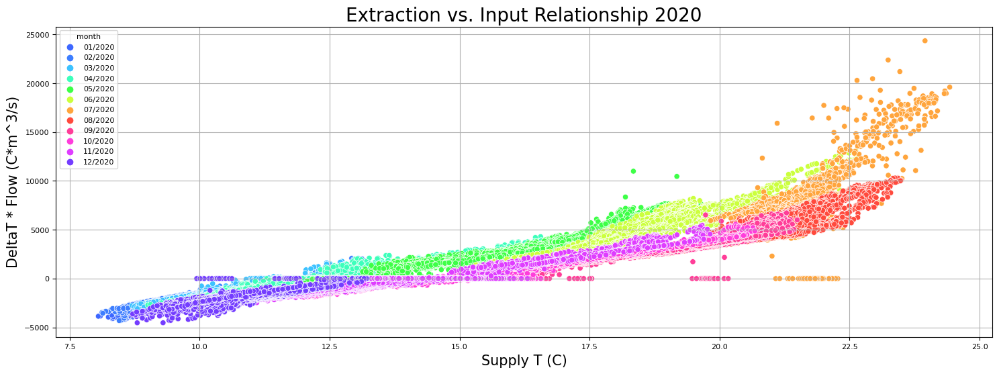

In [ ]:
x=data_frame_2020_dropzeroes["BF4 Supply Celcius"]
y=data_frame_2020_dropzeroes['Power']
h=data_frame_2020_dropzeroes['month']

sns.scatterplot(x=x, y=y, hue=h, palette = ['#3d67ff', '#3d7eff', '#3dc2ff', '#3dffbb', '#3dff47', '#cbff3d', '#ffa53d', '#ff4a3d', '#ff3d98', '#ff3ddb', '#df3dff', '#743dff'])
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.title("Extraction vs. Input Relationship 2020" , fontsize = 20)
plt.grid()

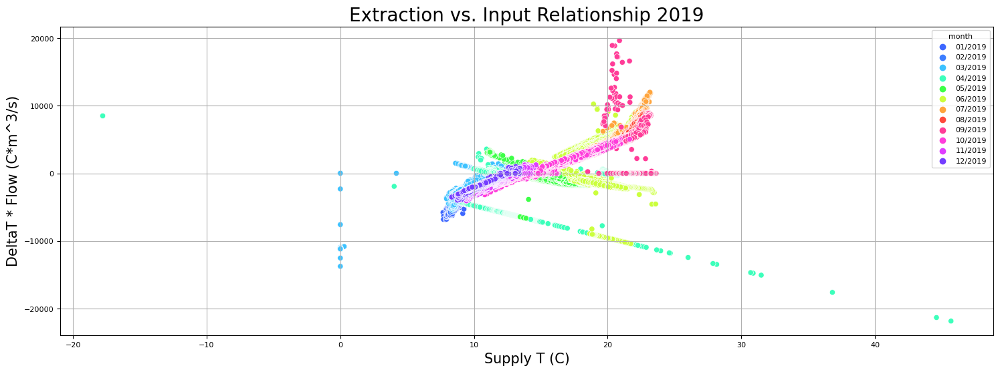

In [ ]:
x=data_frame_2019_dropzeroes["BF4 Supply Celcius"]
y=data_frame_2019_dropzeroes['Power']
h=data_frame_2019_dropzeroes['month']

sns.scatterplot(x=x, y=y, hue=h, palette = ['#3d67ff', '#3d7eff', '#3dc2ff', '#3dffbb', '#3dff47', '#cbff3d', '#ffa53d', '#ff4a3d', '#ff3d98', '#ff3ddb', '#df3dff', '#743dff'])
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.title("Extraction vs. Input Relationship 2019" , fontsize = 20)
plt.grid()

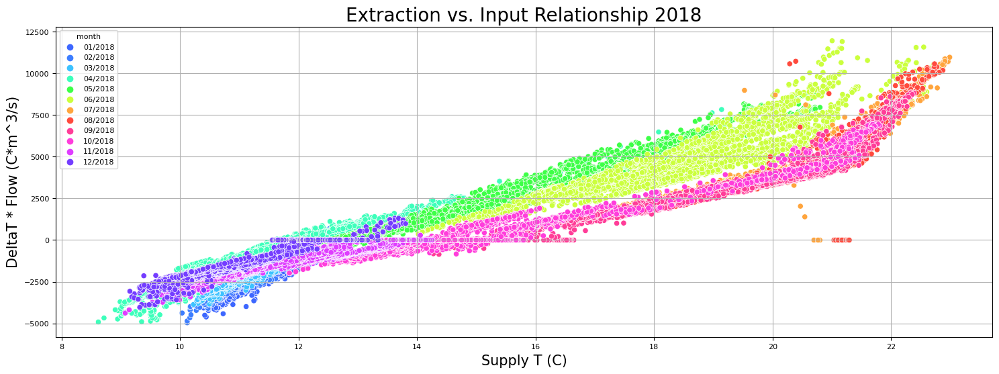

In [ ]:
x=data_frame_2018_dropzeroes["BF4 Supply Celcius"]
y=data_frame_2018_dropzeroes['Power']
h=data_frame_2018_dropzeroes['month']

sns.scatterplot(x=x, y=y, hue=h, palette = ['#3d67ff', '#3d7eff', '#3dc2ff', '#3dffbb', '#3dff47', '#cbff3d', '#ffa53d', '#ff4a3d', '#ff3d98', '#ff3ddb', '#df3dff', '#743dff'])
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.title("Extraction vs. Input Relationship 2018" , fontsize = 20)
plt.grid()

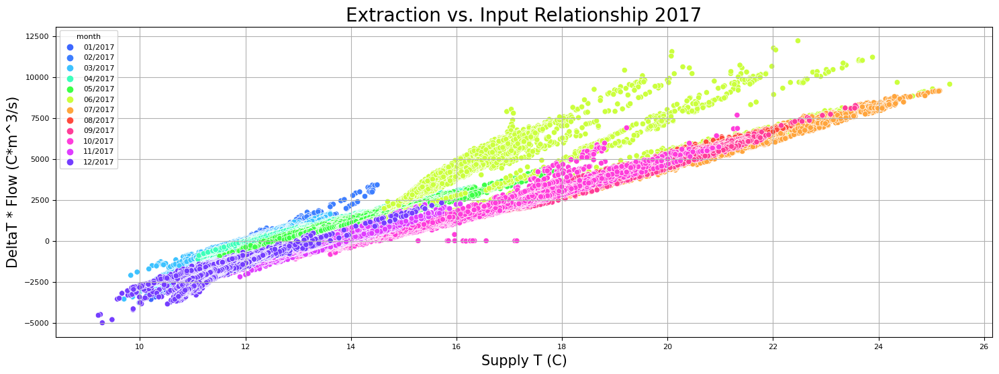

In [ ]:
x=data_frame_2017_dropzeroes["BF4 Supply Celcius"]
y=data_frame_2017_dropzeroes['Power']
h=data_frame_2017_dropzeroes['month']

sns.scatterplot(x=x, y=y, hue=h, palette = ['#3d67ff', '#3d7eff', '#3dc2ff', '#3dffbb', '#3dff47', '#cbff3d', '#ffa53d', '#ff4a3d', '#ff3d98', '#ff3ddb', '#df3dff', '#743dff'])
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.title("Extraction vs. Input Relationship 2017" , fontsize = 20)
plt.grid()

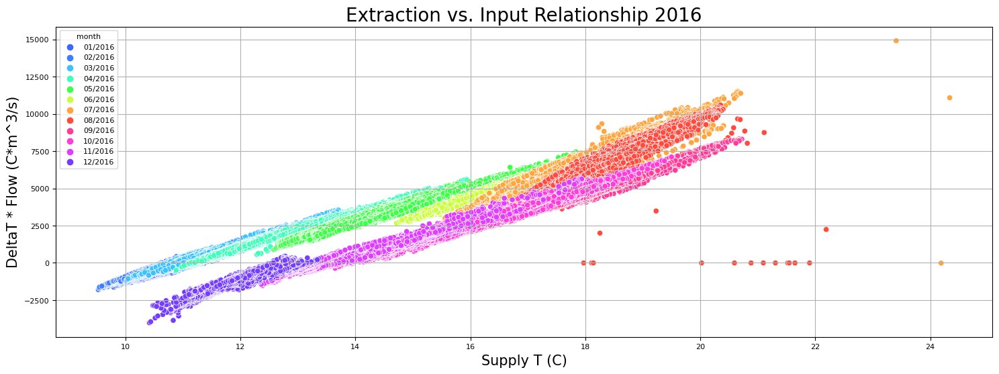

In [ ]:
x=data_frame_2016_dropzeroes["BF4 Supply Celcius"]
y=data_frame_2016_dropzeroes['Power']
h=data_frame_2016_dropzeroes['month']

sns.scatterplot(x=x, y=y, hue=h, palette = ['#3d67ff', '#3d7eff', '#3dc2ff', '#3dffbb', '#3dff47', '#cbff3d', '#ffa53d', '#ff4a3d', '#ff3d98', '#ff3ddb', '#df3dff', '#743dff'])
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.title("Extraction vs. Input Relationship 2016" , fontsize = 20)
plt.grid()

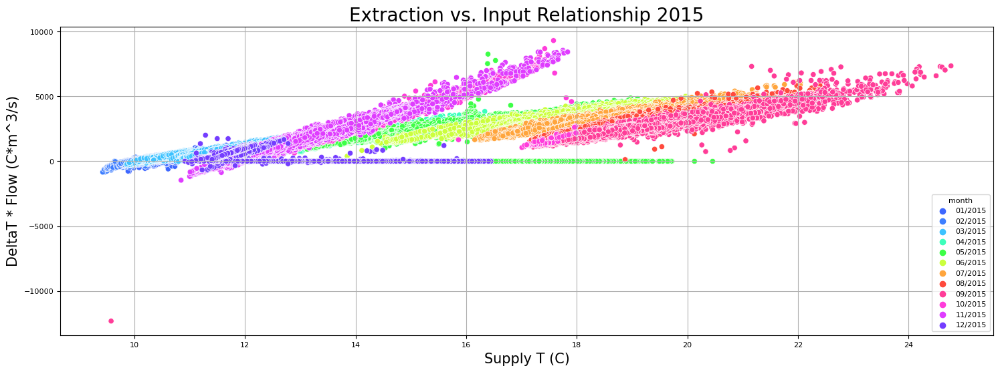

In [ ]:
x=data_frame_2015_dropzeroes["BF4 Supply Celcius"]
y=data_frame_2015_dropzeroes['Power']
h=data_frame_2015_dropzeroes['month']

sns.scatterplot(x=x, y=y, hue=h, palette = ['#3d67ff', '#3d7eff', '#3dc2ff', '#3dffbb', '#3dff47', '#cbff3d', '#ffa53d', '#ff4a3d', '#ff3d98', '#ff3ddb', '#df3dff', '#743dff'])
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT * Flow (C*m^3/s)",  fontsize = 15)
plt.title("Extraction vs. Input Relationship 2015" , fontsize = 20)
plt.grid()

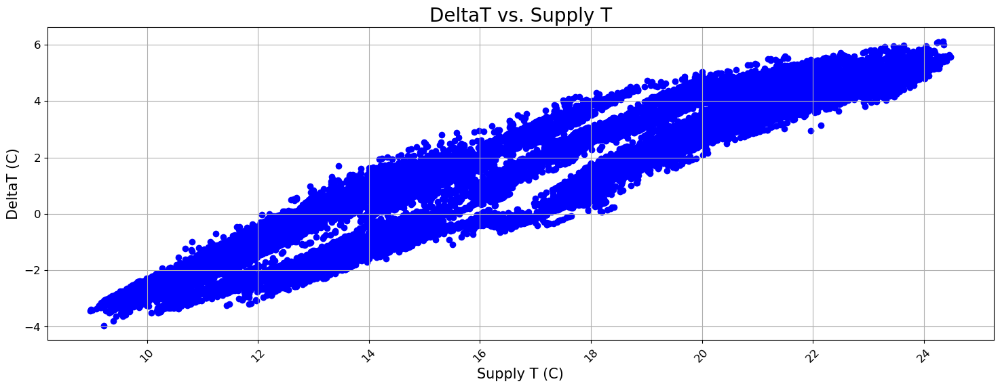

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2022["BF4 Supply Celcius"], data_frame_2022["deltaT"], color = "blue")
#plt.legend((a,b,c,d,e,f,g,h),("2022","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("DeltaT (C)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("DeltaT vs. Supply T" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
plt.xlim()
plt.show()

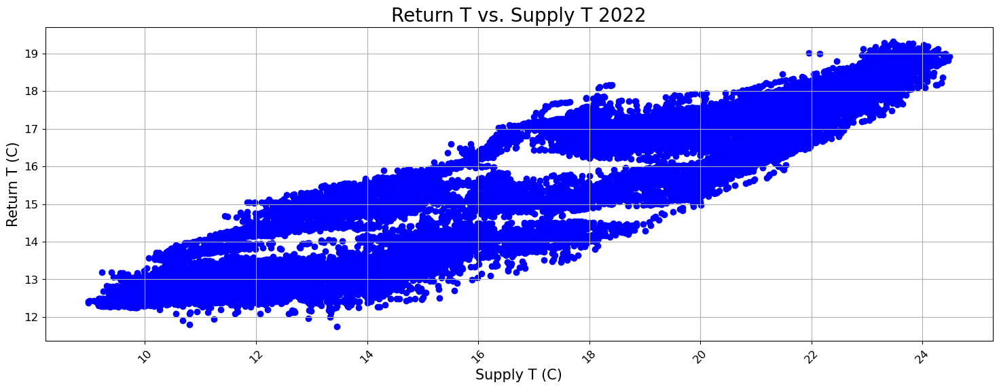

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2022["BF4 Supply Celcius"], data_frame_2022["BF4 Return Celcius"], color = "blue")
#plt.legend((a,b,c,d,e,f,g,h),("2022","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("Return T (C)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Return T vs. Supply T 2022" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
plt.xlim()
plt.show()

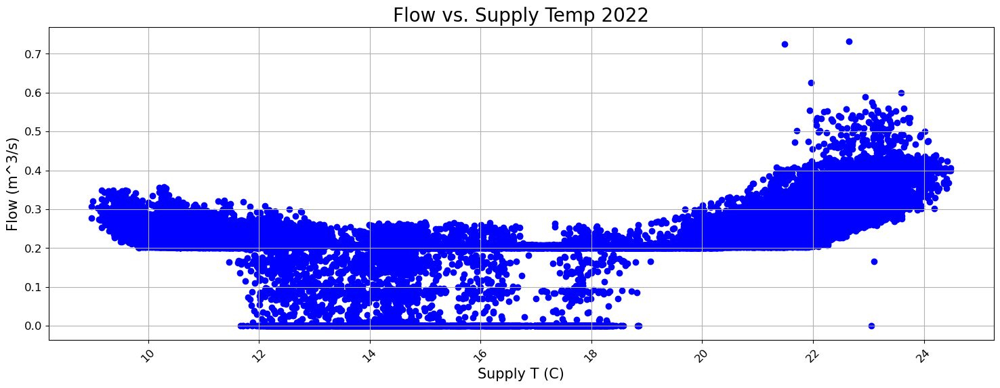

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2022["BF4 Supply Celcius"], data_frame_2022["BF4 Flow m3/s"], color = "blue")
#plt.legend((a,b,c,d,e,f,g,h),("2022","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("Flow (m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Flow vs. Supply Temp 2022" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
plt.xlim()
plt.show()

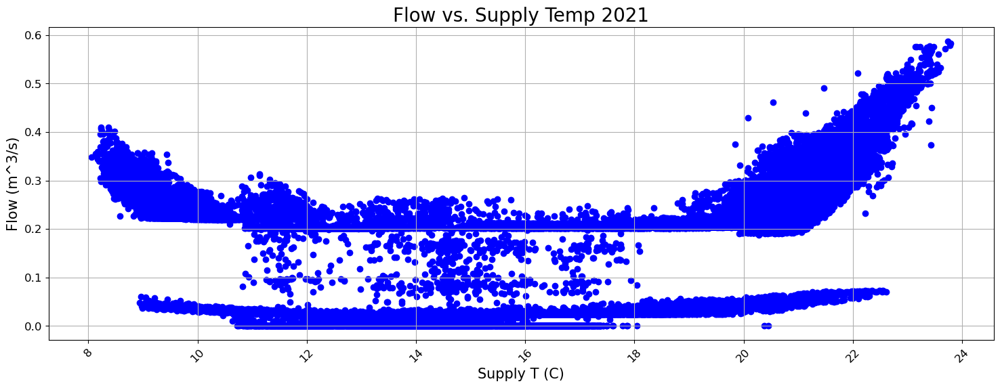

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
a = plt.scatter(data_frame_2021["BF4 Supply Celcius"], data_frame_2021["BF4 Flow m3/s"], color = "blue")
#plt.legend((a,b,c,d,e,f,g,h),("2021","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Supply T (C)",  fontsize = 15)
plt.ylabel("Flow (m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Flow vs. Supply Temp 2021" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
plt.xlim()
plt.show()

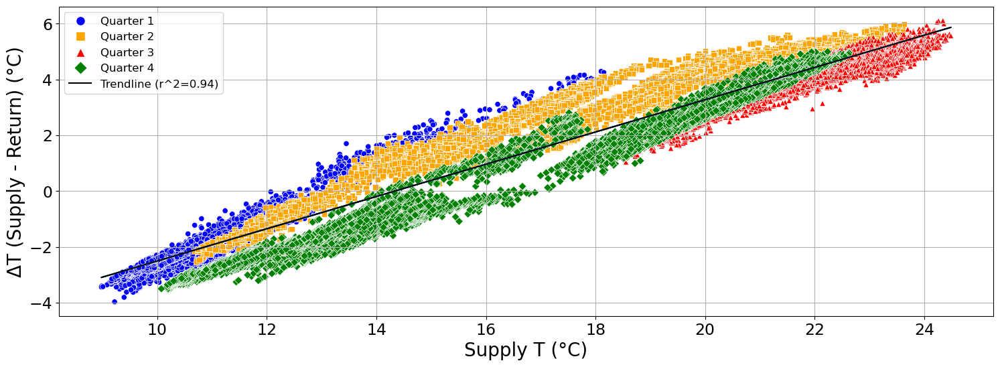

In [ ]:
# Assuming data_frame_2022_dropzeroes is your DataFrame containing 2022 data
x1 = data_frame_2022_dropzeroes["BF4 Supply Celcius"]
y1 = data_frame_2022_dropzeroes['deltaT']
h1 = data_frame_2022_dropzeroes['quarter']

# Create a list of data and labels for easy iteration
datasets = [data_frame_2022_dropzeroes]
labels = ["2022"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = []
trendline_labels = []
r2_values = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["deltaT"].fillna(dataset["deltaT"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["deltaT"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Plot the trendline
    plt.plot(x, model.predict(x), color=color)

    # Plot the linear trendline over the 2022 data
    x_line = np.linspace(min(x), max(x), 100).reshape(-1, 1)
    plt.plot(x_line, model.predict(x_line), color='black', alpha=1)


# Scatter plot
scatter = sns.scatterplot(x=x1, y=y1, hue=h1, style=h1, markers=['o', 's', '^', 'D'],
                          palette={1: 'blue', 2: 'orange', 3: 'red', 4: 'green'})

# Create custom legend for quarters with shapes
legend_handles = [
   plt.Line2D([0], [0], marker=marker, color='w', label=f'Quarter {i+1}', markerfacecolor=color, markersize=10)
  for i, (color, marker) in enumerate(zip(['blue', 'orange', 'red', 'green'], ['o', 's', '^', 'D']))
]

# Add a black line to the legend
legend_handles.append(plt.Line2D([0], [0], color='black', label='Trendline (r^2=0.94)'))

# Create legend
plt.legend(handles=legend_handles, loc='upper left', fontsize = 12)


plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("ΔT (Supply - Return) (°C)", fontsize=20)
#plt.title("ΔT  vs. Supply T for 2022", fontsize=27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)


# Show the plot
plt.grid()
plt.show()

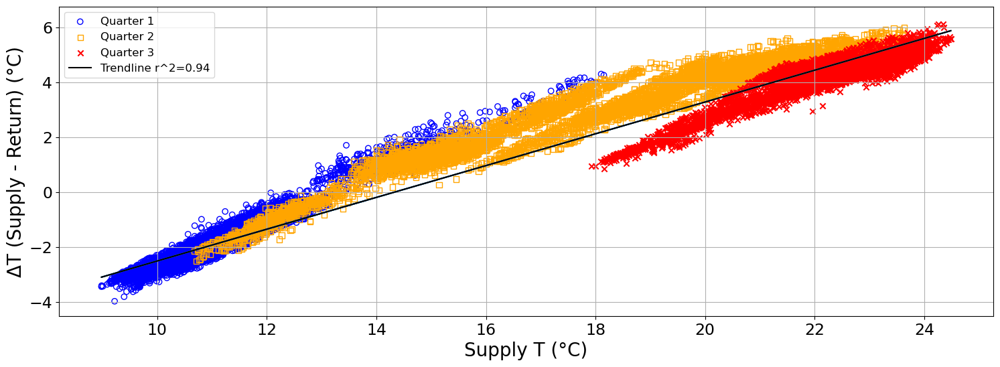

In [ ]:
plt.scatter(df_q1['BF4 Supply Celcius'], df_q1['deltaT'], edgecolor='blue', facecolor='none', label = 'Quarter 1')
plt.scatter(df_q2['BF4 Supply Celcius'], df_q2['deltaT'], edgecolor='orange', facecolor='none', marker='s', label = 'Quarter 2')
plt.scatter(df_q3['BF4 Supply Celcius'], df_q3['deltaT'], color='red', marker='x', label = 'Quarter 3')
#plt.scatter(df_q4['BF4 Supply Celcius'], df_q4['deltaT'], edgecolor='green', facecolor='none', marker='D', label = 'Quarter 4')

plt.xlabel("Supply T (°C)", fontsize=20)
plt.ylabel("ΔT (Supply - Return) (°C)", fontsize=20)
#plt.title("ΔT  vs. Supply T for 2022", fontsize=27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)

# Assuming data_frame_2022_dropzeroes is your DataFrame containing 2022 data
x1 = data_frame_2022_dropzeroes["BF4 Supply Celcius"]
y1 = data_frame_2022_dropzeroes['Power']
h1 = data_frame_2022_dropzeroes['quarter']

# Create a list of data and labels for easy iteration
datasets = [data_frame_2022_dropzeroes]
labels = ["2022"]

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Lists to store trendline colors and labels
trendline_colors = []
trendline_labels = []
r2_values = []

# Iterate over each dataset and fit a linear regression model
for i in range(len(datasets)):
    dataset = datasets[i]
    label = labels[i]

    # Impute missing values (NaN) with the mean
    imputer = SimpleImputer(strategy='mean')
    dataset_imputed = dataset.copy()
    dataset_imputed["BF4 Supply Celcius"].fillna(dataset["BF4 Supply Celcius"].mean(), inplace=True)
    dataset_imputed["deltaT"].fillna(dataset["deltaT"].mean(), inplace=True)

    x = dataset_imputed["BF4 Supply Celcius"].values.reshape(-1, 1)
    y = dataset_imputed["deltaT"].values.reshape(-1, 1)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x, y)

    # Store trendline color and label
    color = plt.cm.tab10(i)  # Use a color from the Tab10 colormap
    trendline_colors.append(color)
    trendline_labels.append(f"{label} Trendline")

    # Calculate r^2 value
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    r2_values.append(r2)

    # Plot the trendline
    plt.plot(x, model.predict(x), color=color)

    # Plot the linear trendline over the 2022 data
    x_line = np.linspace(min(x), max(x), 100).reshape(-1, 1)
    
plt.plot(x_line, model.predict(x_line), color='black', alpha=1, label= 'Trendline r^2=0.94')

plt.legend(fontsize=12)
plt.ylim(-4.5,6.75)

# Show the plot
plt.grid()
plt.show()

In [ ]:
print(r2)

0.9393900715990752


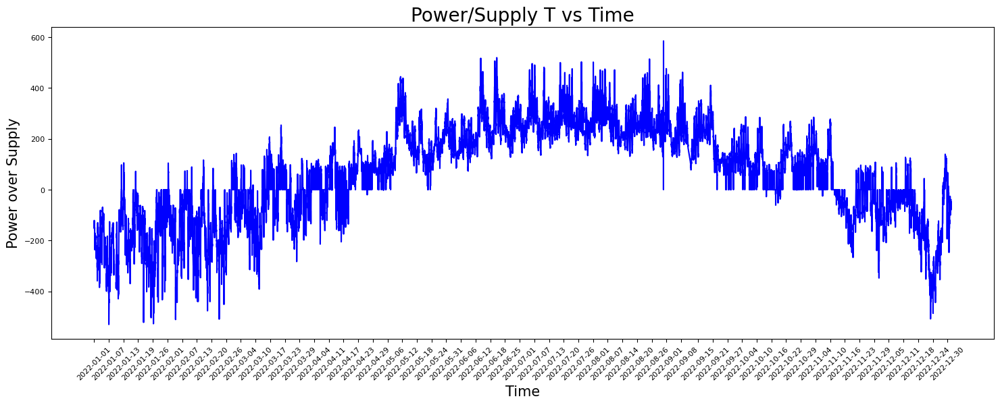

In [ ]:
ticks = []
for i in range(0, len(data_frame_2022.index)):
    if i%600 == 0:
        ticks.append(data_frame_2022.index[i])

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.plot(data_frame_2022.index, data_frame_2022["Power over Supply"], color = "blue")
plt.xlabel("Time",  fontsize = 15)
plt.ylabel("Power over Supply",  fontsize = 15)
#plt.tick_params(axis='y', labelsize=12)
#plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Power/Supply T vs Time" , fontsize = 20)
#plt.grid()
plt.xticks(rotation = 45,)
plt.xlim()
plt.xticks(ticks)
plt.show()

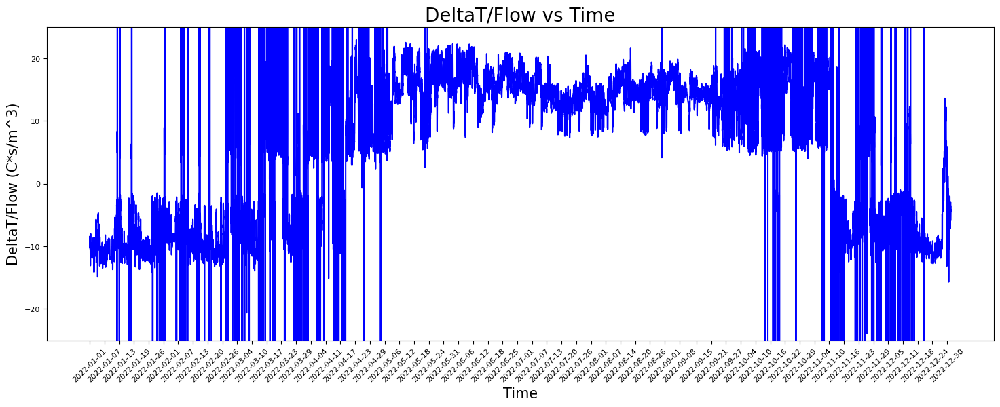

In [ ]:
ticks = []
for i in range(0, len(data_frame_2022.index)):
    if i%600 == 0:
        ticks.append(data_frame_2022.index[i])

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.plot(data_frame_2022.index, data_frame_2022["DeltaTFlow"], color = "blue")
plt.xlabel("Time",  fontsize = 15)
plt.ylabel("DeltaT/Flow (C*s/m^3)",  fontsize = 15)
#plt.tick_params(axis='y', labelsize=12)
#plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("DeltaT/Flow vs Time" , fontsize = 20)
#plt.grid()
plt.xticks(rotation = 45,)
plt.ylim(-25,25)
plt.xticks(ticks)
#plt.yscale("log")
plt.show()

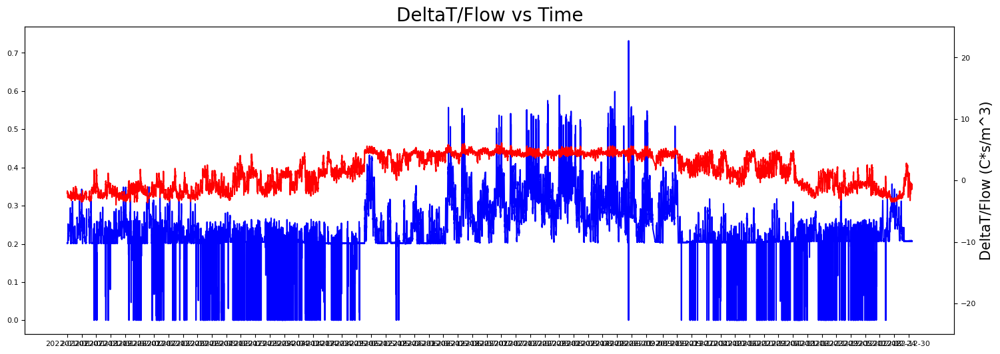

In [ ]:
ticks = []
for i in range(0, len(data_frame_2022.index)):
    if i%600 == 0:
        ticks.append(data_frame_2022.index[i])

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
ax1.plot(data_frame_2022.index, data_frame_2022["BF4 Flow m3/s"], color = "blue")
ax2.plot(data_frame_2022.index, data_frame_2022["deltaT"], color = "red")
plt.xlabel("Time",  fontsize = 15)
plt.ylabel("DeltaT/Flow (C*s/m^3)",  fontsize = 15)
#plt.tick_params(axis='y', labelsize=12)
#plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("DeltaT/Flow vs Time" , fontsize = 20)
#plt.grid()
plt.xticks(ticks, rotation = 45)
plt.ylim(-25,25)
#plt.yscale("log")
plt.show()

In [ ]:
frames1 = [data_frame_2015, data_frame_2016, data_frame_2017, data_frame_2018, data_frame_2019, data_frame_2020, data_frame_2021, data_frame_2022]
df_2015_2022 = pd.concat(frames1)

df_2015_2022.index = pd.to_datetime(df_2015_2022.index)

type(df_2015_2022.index[0])

# Replace values outside the desired range with NaN
df_2015_2022.loc[(df_2015_2022['deltaT'] > 10) | (df_2015_2022['deltaT'] < -10), 'deltaT'] = np.nan

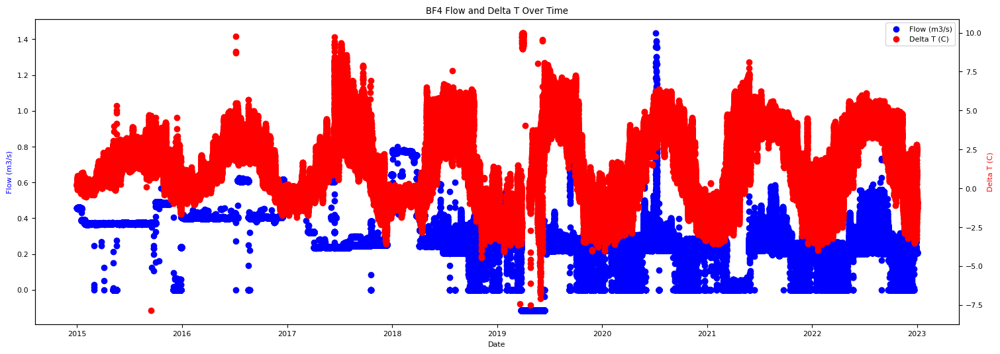

In [ ]:
# Plot the original and smoothed data
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
ax1.scatter(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s"], color = "blue", label = 'Flow (m3/s)')


ax2.scatter(df_2015_2022.index, df_2015_2022["deltaT"], color = "red", label = 'Delta T (C)')


# Add labels and legends
ax1.set_ylabel('Flow (m3/s)', color='blue')
ax2.set_ylabel('Delta T (C)', color='red')
ax1.set_xlabel('Date')
ax1.set_title('BF4 Flow and Delta T Over Time')

# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right')

plt.show()

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_33610/2595654760.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_2015_2022['BF4 Flow m3/s smoothed'] = df_2015_2022['BF4 Flow m3/s'].rolling(window=window_size).mean()
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_33610/2595654760.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_2015_2022['deltaT smoothed'] = df_2015_2022['deltaT'].rolling(window=window_size).mean()


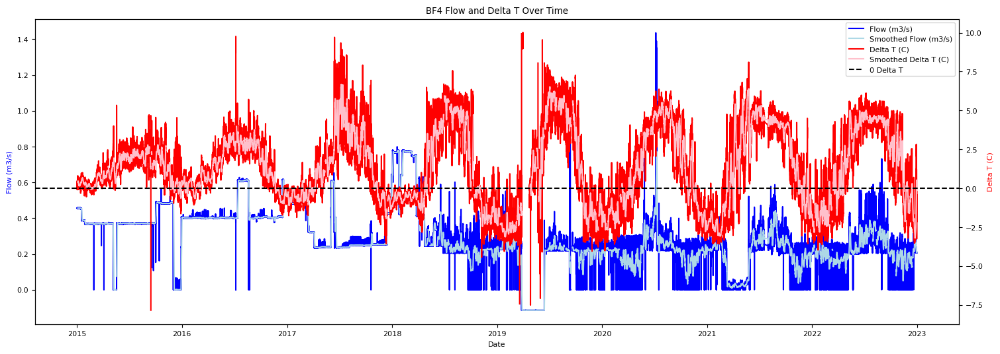

In [ ]:
window_size = 250  # Adjust this for the desired level of smoothing
df_2015_2022['BF4 Flow m3/s smoothed'] = df_2015_2022['BF4 Flow m3/s'].rolling(window=window_size).mean()
df_2015_2022['deltaT smoothed'] = df_2015_2022['deltaT'].rolling(window=window_size).mean()

# Plot the original and smoothed data
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s"], color = "blue", label = 'Flow (m3/s)')
ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s smoothed"], color="lightblue", label='Smoothed Flow (m3/s)')

ax2.plot(df_2015_2022.index, df_2015_2022["deltaT"], color = "red", label = 'Delta T (C)')
ax2.plot(df_2015_2022.index, df_2015_2022["deltaT smoothed"], color="pink", label='Smoothed Delta T (C)')

ax2.axhline(y=0, color='black', linestyle='--', label = '0 Delta T')

# Add labels and legends
ax1.set_ylabel('Flow (m3/s)', color='blue')
ax2.set_ylabel('Delta T (C)', color='red')
ax1.set_xlabel('Date')
ax1.set_title('BF4 Flow and Delta T Over Time')


# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right')

plt.show()

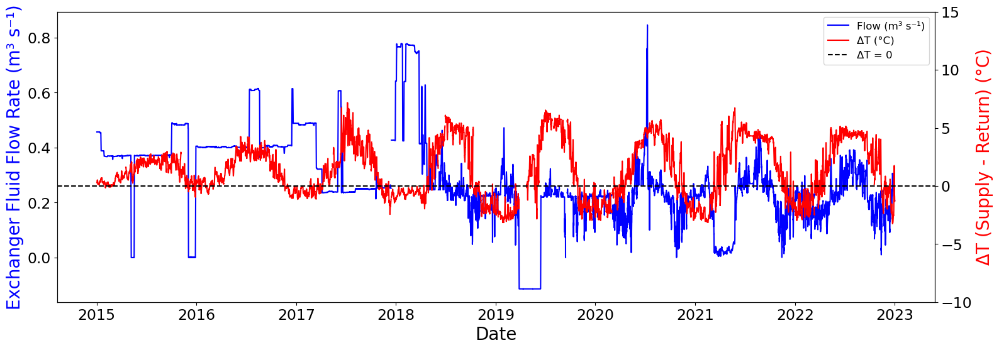

In [ ]:
window_size = 100  # Adjust this for the desired level of smoothing
df_2015_2022['BF4 Flow m3/s smoothed'] = df_2015_2022['BF4 Flow m3/s'].rolling(window=window_size).mean()
df_2015_2022['deltaT smoothed'] = df_2015_2022['deltaT'].rolling(window=window_size).mean()

# Plot the original and smoothed data
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
#ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s"], color = "blue", label = 'Flow (m3/s)')
ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s smoothed"], color="blue", label='Flow (m³ s⁻¹)')

#ax2.plot(df_2015_2022.index, df_2015_2022["deltaT"], color = "red", label = 'Delta T (C)')
ax2.plot(df_2015_2022.index, df_2015_2022["deltaT smoothed"], color="red", label='ΔT (°C)')

ax2.axhline(y=0, color='black', linestyle='--', label = 'ΔT = 0')

# Add labels and legends
ax1.set_ylabel('Exchanger Fluid Flow Rate (m³ s⁻¹)', color='blue', fontsize=20)
ax2.set_ylabel('ΔT (Supply - Return) (°C)', color='red', fontsize=20)
ax1.set_xlabel('Date', fontsize=20)
#ax1.set_title('Moving Average of BF4 Flow Rate and ΔT vs. Time', fontsize=27)

ax1.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='x', which='major', labelsize=17)
ax1.tick_params(axis='x', which='major', labelsize=17) 

ax2.set_ylim(-10, 15)

# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right', fontsize=12)


plt.show()

In [ ]:
#Add Absolute DeltaT to df_2015_2022

df_2015_2022['Abs DeltaT']=abs(df_2015_2022['deltaT'])

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_33610/553281512.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_2015_2022['Abs DeltaT']=abs(df_2015_2022['deltaT'])


Plot Absolute Delta T and Flow Against Time

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_33610/138606706.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_2015_2022['Abs DeltaT smoothed'] = df_2015_2022['Abs DeltaT'].rolling(window=window_size).mean()


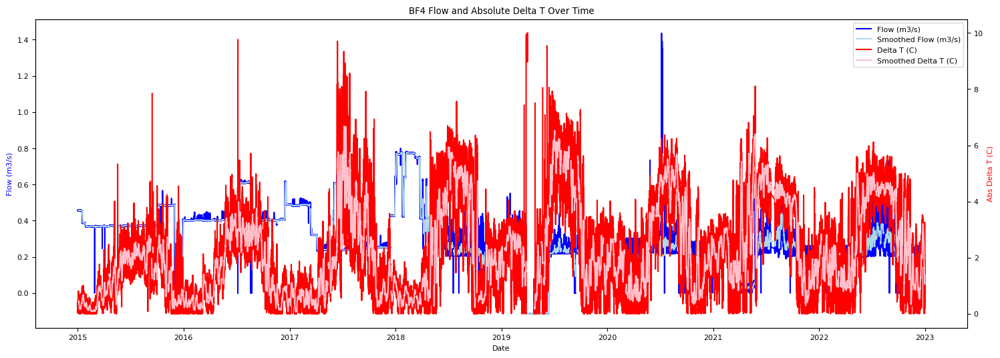

In [ ]:
window_size = 250  # Adjust this for the desired level of smoothing
df_2015_2022['BF4 Flow m3/s smoothed'] = df_2015_2022['BF4 Flow m3/s'].rolling(window=window_size).mean()
df_2015_2022['Abs DeltaT smoothed'] = df_2015_2022['Abs DeltaT'].rolling(window=window_size).mean()

# Plot the original and smoothed data
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s"], color = "blue", label = 'Flow (m3/s)')
ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s smoothed"], color="lightblue", label='Smoothed Flow (m3/s)')

ax2.plot(df_2015_2022.index, df_2015_2022["Abs DeltaT"], color = "red", label = 'Delta T (C)')
ax2.plot(df_2015_2022.index, df_2015_2022["Abs DeltaT smoothed"], color="pink", label='Smoothed Delta T (C)')

# Add labels and legends
ax1.set_ylabel('Flow (m3/s)', color='blue')
ax2.set_ylabel('Abs Delta T (C)', color='red')
ax1.set_xlabel('Date')
ax1.set_title('BF4 Flow and Absolute Delta T Over Time')

# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right')

plt.show()


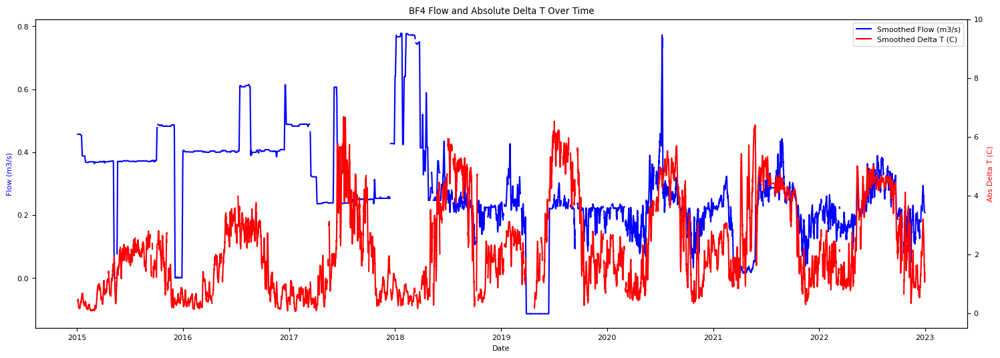

In [ ]:
window_size = 250 # Adjust this for the desired level of smoothing
df_2015_2022['BF4 Flow m3/s smoothed'] = df_2015_2022['BF4 Flow m3/s'].rolling(window=window_size).mean()
df_2015_2022['Abs DeltaT smoothed'] = df_2015_2022['Abs DeltaT'].rolling(window=window_size).mean()

# Plot the original and smoothed data
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
#ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s"], color = "blue", label = 'Flow (m3/s)')
ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s smoothed"], color="blue", label='Smoothed Flow (m3/s)')

#ax2.plot(df_2015_2022.index, df_2015_2022["Abs DeltaT"], color = "red", label = 'Delta T (C)')
ax2.plot(df_2015_2022.index, df_2015_2022["Abs DeltaT smoothed"], color="red", label='Smoothed Delta T (C)')

# Add labels and legends
ax1.set_ylabel('Flow (m3/s)', color='blue')
ax2.set_ylabel('Abs Delta T (C)', color='red')
ax1.set_xlabel('Date')
ax1.set_title('BF4 Flow and Absolute Delta T Over Time')

ax2.set_ylim(-0.5, 10)

# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right')

plt.show()

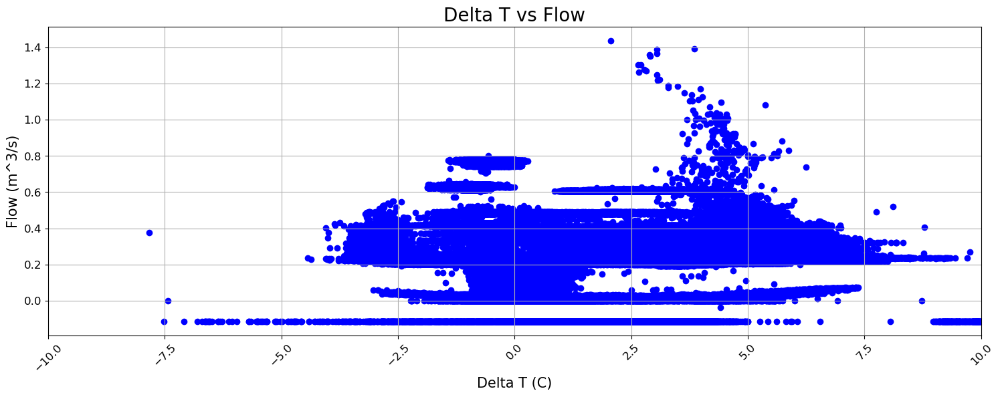

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.scatter(df_2015_2022["deltaT"], df_2015_2022["BF4 Flow m3/s"], color = "blue")
#plt.legend((a,b,c,d,e,f,g,h),("2021","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Delta T (C)",  fontsize = 15)
plt.ylabel("Flow (m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Delta T vs Flow" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
plt.xlim(-10,10)
plt.show()

Adding Quarters to Data Frames and Taking Abs DeltaT

In [ ]:
#For 2022 data frame
#Take Absolute Values of Delta T

data_frame_2022['DeltaT Abs'] = abs(data_frame_2022['deltaT'])

#Add Quarter to 2022 data frame

data_frame_2022['quarter'] = data_frame_2022.index.quarter.astype(int).copy()

/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/2434559545.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_frame_2022['DeltaT Abs'] = abs(data_frame_2022['deltaT'])
/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_66557/2434559545.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_frame_2022['quarter'] = data_frame_2022.index.quarter.astype(int).copy()


In [ ]:
#For 2021 data frame
#Take Absolute Values of Delta T

data_frame_2021['DeltaT Abs'] = abs(data_frame_2021['deltaT'])

#Add Quarter to 2021 data frame

data_frame_2021['quarter'] = data_frame_2021.index.quarter.astype(int).copy()

In [ ]:
#For 2020 data frame
#Take Absolute Values of Delta T

data_frame_2020['DeltaT Abs'] = abs(data_frame_2020['deltaT'])

#Add Quarter to 2020 data frame

data_frame_2020['quarter'] = data_frame_2020.index.quarter.astype(int).copy()

In [ ]:
#For 2019 data frame
#Take Absolute Values of Delta T

data_frame_2019['DeltaT Abs'] = abs(data_frame_2019['deltaT'])

#Add Quarter to 2019 data frame

data_frame_2019['quarter'] = data_frame_2019.index.quarter.astype(int).copy()

In [ ]:
#For 2018 data frame
#Take Absolute Values of Delta T

data_frame_2018['DeltaT Abs'] = abs(data_frame_2018['deltaT'])

#Add Quarter to 2018 data frame

data_frame_2018['quarter'] = data_frame_2018.index.quarter.astype(int).copy()

In [ ]:
#For 2017 data frame
#Take Absolute Values of Delta T

data_frame_2017['DeltaT Abs'] = abs(data_frame_2017['deltaT'])

#Add Quarter to 2017 data frame

data_frame_2017['quarter'] = data_frame_2017.index.quarter.astype(int).copy()

In [ ]:
#For 2016 data frame
#Take Absolute Values of Delta T

data_frame_2016['DeltaT Abs'] = abs(data_frame_2016['deltaT'])

#Add Quarter to 2016 data frame

data_frame_2016['quarter'] = data_frame_2016.index.quarter.astype(int).copy()

In [ ]:
#For 2015 data frame
#Take Absolute Values of Delta T

data_frame_2015['DeltaT Abs'] = abs(data_frame_2015['deltaT'])

#Add Quarter to 2015 data frame

data_frame_2015['quarter'] = data_frame_2015.index.quarter.astype(int).copy()

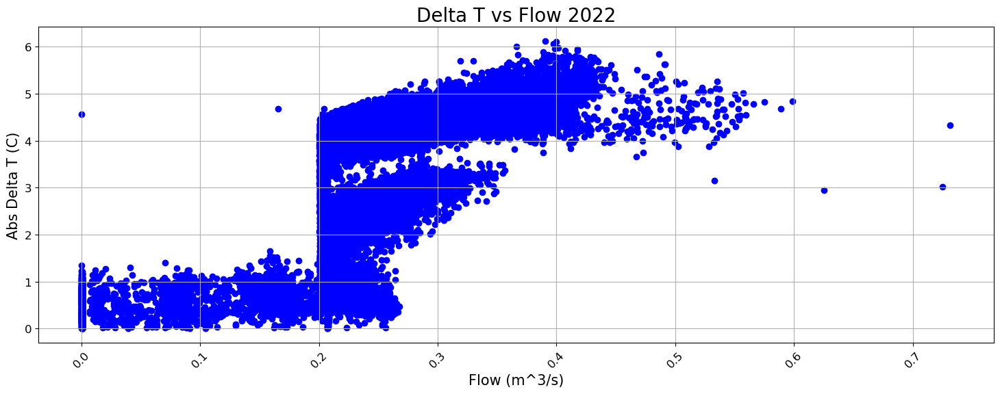

In [ ]:

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.scatter(data_frame_2022["BF4 Flow m3/s"], data_frame_2022["DeltaT Abs"], color = "blue")
plt.xlabel("Flow (m^3/s)",  fontsize = 15)
plt.ylabel("Abs Delta T (C)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Delta T vs Flow 2022" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
#plt.xlim(-10,10)
plt.show()

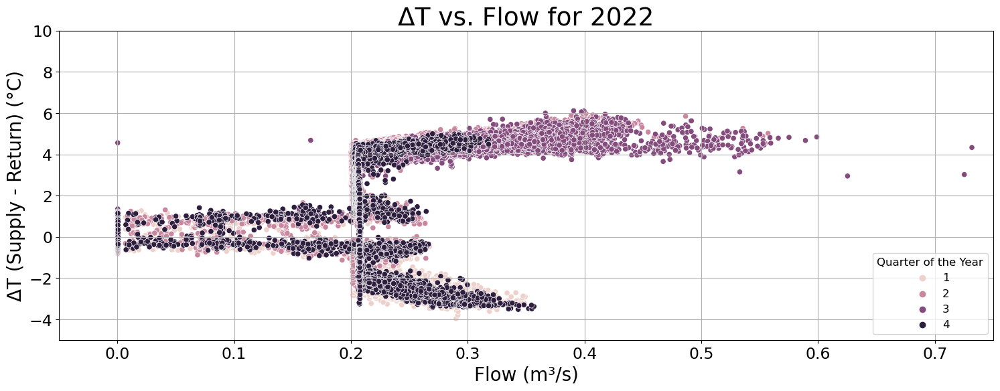

In [ ]:
x=data_frame_2022["BF4 Flow m3/s"]
y=data_frame_2022['deltaT']
h=data_frame_2022['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m³/s)",  fontsize = 20)
plt.ylabel("ΔT (Supply - Return) (°C)",  fontsize = 20)
plt.title("ΔT vs. Flow for 2022" , fontsize = 27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
# Set legend title
legend = plt.legend(loc="lower right", title="Quarter of the Year", fontsize=12)
legend.get_title().set_fontsize(12)
plt.ylim(-5,10)
plt.xlim(-0.05,0.75)
plt.grid()

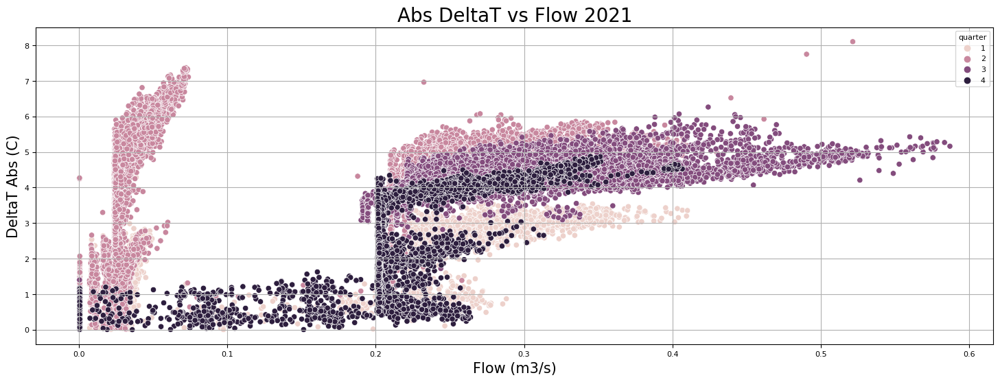

In [ ]:
x=data_frame_2021["BF4 Flow m3/s"]
y=data_frame_2021['DeltaT Abs']
h=data_frame_2021['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m3/s)",  fontsize = 15)
plt.ylabel("DeltaT Abs (C)",  fontsize = 15)
plt.title("Abs DeltaT vs Flow 2021" , fontsize = 20)
plt.grid()

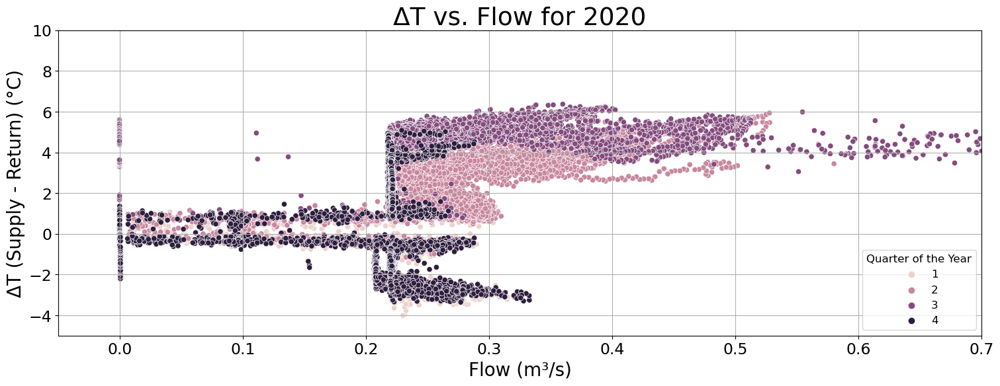

In [ ]:
x=data_frame_2020["BF4 Flow m3/s"]
y=data_frame_2020['deltaT']
h=data_frame_2020['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m³/s)",  fontsize = 20)
plt.ylabel("ΔT (Supply - Return) (°C)",  fontsize = 20)
plt.title("ΔT vs. Flow for 2020" , fontsize = 27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
# Set legend title
legend = plt.legend(loc="lower right", title="Quarter of the Year", fontsize=12)
legend.get_title().set_fontsize(12)
plt.ylim(-5,10)
plt.xlim(-0.05,0.7)
plt.grid()

(-1.0, 10.0)

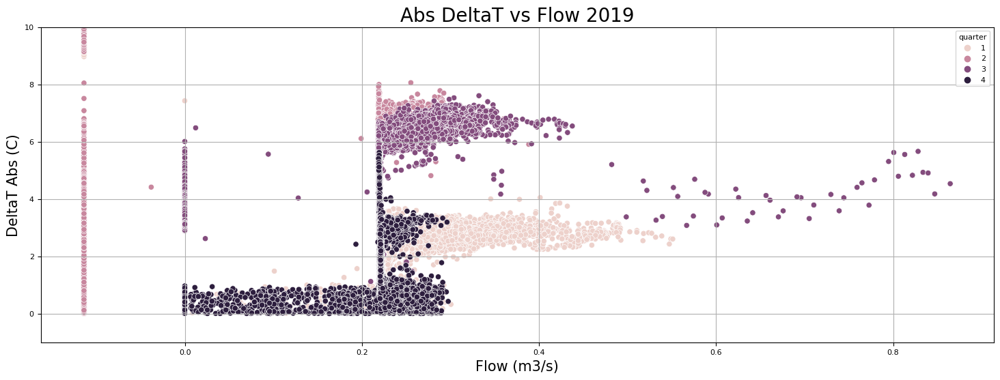

In [ ]:
x=data_frame_2019["BF4 Flow m3/s"]
y=data_frame_2019['DeltaT Abs']
h=data_frame_2019['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m3/s)",  fontsize = 15)
plt.ylabel("DeltaT Abs (C)",  fontsize = 15)
plt.title("Abs DeltaT vs Flow 2019" , fontsize = 20)
plt.grid()
plt.ylim(-1,10)

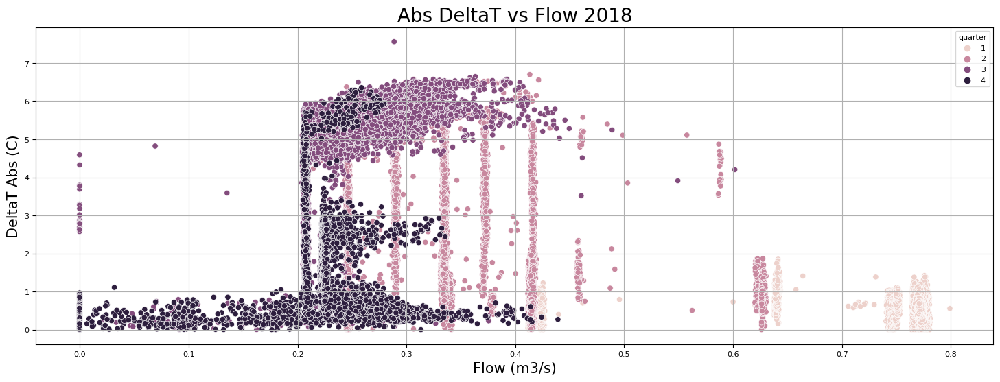

In [ ]:
x=data_frame_2018["BF4 Flow m3/s"]
y=data_frame_2018['DeltaT Abs']
h=data_frame_2018['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m3/s)",  fontsize = 15)
plt.ylabel("DeltaT Abs (C)",  fontsize = 15)
plt.title("Abs DeltaT vs Flow 2018" , fontsize = 20)
plt.grid()

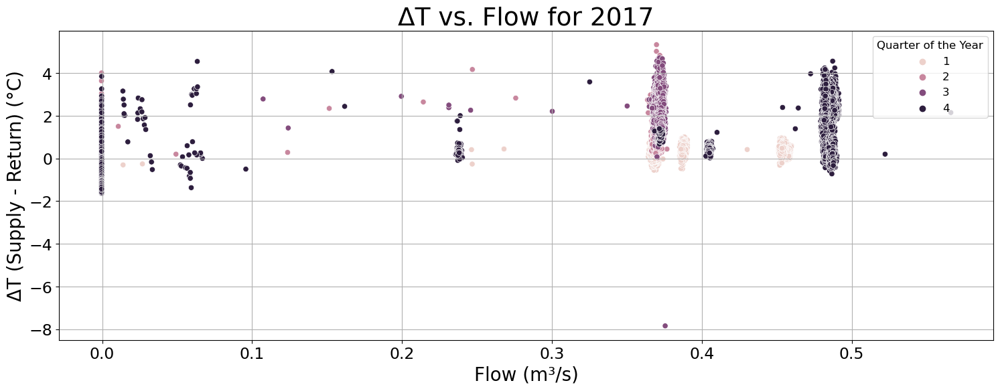

In [ ]:
x=data_frame_2015["BF4 Flow m3/s"]
y=data_frame_2015['deltaT']
h=data_frame_2015['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m³/s)",  fontsize = 20)
plt.ylabel("ΔT (Supply - Return) (°C)",  fontsize = 20)
plt.title("ΔT vs. Flow for 2017" , fontsize = 27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
# Set legend title
legend = plt.legend(loc="upper right", title="Quarter of the Year", fontsize=12)
legend.get_title().set_fontsize(12)
#plt.ylim(-5,10)
#plt.xlim(-0.05,0.75)
plt.grid()

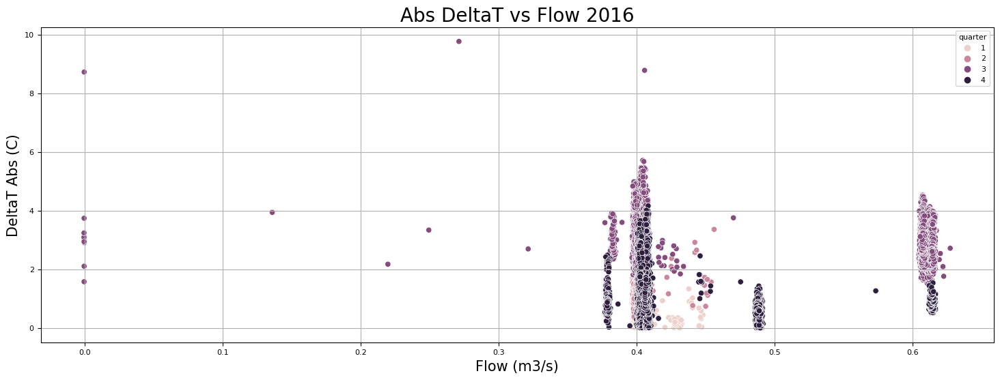

In [ ]:
x=data_frame_2016["BF4 Flow m3/s"]
y=data_frame_2016['DeltaT Abs']
h=data_frame_2016['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m3/s)",  fontsize = 15)
plt.ylabel("DeltaT Abs (C)",  fontsize = 15)
plt.title("Abs DeltaT vs Flow 2016" , fontsize = 20)
plt.grid()

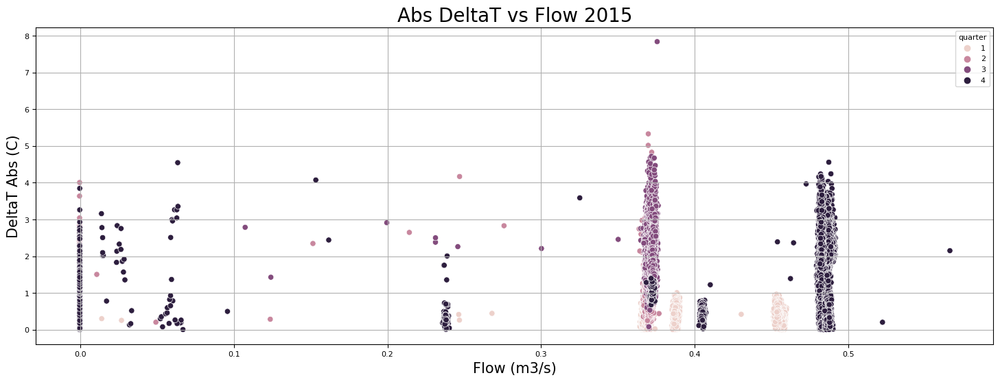

In [ ]:
x=data_frame_2015["BF4 Flow m3/s"]
y=data_frame_2015['DeltaT Abs']
h=data_frame_2015['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m3/s)",  fontsize = 15)
plt.ylabel("DeltaT Abs (C)",  fontsize = 15)
plt.title("Abs DeltaT vs Flow 2015" , fontsize = 20)
plt.grid()

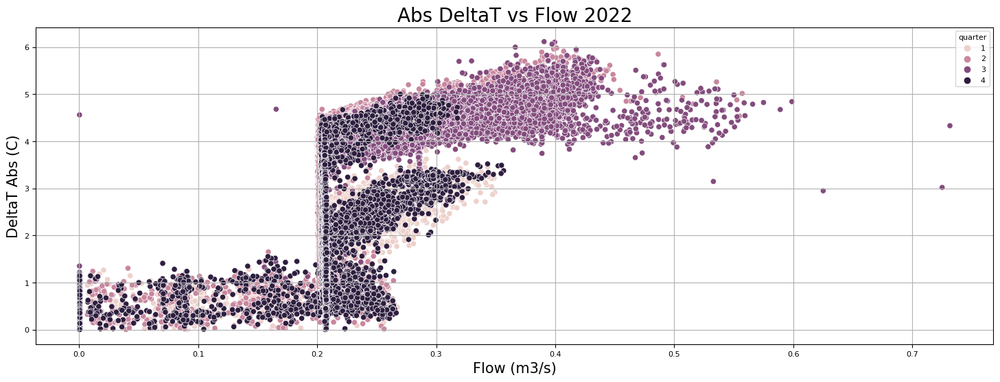

In [ ]:
x=data_frame_2022["BF4 Flow m3/s"]
y=data_frame_2022['DeltaT Abs']
h=data_frame_2022['quarter']

sns.scatterplot(x=x, y=y, hue=h)
plt.xlabel("Flow (m3/s)",  fontsize = 15)
plt.ylabel("DeltaT Abs (C)",  fontsize = 15)
plt.title("Abs DeltaT vs Flow 2022" , fontsize = 20)
plt.grid()

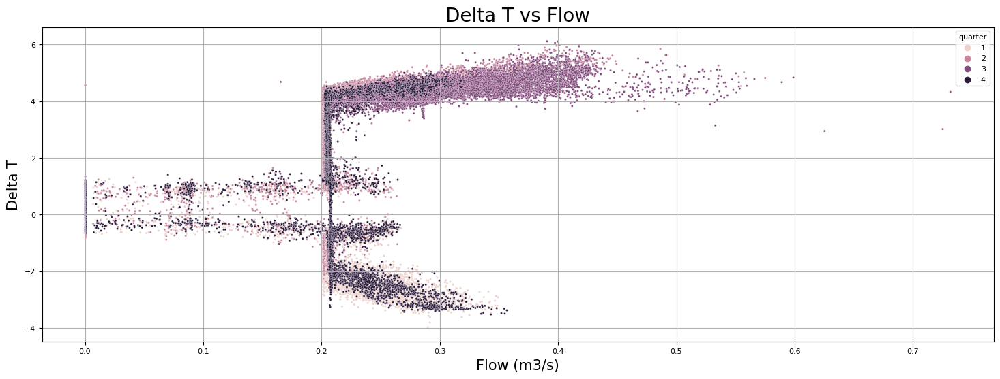

In [ ]:
x=data_frame_2022["BF4 Flow m3/s"]
y=data_frame_2022['deltaT']
h=data_frame_2022['quarter']

sns.scatterplot(x=x, y=y, hue=h, s=5)
plt.xlabel("Flow (m3/s)",  fontsize = 15)
plt.ylabel("Delta T",  fontsize = 15)
plt.title("Delta T vs Flow" , fontsize = 20)
plt.grid()

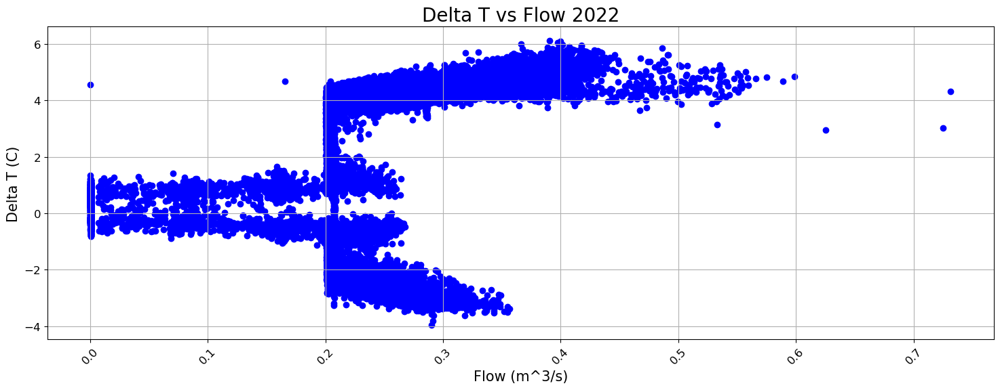

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.scatter(data_frame_2022["BF4 Flow m3/s"], data_frame_2022["deltaT"], color = "blue")
plt.xlabel("Flow (m^3/s)",  fontsize = 15)
plt.ylabel("Delta T (C)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Delta T vs Flow 2022" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
#plt.xlim(-10,10)
plt.show()

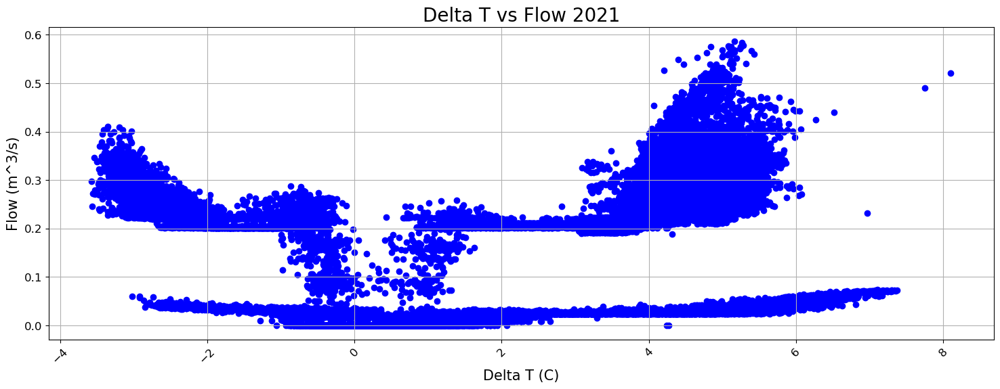

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.scatter(data_frame_2021["deltaT"], data_frame_2021["BF4 Flow m3/s"], color = "blue")
plt.xlabel("Delta T (C)",  fontsize = 15)
plt.ylabel("Flow (m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Delta T vs Flow 2021" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
#plt.xlim(-10,10)
plt.show()

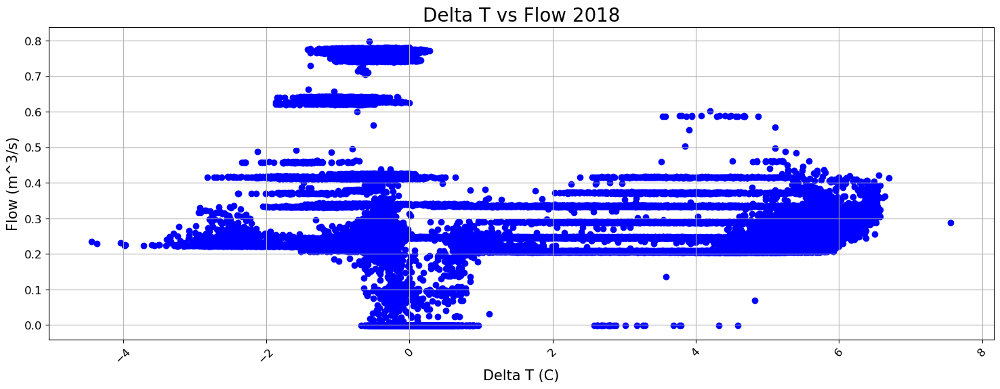

In [ ]:
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
plt.scatter(data_frame_2018["deltaT"], data_frame_2018["BF4 Flow m3/s"], color = "blue")
#plt.legend((a,b,c,d,e,f,g,h),("2021","2021","2020","2019","2018","2017","2016","2015"))
plt.xlabel("Delta T (C)",  fontsize = 15)
plt.ylabel("Flow (m^3/s)",  fontsize = 15)
plt.tick_params(axis='y', labelsize=12)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.title("Delta T vs Flow 2018" , fontsize = 20)
plt.grid()
plt.xticks(rotation = 45,)
#plt.xlim(-10,10)
plt.show()

Adding Well Temps to Plots

In [ ]:
def create_features(df):
    df['dayofweek'] = df.index.dayofweek.astype(int).copy()
    df['quarter'] = df.index.quarter.astype(int).copy()
    df['month'] = df.index.month.astype(int).copy()
    df['year'] = df.index.year.astype(int).copy()
    df['dayofyear'] = df.index.dayofyear.astype(int).copy()
    # df['date'] = df.index.date
    return df

colorpal = sns.color_palette()

In [ ]:
# Reading the existing file
os.chdir("/Users/evanheeg/Documents/UWEpicGreenGeoData/Matlab")
mat = sio.loadmat('TMW12-May15-Dec22.mat')
mat.keys()

# Reading the old variables from the read file above
time = mat.get('Time')
dep1 = mat.get('Depth1')
dep2 = mat.get('Depth2')
TMW1 = mat.get('TMW1')
TMW2 = mat.get('TMW2')
time = time[0]
start_time = min(time)
end_time = max(time)

In [ ]:
TMW1_df20 = pd.DataFrame(TMW1[19], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW1_df20.columns = ['Well Temperature']

TMW1_df40 = pd.DataFrame(TMW1[39], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW1_df40.columns = ['Well Temperature']

TMW1_df60 = pd.DataFrame(TMW1[59], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW1_df60.columns = ['Well Temperature']

TMW1_df80 = pd.DataFrame(TMW1[79], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW1_df80.columns = ['Well Temperature']

TMW1_df100 = pd.DataFrame(TMW1[99], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW1_df100.columns = ['Well Temperature']

TMW1_df120 = pd.DataFrame(TMW1[119], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW1_df120.columns = ['Well Temperature']

TMW1_df140 = pd.DataFrame(TMW1[139], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW1_df140.columns = ['Well Temperature']

In [ ]:
TMW2_df20 = pd.DataFrame(TMW2[19], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW2_df20.columns = ['Well Temperature']

TMW2_df40 = pd.DataFrame(TMW2[39], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW2_df40.columns = ['Well Temperature']

TMW2_df60 = pd.DataFrame(TMW2[59], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW2_df60.columns = ['Well Temperature']

TMW2_df80 = pd.DataFrame(TMW2[79], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW2_df80.columns = ['Well Temperature']

TMW2_df100 = pd.DataFrame(TMW2[99], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW2_df100.columns = ['Well Temperature']

TMW2_df120 = pd.DataFrame(TMW2[119], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW2_df120.columns = ['Well Temperature']

TMW2_df140 = pd.DataFrame(TMW2[139], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW2_df140.columns = ['Well Temperature']

In [ ]:
# Reading the existing file
os.chdir("/Users/evanheeg/Documents/UWEpicGreenGeoData/Matlab")
mat = sio.loadmat('TMW34-Dec15-Dec22.mat')
mat.keys()

# Reading the old variables from the read file above
time = mat.get('Time')
dep1 = mat.get('Depth1')
dep2 = mat.get('Depth2')
TMW3 = mat.get('TMW3')
TMW4 = mat.get('TMW4')
time = time[0]
start_time = min(time)
end_time = max(time)

In [ ]:
TMW3_df20 = pd.DataFrame(TMW3[19], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW3_df20.columns = ['Well Temperature']

TMW3_df40 = pd.DataFrame(TMW3[39], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW3_df40.columns = ['Well Temperature']

TMW3_df60 = pd.DataFrame(TMW3[59], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW3_df60.columns = ['Well Temperature']

TMW3_df80 = pd.DataFrame(TMW3[79], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW3_df80.columns = ['Well Temperature']

TMW3_df100 = pd.DataFrame(TMW3[99], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW3_df100.columns = ['Well Temperature']

TMW3_df120 = pd.DataFrame(TMW3[119], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW3_df120.columns = ['Well Temperature']

TMW3_df140 = pd.DataFrame(TMW3[139], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW3_df140.columns = ['Well Temperature']

In [ ]:
TMW4_df20 = pd.DataFrame(TMW4[19], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW4_df20.columns = ['Well Temperature']

TMW4_df40 = pd.DataFrame(TMW4[39], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW4_df40.columns = ['Well Temperature']

TMW4_df60 = pd.DataFrame(TMW4[59], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW4_df60.columns = ['Well Temperature']

TMW4_df80 = pd.DataFrame(TMW4[79], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW4_df80.columns = ['Well Temperature']

TMW4_df100 = pd.DataFrame(TMW4[99], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW4_df100.columns = ['Well Temperature']

TMW4_df120 = pd.DataFrame(TMW4[119], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW4_df120.columns = ['Well Temperature']

TMW4_df140 = pd.DataFrame(TMW4[139], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW4_df140.columns = ['Well Temperature']

In [ ]:
# Reading the existing file
os.chdir("/Users/evanheeg/Documents/UWEpicGreenGeoData/Matlab")
mat = sio.loadmat('TMW56-Dec15-Dec22.mat')
mat.keys()

# Reading the old variables from the read file above
time = mat.get('Time')
dep1 = mat.get('Depth1')
dep2 = mat.get('Depth2')
TMW5 = mat.get('TMW5')
TMW6 = mat.get('TMW6')
time = time[0]
start_time = min(time)
end_time = max(time)

In [ ]:
TMW5_df20 = pd.DataFrame(TMW5[19], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW5_df20.columns = ['Well Temperature']

TMW5_df40 = pd.DataFrame(TMW5[39], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW5_df40.columns = ['Well Temperature']

TMW5_df60 = pd.DataFrame(TMW5[59], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW5_df60.columns = ['Well Temperature']

TMW5_df80 = pd.DataFrame(TMW5[79], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW5_df80.columns = ['Well Temperature']

TMW5_df100 = pd.DataFrame(TMW5[99], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW5_df100.columns = ['Well Temperature']

TMW5_df120 = pd.DataFrame(TMW5[119], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW5_df120.columns = ['Well Temperature']

TMW5_df140 = pd.DataFrame(TMW5[139], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW5_df140.columns = ['Well Temperature']

In [ ]:
TMW6_df20 = pd.DataFrame(TMW6[19], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW6_df20.columns = ['Well Temperature']

TMW6_df40 = pd.DataFrame(TMW6[39], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW6_df40.columns = ['Well Temperature']

TMW6_df60 = pd.DataFrame(TMW6[59], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW6_df60.columns = ['Well Temperature']

TMW6_df80 = pd.DataFrame(TMW6[79], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW6_df80.columns = ['Well Temperature']

TMW6_df100 = pd.DataFrame(TMW6[99], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW6_df100.columns = ['Well Temperature']

TMW6_df120 = pd.DataFrame(TMW6[119], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW6_df120.columns = ['Well Temperature']

#TMW6_df140 = pd.DataFrame(TMW6[139], index=pd.to_datetime(time-719529,unit='d').round('s'))
#TMW6_df140.columns = ['Well Temperature']

In [ ]:
# Reading the existing file
os.chdir("/Users/evanheeg/Documents/UWEpicGreenGeoData/Matlab")
mat = sio.loadmat('TMW78-Dec15-Dec22.mat')
mat.keys()

# Reading the old variables from the read file above
time = mat.get('Time')
dep1 = mat.get('Depth1')
dep2 = mat.get('Depth2')
TMW7 = mat.get('TMW7')
TMW8 = mat.get('TMW8')
time = time[0]
start_time = min(time)
end_time = max(time)

In [ ]:
TMW7_df20 = pd.DataFrame(TMW7[19], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW7_df20.columns = ['Well Temperature']

TMW7_df40 = pd.DataFrame(TMW7[39], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW7_df40.columns = ['Well Temperature']

TMW7_df60 = pd.DataFrame(TMW7[59], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW7_df60.columns = ['Well Temperature']

TMW7_df80 = pd.DataFrame(TMW7[79], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW7_df80.columns = ['Well Temperature']

TMW7_df100 = pd.DataFrame(TMW7[99], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW7_df100.columns = ['Well Temperature']

TMW7_df120 = pd.DataFrame(TMW7[119], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW7_df120.columns = ['Well Temperature']

TMW7_df140 = pd.DataFrame(TMW7[139], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW7_df140.columns = ['Well Temperature']

In [ ]:
TMW8_df20 = pd.DataFrame(TMW8[19], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW8_df20.columns = ['Well Temperature']

TMW8_df40 = pd.DataFrame(TMW8[39], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW8_df40.columns = ['Well Temperature']

TMW8_df60 = pd.DataFrame(TMW8[59], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW8_df60.columns = ['Well Temperature']

TMW8_df80 = pd.DataFrame(TMW8[79], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW8_df80.columns = ['Well Temperature']

TMW8_df100 = pd.DataFrame(TMW8[99], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW8_df100.columns = ['Well Temperature']

TMW8_df120 = pd.DataFrame(TMW8[119], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW8_df120.columns = ['Well Temperature']

TMW8_df140 = pd.DataFrame(TMW8[139], index=pd.to_datetime(time-719529,unit='d').round('s'))
TMW8_df140.columns = ['Well Temperature']

In [ ]:
print('TMW1', len(TMW1))
print('TMW2', len(TMW2))
print('TMW3', len(TMW3))
print('TMW4', len(TMW4))
print('TMW5', len(TMW5))
print('TMw6', len(TMW6))
print('TMW7', len(TMW7))
print('TMW8', len(TMW8))

TMW1 150
TMW2 150
TMW3 151
TMW4 149
TMW5 148
TMw6 130
TMW7 144
TMW8 150


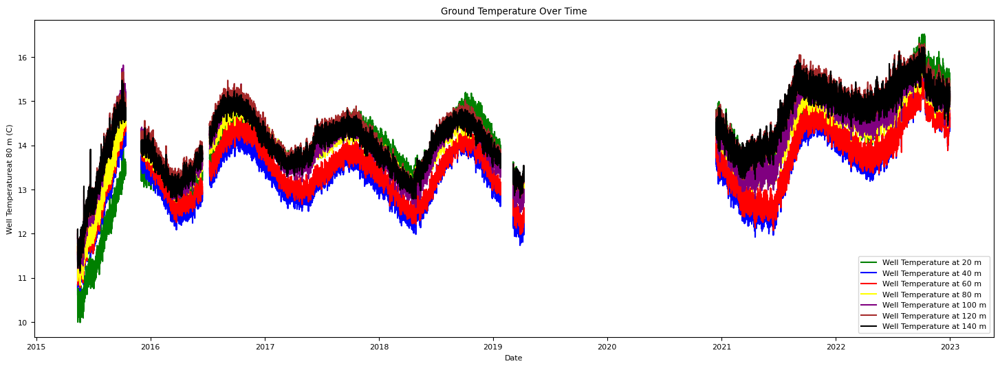

In [ ]:


plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 


plt.plot(TMW1_df20.index, TMW1_df20["Well Temperature"], color = "green", label = 'Well Temperature at 20 m')
plt.plot(TMW1_df40.index, TMW1_df40["Well Temperature"], color = "blue", label = 'Well Temperature at 40 m')
plt.plot(TMW1_df60.index, TMW1_df60["Well Temperature"], color = "red", label = 'Well Temperature at 60 m')
plt.plot(TMW1_df80.index, TMW1_df80["Well Temperature"], color = "yellow", label = 'Well Temperature at 80 m')
plt.plot(TMW1_df100.index, TMW1_df100["Well Temperature"], color = "purple", label = 'Well Temperature at 100 m')
plt.plot(TMW1_df120.index, TMW1_df120["Well Temperature"], color = "brown", label = 'Well Temperature at 120 m')
plt.plot(TMW1_df140.index, TMW1_df140["Well Temperature"], color = "black", label = 'Well Temperature at 140 m')


# Add labels and legends
plt.ylabel('Well Temperatureat 80 m (C)')
plt.xlabel('Date')
plt.title('Ground Temperature Over Time')


# Combine legends
plt.legend()

plt.show()

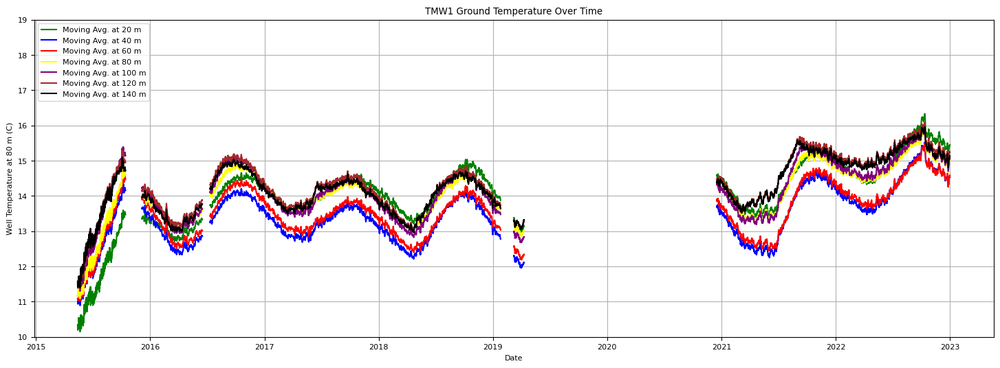

In [ ]:
# Set the window size for the moving average
window_size = 20  # Adjust the window size as needed

# Calculate the moving averages
TMW1_moving_avg20 = TMW1_df20["Well Temperature"].rolling(window=window_size).mean()
TMW1_moving_avg40 = TMW1_df40["Well Temperature"].rolling(window=window_size).mean()
TMW1_moving_avg60 = TMW1_df60["Well Temperature"].rolling(window=window_size).mean()
TMW1_moving_avg80 = TMW1_df80["Well Temperature"].rolling(window=window_size).mean()
TMW1_moving_avg100 = TMW1_df100["Well Temperature"].rolling(window=window_size).mean()
TMW1_moving_avg120 = TMW1_df120["Well Temperature"].rolling(window=window_size).mean()
TMW1_moving_avg140 = TMW1_df140["Well Temperature"].rolling(window=window_size).mean()

# Plot the original data and moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# plt.plot(TMW1_df20.index, TMW1_df20["Well Temperature"], color="green", label='Well Temperature at 20 m')
# plt.plot(TMW1_df40.index, TMW1_df40["Well Temperature"], color="blue", label='Well Temperature at 40 m')
# plt.plot(TMW1_df60.index, TMW1_df60["Well Temperature"], color="red", label='Well Temperature at 60 m')
# plt.plot(TMW1_df80.index, TMW1_df80["Well Temperature"], color="yellow", label='Well Temperature at 80 m')
# plt.plot(TMW1_df100.index, TMW1_df100["Well Temperature"], color="purple", label='Well Temperature at 100 m')
# plt.plot(TMW1_df120.index, TMW1_df120["Well Temperature"], color="brown", label='Well Temperature at 120 m')
# plt.plot(TMW1_df140.index, TMW1_df140["Well Temperature"], color="black", label='Well Temperature at 140 m')

# Plot the moving averages
plt.plot(TMW1_df20.index, TMW1_moving_avg20, color="green", label='Moving Avg. at 20 m')
plt.plot(TMW1_df40.index, TMW1_moving_avg40, color="blue", label='Moving Avg. at 40 m')
plt.plot(TMW1_df60.index, TMW1_moving_avg60, color="red", label='Moving Avg. at 60 m')
plt.plot(TMW1_df80.index, TMW1_moving_avg80, color="yellow", label='Moving Avg. at 80 m')
plt.plot(TMW1_df100.index, TMW1_moving_avg100, color="purple", label='Moving Avg. at 100 m')
plt.plot(TMW1_df120.index, TMW1_moving_avg120, color="brown", label='Moving Avg. at 120 m')
plt.plot(TMW1_df140.index, TMW1_moving_avg140, color="black", label='Moving Avg. at 140 m') 

# Add labels and legends
plt.ylabel('Well Temperature at 80 m (C)')
plt.xlabel('Date')
plt.title('TMW1 Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend(loc='upper left')

plt.show()

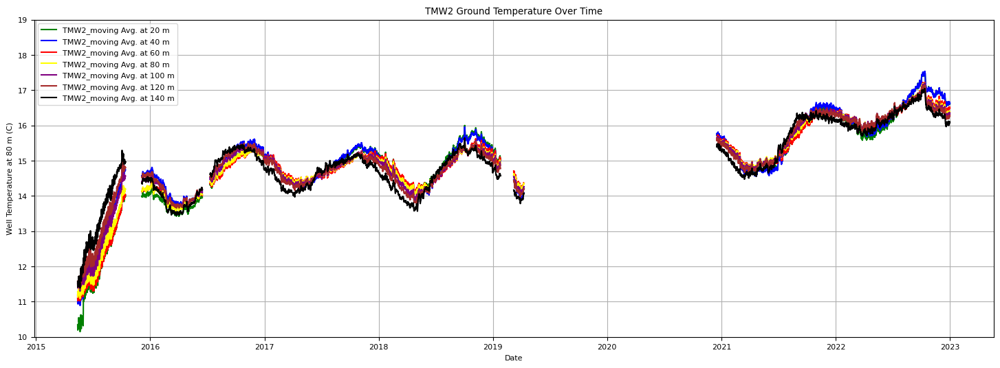

In [ ]:
# Set the window size for the TMW2_moving average
window_size = 20  # Adjust the window size as needed

# Calculate the TMW2_moving averages
TMW2_moving_avg20 = TMW2_df20["Well Temperature"].rolling(window=window_size).mean()
TMW2_moving_avg40 = TMW2_df40["Well Temperature"].rolling(window=window_size).mean()
TMW2_moving_avg60 = TMW2_df60["Well Temperature"].rolling(window=window_size).mean()
TMW2_moving_avg80 = TMW2_df80["Well Temperature"].rolling(window=window_size).mean()
TMW2_moving_avg100 = TMW2_df100["Well Temperature"].rolling(window=window_size).mean()
TMW2_moving_avg120 = TMW2_df120["Well Temperature"].rolling(window=window_size).mean()
TMW2_moving_avg140 = TMW2_df140["Well Temperature"].rolling(window=window_size).mean()

# Plot the original data and TMW2_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Plot the TMW2_moving averages
plt.plot(TMW2_df20.index, TMW2_moving_avg20, color="green", label='TMW2_moving Avg. at 20 m')
plt.plot(TMW2_df40.index, TMW2_moving_avg40, color="blue", label='TMW2_moving Avg. at 40 m')
plt.plot(TMW2_df60.index, TMW2_moving_avg60, color="red", label='TMW2_moving Avg. at 60 m')
plt.plot(TMW2_df80.index, TMW2_moving_avg80, color="yellow", label='TMW2_moving Avg. at 80 m')
plt.plot(TMW2_df100.index, TMW2_moving_avg100, color="purple", label='TMW2_moving Avg. at 100 m')
plt.plot(TMW2_df120.index, TMW2_moving_avg120, color="brown", label='TMW2_moving Avg. at 120 m')
plt.plot(TMW2_df140.index, TMW2_moving_avg140, color="black", label='TMW2_moving Avg. at 140 m') 

# Add labels and legends
plt.ylabel('Well Temperature at 80 m (C)')
plt.xlabel('Date')
plt.title('TMW2 Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend()

plt.show()

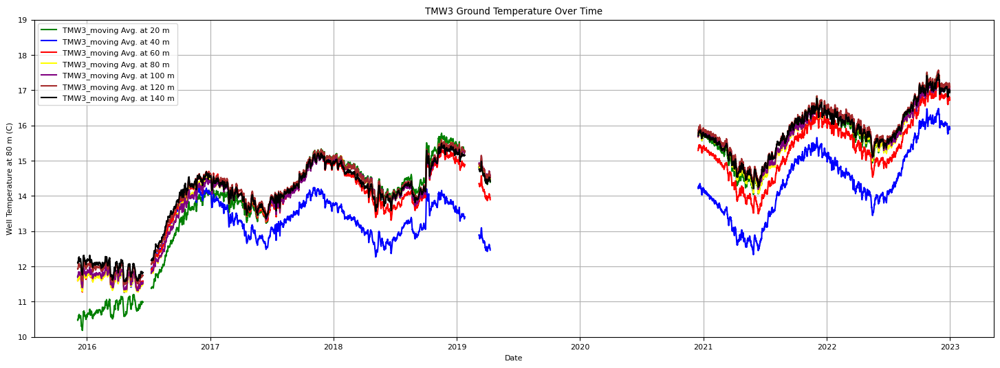

In [ ]:
# Set the window size for the TMW3_moving average
window_size = 20  # Adjust the window size as needed

# Calculate the TMW3_moving averages
TMW3_moving_avg20 = TMW3_df20["Well Temperature"].rolling(window=window_size).mean()
TMW3_moving_avg40 = TMW3_df40["Well Temperature"].rolling(window=window_size).mean()
TMW3_moving_avg60 = TMW3_df60["Well Temperature"].rolling(window=window_size).mean()
TMW3_moving_avg80 = TMW3_df80["Well Temperature"].rolling(window=window_size).mean()
TMW3_moving_avg100 = TMW3_df100["Well Temperature"].rolling(window=window_size).mean()
TMW3_moving_avg120 = TMW3_df120["Well Temperature"].rolling(window=window_size).mean()
TMW3_moving_avg140 = TMW3_df140["Well Temperature"].rolling(window=window_size).mean()

# Plot the original data and TMW3_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Plot the TMW3_moving averages
plt.plot(TMW3_df20.index, TMW3_moving_avg20, color="green", label='TMW3_moving Avg. at 20 m')
plt.plot(TMW3_df40.index, TMW3_moving_avg40, color="blue", label='TMW3_moving Avg. at 40 m')
plt.plot(TMW3_df60.index, TMW3_moving_avg60, color="red", label='TMW3_moving Avg. at 60 m')
plt.plot(TMW3_df80.index, TMW3_moving_avg80, color="yellow", label='TMW3_moving Avg. at 80 m')
plt.plot(TMW3_df100.index, TMW3_moving_avg100, color="purple", label='TMW3_moving Avg. at 100 m')
plt.plot(TMW3_df120.index, TMW3_moving_avg120, color="brown", label='TMW3_moving Avg. at 120 m')
plt.plot(TMW3_df140.index, TMW3_moving_avg140, color="black", label='TMW3_moving Avg. at 140 m') 

# Add labels and legends
plt.ylabel('Well Temperature at 80 m (C)')
plt.xlabel('Date')
plt.title('TMW3 Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend()

plt.show()

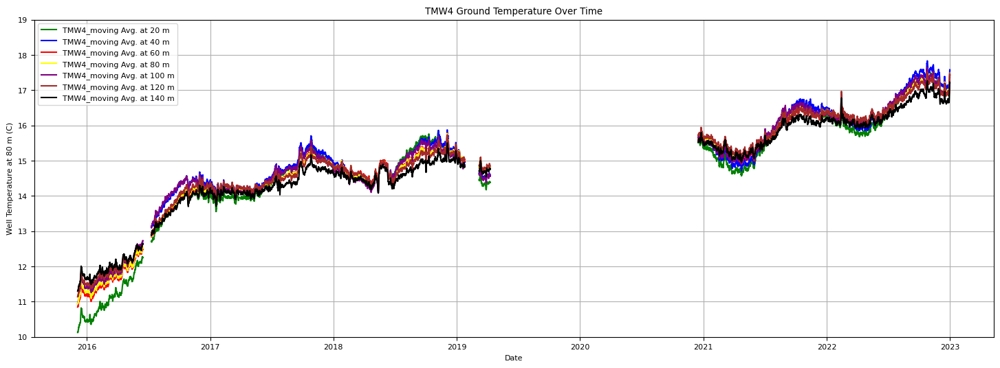

In [ ]:
# Set the window size for the TMW4_moving average
window_size = 20  # Adjust the window size as needed

# Calculate the TMW4_moving averages
TMW4_moving_avg20 = TMW4_df20["Well Temperature"].rolling(window=window_size).mean()
TMW4_moving_avg40 = TMW4_df40["Well Temperature"].rolling(window=window_size).mean()
TMW4_moving_avg60 = TMW4_df60["Well Temperature"].rolling(window=window_size).mean()
TMW4_moving_avg80 = TMW4_df80["Well Temperature"].rolling(window=window_size).mean()
TMW4_moving_avg100 = TMW4_df100["Well Temperature"].rolling(window=window_size).mean()
TMW4_moving_avg120 = TMW4_df120["Well Temperature"].rolling(window=window_size).mean()
TMW4_moving_avg140 = TMW4_df140["Well Temperature"].rolling(window=window_size).mean()

# Plot the original data and TMW4_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Plot the TMW4_moving averages
plt.plot(TMW4_df20.index, TMW4_moving_avg20, color="green", label='TMW4_moving Avg. at 20 m')
plt.plot(TMW4_df40.index, TMW4_moving_avg40, color="blue", label='TMW4_moving Avg. at 40 m')
plt.plot(TMW4_df60.index, TMW4_moving_avg60, color="red", label='TMW4_moving Avg. at 60 m')
plt.plot(TMW4_df80.index, TMW4_moving_avg80, color="yellow", label='TMW4_moving Avg. at 80 m')
plt.plot(TMW4_df100.index, TMW4_moving_avg100, color="purple", label='TMW4_moving Avg. at 100 m')
plt.plot(TMW4_df120.index, TMW4_moving_avg120, color="brown", label='TMW4_moving Avg. at 120 m')
plt.plot(TMW4_df140.index, TMW4_moving_avg140, color="black", label='TMW4_moving Avg. at 140 m') 

# Add labels and legends
plt.ylabel('Well Temperature at 80 m (C)')
plt.xlabel('Date')
plt.title('TMW4 Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend()

plt.show()

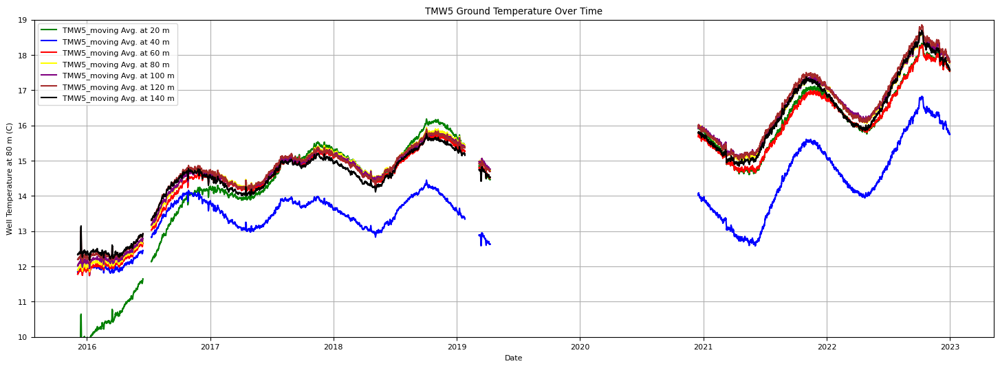

In [ ]:
# Set the window size for the TMW5_moving average
window_size = 20  # Adjust the window size as needed

# Calculate the TMW5_moving averages
TMW5_moving_avg20 = TMW5_df20["Well Temperature"].rolling(window=window_size).mean()
TMW5_moving_avg40 = TMW5_df40["Well Temperature"].rolling(window=window_size).mean()
TMW5_moving_avg60 = TMW5_df60["Well Temperature"].rolling(window=window_size).mean()
TMW5_moving_avg80 = TMW5_df80["Well Temperature"].rolling(window=window_size).mean()
TMW5_moving_avg100 = TMW5_df100["Well Temperature"].rolling(window=window_size).mean()
TMW5_moving_avg120 = TMW5_df120["Well Temperature"].rolling(window=window_size).mean()
TMW5_moving_avg140 = TMW5_df140["Well Temperature"].rolling(window=window_size).mean()

# Plot the original data and TMW5_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Plot the TMW5_moving averages
plt.plot(TMW5_df20.index, TMW5_moving_avg20, color="green", label='TMW5_moving Avg. at 20 m')
plt.plot(TMW5_df40.index, TMW5_moving_avg40, color="blue", label='TMW5_moving Avg. at 40 m')
plt.plot(TMW5_df60.index, TMW5_moving_avg60, color="red", label='TMW5_moving Avg. at 60 m')
plt.plot(TMW5_df80.index, TMW5_moving_avg80, color="yellow", label='TMW5_moving Avg. at 80 m')
plt.plot(TMW5_df100.index, TMW5_moving_avg100, color="purple", label='TMW5_moving Avg. at 100 m')
plt.plot(TMW5_df120.index, TMW5_moving_avg120, color="brown", label='TMW5_moving Avg. at 120 m')
plt.plot(TMW5_df140.index, TMW5_moving_avg140, color="black", label='TMW5_moving Avg. at 140 m') 

# Add labels and legends
plt.ylabel('Well Temperature at 80 m (C)')
plt.xlabel('Date')
plt.title('TMW5 Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend()

plt.show()

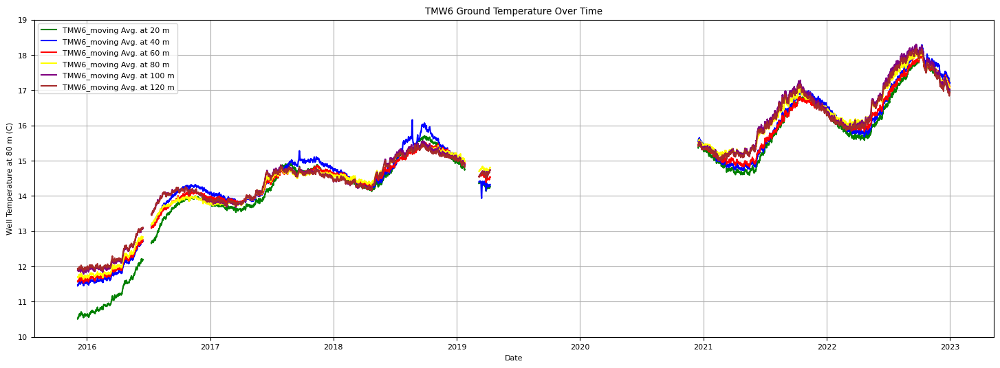

In [ ]:
# Set the window size for the TMW6_moving average
window_size = 20  # Adjust the window size as needed

# Calculate the TMW6_moving averages
TMW6_moving_avg20 = TMW6_df20["Well Temperature"].rolling(window=window_size).mean()
TMW6_moving_avg40 = TMW6_df40["Well Temperature"].rolling(window=window_size).mean()
TMW6_moving_avg60 = TMW6_df60["Well Temperature"].rolling(window=window_size).mean()
TMW6_moving_avg80 = TMW6_df80["Well Temperature"].rolling(window=window_size).mean()
TMW6_moving_avg100 = TMW6_df100["Well Temperature"].rolling(window=window_size).mean()
TMW6_moving_avg120 = TMW6_df120["Well Temperature"].rolling(window=window_size).mean()
#TMW6_moving_avg140 = TMW6_df140["Well Temperature"].rolling(window=window_size).mean()

# Plot the original data and TMW6_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Plot the TMW6_moving averages
plt.plot(TMW6_df20.index, TMW6_moving_avg20, color="green", label='TMW6_moving Avg. at 20 m')
plt.plot(TMW6_df40.index, TMW6_moving_avg40, color="blue", label='TMW6_moving Avg. at 40 m')
plt.plot(TMW6_df60.index, TMW6_moving_avg60, color="red", label='TMW6_moving Avg. at 60 m')
plt.plot(TMW6_df80.index, TMW6_moving_avg80, color="yellow", label='TMW6_moving Avg. at 80 m')
plt.plot(TMW6_df100.index, TMW6_moving_avg100, color="purple", label='TMW6_moving Avg. at 100 m')
plt.plot(TMW6_df120.index, TMW6_moving_avg120, color="brown", label='TMW6_moving Avg. at 120 m')
#plt.plot(TMW6_df140.index, TMW6_moving_avg140, color="black", label='TMW6_moving Avg. at 140 m') 

# Add labels and legends
plt.ylabel('Well Temperature at 80 m (C)')
plt.xlabel('Date')
plt.title('TMW6 Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend()

plt.show()

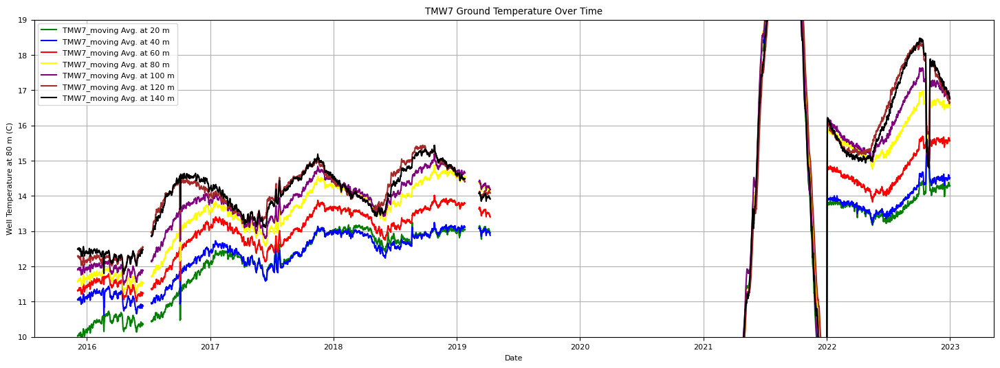

In [ ]:
# Set the window size for the TMW7_moving average
window_size = 20  # Adjust the window size as needed

# Calculate the TMW7_moving averages
TMW7_moving_avg20 = TMW7_df20["Well Temperature"].rolling(window=window_size).mean()
TMW7_moving_avg40 = TMW7_df40["Well Temperature"].rolling(window=window_size).mean()
TMW7_moving_avg60 = TMW7_df60["Well Temperature"].rolling(window=window_size).mean()
TMW7_moving_avg80 = TMW7_df80["Well Temperature"].rolling(window=window_size).mean()
TMW7_moving_avg100 = TMW7_df100["Well Temperature"].rolling(window=window_size).mean()
TMW7_moving_avg120 = TMW7_df120["Well Temperature"].rolling(window=window_size).mean()
TMW7_moving_avg140 = TMW7_df140["Well Temperature"].rolling(window=window_size).mean()

# Plot the original data and TMW7_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Plot the TMW7_moving averages
plt.plot(TMW7_df20.index, TMW7_moving_avg20, color="green", label='TMW7_moving Avg. at 20 m')
plt.plot(TMW7_df40.index, TMW7_moving_avg40, color="blue", label='TMW7_moving Avg. at 40 m')
plt.plot(TMW7_df60.index, TMW7_moving_avg60, color="red", label='TMW7_moving Avg. at 60 m')
plt.plot(TMW7_df80.index, TMW7_moving_avg80, color="yellow", label='TMW7_moving Avg. at 80 m')
plt.plot(TMW7_df100.index, TMW7_moving_avg100, color="purple", label='TMW7_moving Avg. at 100 m')
plt.plot(TMW7_df120.index, TMW7_moving_avg120, color="brown", label='TMW7_moving Avg. at 120 m')
plt.plot(TMW7_df140.index, TMW7_moving_avg140, color="black", label='TMW7_moving Avg. at 140 m') 

# Add labels and legends
plt.ylabel('Well Temperature at 80 m (C)')
plt.xlabel('Date')
plt.title('TMW7 Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend()

plt.show()

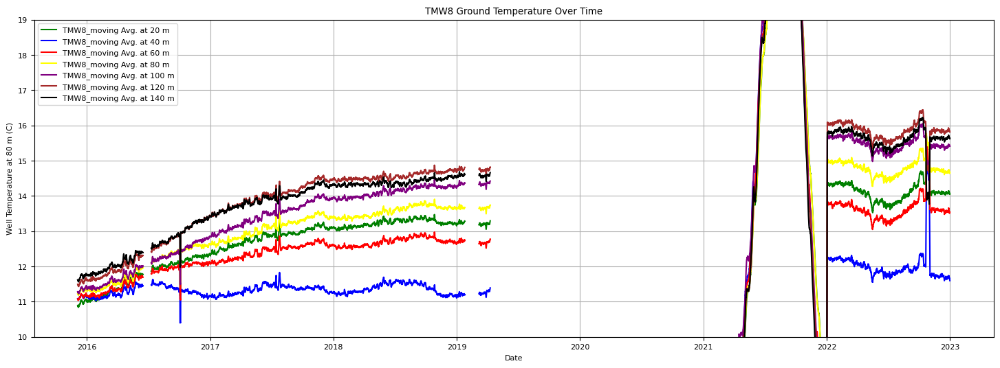

In [ ]:
# Set the window size for the TMW8_moving average
window_size = 20  # Adjust the window size as needed

# Calculate the TMW8_moving averages
TMW8_moving_avg20 = TMW8_df20["Well Temperature"].rolling(window=window_size).mean()
TMW8_moving_avg40 = TMW8_df40["Well Temperature"].rolling(window=window_size).mean()
TMW8_moving_avg60 = TMW8_df60["Well Temperature"].rolling(window=window_size).mean()
TMW8_moving_avg80 = TMW8_df80["Well Temperature"].rolling(window=window_size).mean()
TMW8_moving_avg100 = TMW8_df100["Well Temperature"].rolling(window=window_size).mean()
TMW8_moving_avg120 = TMW8_df120["Well Temperature"].rolling(window=window_size).mean()
TMW8_moving_avg140 = TMW8_df140["Well Temperature"].rolling(window=window_size).mean()

# Plot the original data and TMW8_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Plot the TMW8_moving averages
plt.plot(TMW8_df20.index, TMW8_moving_avg20, color="green", label='TMW8_moving Avg. at 20 m')
plt.plot(TMW8_df40.index, TMW8_moving_avg40, color="blue", label='TMW8_moving Avg. at 40 m')
plt.plot(TMW8_df60.index, TMW8_moving_avg60, color="red", label='TMW8_moving Avg. at 60 m')
plt.plot(TMW8_df80.index, TMW8_moving_avg80, color="yellow", label='TMW8_moving Avg. at 80 m')
plt.plot(TMW8_df100.index, TMW8_moving_avg100, color="purple", label='TMW8_moving Avg. at 100 m')
plt.plot(TMW8_df120.index, TMW8_moving_avg120, color="brown", label='TMW8_moving Avg. at 120 m')
plt.plot(TMW8_df140.index, TMW8_moving_avg140, color="black", label='TMW8_moving Avg. at 140 m') 

# Add labels and legends
plt.ylabel('Well Temperature at 80 m (C)')
plt.xlabel('Date')
plt.title('TMW8 Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend(loc='upper left')

plt.show()

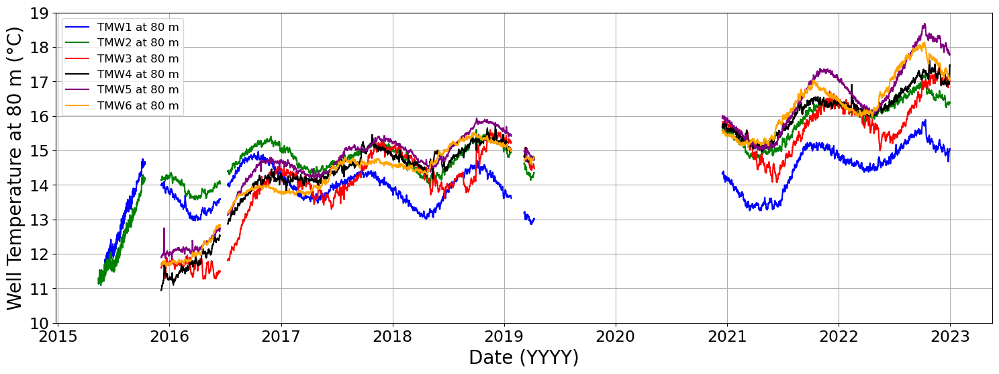

In [ ]:
# Plot the original data and TMW4_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# # Plot the TMW4_moving averages
plt.plot(TMW1_df80.index, TMW1_moving_avg80, color="blue", label='TMW1 at 80 m')
plt.plot(TMW2_df80.index, TMW2_moving_avg80, color="green", label='TMW2 at 80 m')
plt.plot(TMW3_df80.index, TMW3_moving_avg80, color="red", label='TMW3 at 80 m')
plt.plot(TMW4_df80.index, TMW4_moving_avg80, color="black", label='TMW4 at 80 m')
plt.plot(TMW5_df80.index, TMW5_moving_avg80, color="purple", label='TMW5 at 80 m')
plt.plot(TMW6_df80.index, TMW6_moving_avg80, color="orange", label='TMW6 at 80 m')
#plt.plot(TMW7_df80.index, TMW7_moving_avg80, color="brown", label='TMW7 at 80 m')
#plt.plot(TMW8_df80.index, TMW8_moving_avg80, color="pink", label='TMW8 at 80 m')


# Add labels and legends
plt.ylabel('Well Temperature at 80 m (°C)', fontsize=20)
plt.xlabel('Date (YYYY)', fontsize=20)
#plt.title('80 m Depth Ground Temperature Over Time', fontsize=27)
plt.tick_params(axis='y', labelsize=17)
plt.tick_params(axis='x', which='major', labelsize=17)
plt.grid()
plt.ylim(10,19)
#plt.xlim(pd.Timestamp('2022-01-01'), pd.Timestamp('2022-12-31'))
#plt.xticks(rotation=45)

# Combine legends
plt.legend(loc='upper left', fontsize=12)

plt.show()

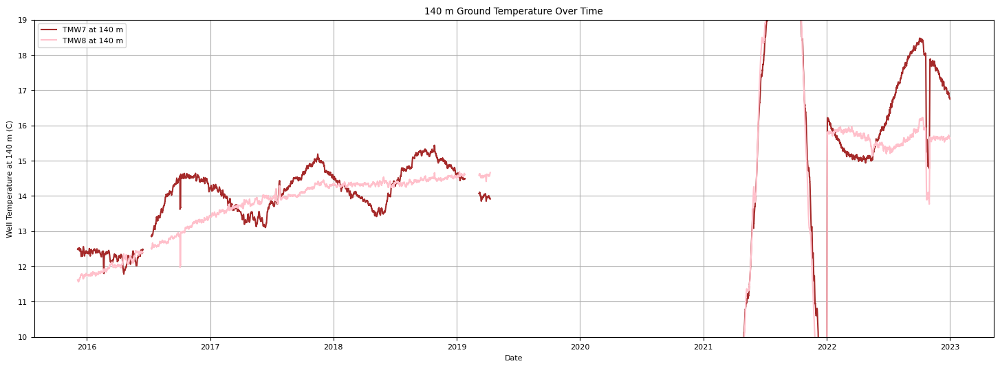

In [ ]:
# Plot the original data and TMW4_moving averages
plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18, 6)

# Plot the TMW4_moving averages
# plt.plot(TMW1_df140.index, TMW1_moving_avg140, color="blue", label='TMW1 at 140 m')
# plt.plot(TMW2_df140.index, TMW2_moving_avg140, color="green", label='TMW2 at 140 m')
# plt.plot(TMW3_df140.index, TMW3_moving_avg140, color="red", label='TMW3 at 140 m')
# plt.plot(TMW4_df140.index, TMW4_moving_avg140, color="black", label='TMW4 at 140 m')
# plt.plot(TMW5_df140.index, TMW5_moving_avg140, color="purple", label='TMW5 at 140 m')
#plt.plot(TMW6_df140.index, TMW6_moving_avg140, color="green", label='TMW2 at 140 m')
plt.plot(TMW7_df140.index, TMW7_moving_avg140, color="brown", label='TMW7 at 140 m')
plt.plot(TMW8_df140.index, TMW8_moving_avg140, color="pink", label='TMW8 at 140 m')


# Add labels and legends
plt.ylabel('Well Temperature at 140 m (C)')
plt.xlabel('Date')
plt.title('140 m Ground Temperature Over Time')
plt.grid()
plt.ylim(10,19)

# Combine legends
plt.legend()

plt.show()

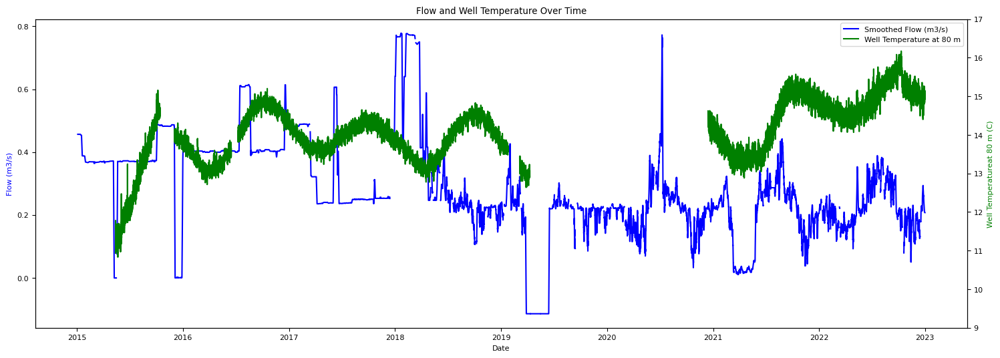

In [ ]:
# Plot the original and smoothed data
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
#ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s"], color = "blue", label = 'Flow (m3/s)')
ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s smoothed"], color="blue", label='Smoothed Flow (m3/s)')

ax2.plot(TMW1_df80.index, TMW1_df80["Well Temperature"], color = "green", label = 'Well Temperature at 80 m')


# Add labels and legends
ax1.set_ylabel('Flow (m3/s)', color='blue')
ax2.set_ylabel('Well Temperatureat 80 m (C)', color='green')
ax1.set_xlabel('Date')
ax1.set_title('Flow and Well Temperature Over Time')

ax2.set_ylim(9, 17)

# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right')

plt.show()

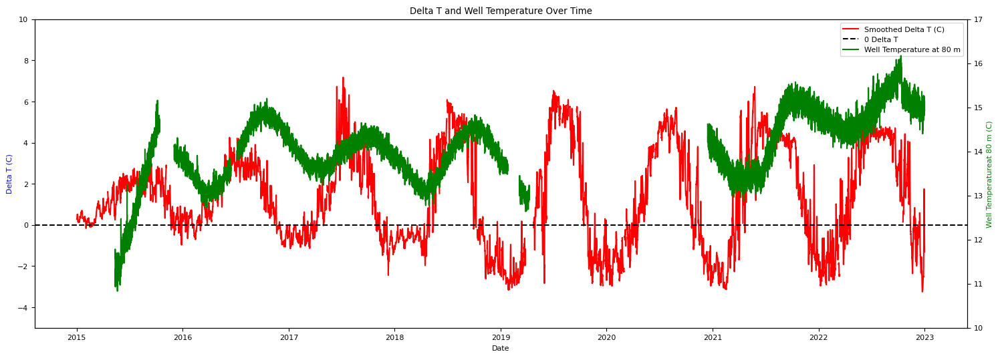

In [ ]:
# Plot the original and smoothed data
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.rcParams['font.size'] = 8
plt.rcParams["figure.figsize"] = (18,6) 
#ax1.plot(df_2015_2022.index, df_2015_2022["BF4 Flow m3/s"], color = "blue", label = 'Flow (m3/s)')
ax1.plot(df_2015_2022.index, df_2015_2022["deltaT smoothed"], color="red", label='Smoothed Delta T (C)')

ax2.plot(TMW1_df80.index, TMW1_df80["Well Temperature"], color = "green", label = 'Well Temperature at 80 m')

ax1.axhline(y=0, color='black', linestyle='--', label = '0 Delta T')

# Add labels and legends
ax1.set_ylabel('Delta T (C)', color='blue')
ax2.set_ylabel('Well Temperatureat 80 m (C)', color='green')
ax1.set_xlabel('Date')
ax1.set_title('Delta T and Well Temperature Over Time')

ax2.set_ylim(10, 17)
ax1.set_ylim(-5,10)

# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right')

plt.show()

In [ ]:
TMW1_last_120 = TMW1[119, -1]
TMW2_last_120 = TMW2[119, -1]
TMW3_last_120 = TMW3[119, -1]
TMW4_last_120 = TMW4[119, -1]
TMW5_last_120 = TMW5[119, -1]
TMW6_last_120 = TMW6[119, -1]
TMW7_last_120 = TMW7[119, -1]
TMW8_last_120 = TMW8[119, -1]

print(TMW7_last_120)
print(TMW8_last_120)


16.5680578169019
15.8886875797272


In [ ]:
TMW1_last_80 = TMW1[79, -1]
TMW2_last_80 = TMW2[79, -1]
TMW3_last_80 = TMW3[79, -1]
TMW4_last_80 = TMW4[79, -1]
TMW5_last_80 = TMW5[79, -1]
TMW6_last_80 = TMW6[79, -1]
TMW7_last_80 = TMW7[79, -1]
TMW8_last_80 = TMW8[79, -1]

In [ ]:
TMW1_last_40 = TMW1[39, -1]
TMW2_last_40 = TMW2[39, -1]
TMW3_last_40 = TMW3[39, -1]
TMW4_last_40 = TMW4[39, -1]
TMW5_last_40 = TMW5[39, -1]
TMW6_last_40 = TMW6[39, -1]
TMW7_last_40 = TMW7[39, -1]
TMW8_last_40 = TMW8[39, -1]

In [ ]:
TMW1_last_3 = TMW1[2, -1]
TMW2_last_3 = TMW2[2, -1]
TMW3_last_3 = TMW3[2, -1]
TMW4_last_3 = TMW4[2, -1]
TMW5_last_3 = TMW5[2, -1]
TMW6_last_3 = TMW6[2, -1]
TMW7_last_3 = TMW7[2, -1]
TMW8_last_3 = TMW8[2, -1]

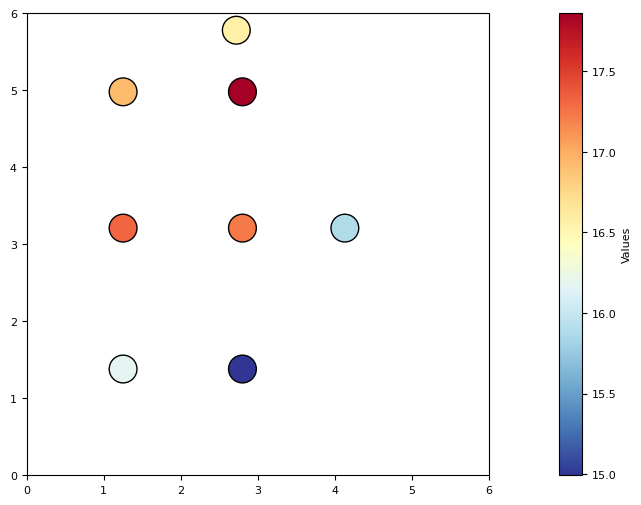

In [ ]:
# Your data
x = np.array([2.80, 1.25, 2.80, 1.25, 2.80, 1.25, 2.72, 4.13])
y = np.array([1.38, 1.38, 3.21, 3.21, 4.98, 4.98, 5.78, 3.21])
values = np.array([TMW1_last_120, TMW2_last_120, TMW3_last_120, TMW4_last_120, TMW5_last_120, TMW6_last_120, TMW7_last_120, TMW8_last_120])

# Create a map
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})

# Scatter plot the data
sc = ax.scatter(x, y, c=values, cmap='RdYlBu_r', s=400, edgecolors='k', linewidth=1, transform=ccrs.PlateCarree())

# Add a colorbar
cbar = plt.colorbar(sc, orientation='vertical', label='Values')

# Set numeric ticks on x and y axes
plt.xticks(np.arange(0, 7, 1.0))
plt.yticks(np.arange(0, 7, 1.0))


# Show the plot
plt.show()

In [ ]:
well_data = {
    TMW1_df80,
    TMW2_df80,
    TMW3_df80,
    TMW4_df80,
    TMW5_df80,
    TMW6_df80,
    TMW7_df80,
    TMW8_df80,
}

# Filter data to include only 2021 and 2022
for well_name, data in well_data.items():
    well_data[well_name] = data[(data['Time'] >= '2021-01-01') & (data['Time'] <= '2022-12-31')]


# Create a scatter plot
fig, ax = plt.subplots()

# Set axis labels
ax.set_xlabel('Arbitrary X')
ax.set_ylabel('Arbitrary Y')

# Set numeric ticks on x and y axes
plt.xticks(np.arange(0, 7, 1.0))
plt.yticks(np.arange(0, 7, 1.0))

# Function to update the scatter plot for each frame
def update(frame):
    ax.clear()
    
    # Plot the scatter plot for each well
    for well_name, data in well_data.items():
        x = np.array([2.80, 1.25, 2.80, 1.25, 2.80, 1.25, 2.72, 4.13])
        y = np.array([1.38, 1.38, 3.21, 3.21, 4.98, 4.98, 5.78, 3.21])
        values = data['Well Temperature'].iloc[frame]  # Access the value directly without iloc
        
        sc = ax.scatter(x, y, c=values, cmap='RdYlBu_r', s=200, edgecolors='k', linewidth=1)
    
    # Add a colorbar
    cbar = plt.colorbar(sc, orientation='vertical', label='Values')

# Create the animation
frames = len(well_data["TMW1_80"])  # Assuming all datasets have the same length
animation = FuncAnimation(fig, update, frames=frames, interval=200, repeat=False)

# Show the animation
plt.show()

TypeError: unhashable type: 'DataFrame'

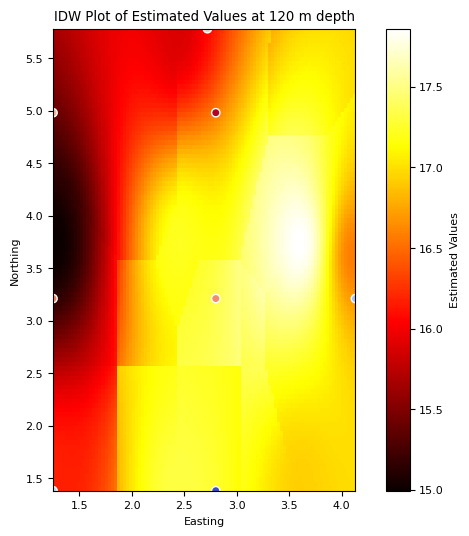

In [ ]:
# Define the inverse distance weighting function
def inverse_distance_weighting(x, y, values, xi, yi, power=2, num_points=3):
    distances = np.sqrt((x - xi) ** 2 + (y - yi) ** 2)
    sorted_indices = np.argsort(distances)
    sum_weights = 0
    sum_weighted_values = 0

    for i in range(num_points):
        index = sorted_indices[i]
        distance = distances[index]
        if distance == 0:
            return values[index]
        weight = 1.0 / distance ** power
        sum_weights += weight
        sum_weighted_values += values[index] * weight

    if sum_weights == 0:
        return np.mean(values)
    else:
        return sum_weighted_values / sum_weights

# Given data
x = np.array([2.80, 1.25, 2.80, 1.25, 2.80, 1.25, 2.72, 4.13])
y = np.array([1.38, 1.38, 3.21, 3.21, 4.98, 4.98, 5.78, 3.21])
values = np.array([TMW1_last_120, TMW2_last_120, TMW3_last_120, TMW4_last_120, TMW5_last_120, TMW6_last_120, TMW7_last_120, TMW8_last_120])

# Create a grid of points to estimate values using IDW
xi = np.linspace(x.min(), x.max(), 100)  # X coordinates for the grid
yi = np.linspace(y.min(), y.max(), 100)  # Y coordinates for the grid
xi, yi = np.meshgrid(xi, yi)

# Estimate values using IDW for each point on the grid
zi = np.zeros_like(xi)
for i in range(xi.shape[0]):
    for j in range(xi.shape[1]):
        zi[i, j] = inverse_distance_weighting(x, y, values, xi[i, j], yi[i, j])

# Plot the IDW values as a heatmap
plt.figure(figsize=(8, 6))
plt.imshow(zi.T, extent=(x.min(), x.max(), y.min(), y.max()), origin='lower', cmap='hot')
plt.colorbar(label='Estimated Values')
plt.scatter(x, y, c=values, cmap='coolwarm', edgecolors='white')  # Overlay observed points
plt.xlabel('Easting')
plt.ylabel('Northing')
plt.title('IDW Plot of Estimated Values at 120 m depth')
plt.show()

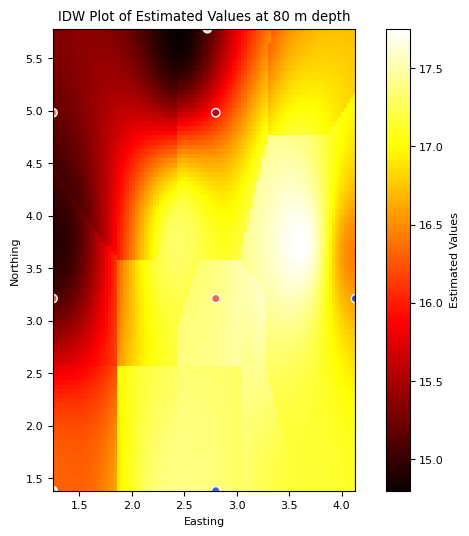

In [ ]:
# Define the inverse distance weighting function
def inverse_distance_weighting(x, y, values, xi, yi, power=2, num_points=3):
    distances = np.sqrt((x - xi) ** 2 + (y - yi) ** 2)
    sorted_indices = np.argsort(distances)
    sum_weights = 0
    sum_weighted_values = 0

    for i in range(num_points):
        index = sorted_indices[i]
        distance = distances[index]
        if distance == 0:
            return values[index]
        weight = 1.0 / distance ** power
        sum_weights += weight
        sum_weighted_values += values[index] * weight

    if sum_weights == 0:
        return np.mean(values)
    else:
        return sum_weighted_values / sum_weights

# Given data
x = np.array([2.80, 1.25, 2.80, 1.25, 2.80, 1.25, 2.72, 4.13])
y = np.array([1.38, 1.38, 3.21, 3.21, 4.98, 4.98, 5.78, 3.21])
values = np.array([TMW1_last_80, TMW2_last_80, TMW3_last_80, TMW4_last_80, TMW5_last_80, TMW6_last_80, TMW7_last_80, TMW8_last_80])

# Create a grid of points to estimate values using IDW
xi = np.linspace(x.min(), x.max(), 100)  # X coordinates for the grid
yi = np.linspace(y.min(), y.max(), 100)  # Y coordinates for the grid
xi, yi = np.meshgrid(xi, yi)

# Estimate values using IDW for each point on the grid
zi = np.zeros_like(xi)
for i in range(xi.shape[0]):
    for j in range(xi.shape[1]):
        zi[i, j] = inverse_distance_weighting(x, y, values, xi[i, j], yi[i, j])

# Plot the IDW values as a heatmap
plt.figure(figsize=(8, 6))
plt.imshow(zi.T, extent=(x.min(), x.max(), y.min(), y.max()), origin='lower', cmap='hot')
plt.colorbar(label='Estimated Values')
plt.scatter(x, y, c=values, cmap='coolwarm', edgecolors='white')  # Overlay observed points
plt.xlabel('Easting')
plt.ylabel('Northing')
plt.title('IDW Plot of Estimated Values at 80 m depth')
plt.show()

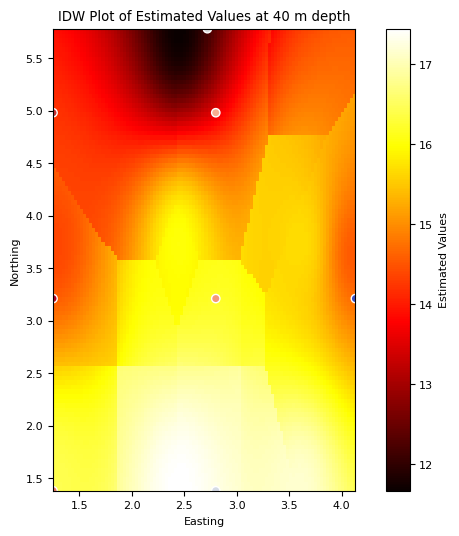

In [ ]:
# Define the inverse distance weighting function
def inverse_distance_weighting(x, y, values, xi, yi, power=2, num_points=3):
    distances = np.sqrt((x - xi) ** 2 + (y - yi) ** 2)
    sorted_indices = np.argsort(distances)
    sum_weights = 0
    sum_weighted_values = 0

    for i in range(num_points):
        index = sorted_indices[i]
        distance = distances[index]
        if distance == 0:
            return values[index]
        weight = 1.0 / distance ** power
        sum_weights += weight
        sum_weighted_values += values[index] * weight

    if sum_weights == 0:
        return np.mean(values)
    else:
        return sum_weighted_values / sum_weights

# Given data
x = np.array([2.80, 1.25, 2.80, 1.25, 2.80, 1.25, 2.72, 4.13])
y = np.array([1.38, 1.38, 3.21, 3.21, 4.98, 4.98, 5.78, 3.21])
values = np.array([TMW1_last_40, TMW2_last_40, TMW3_last_40, TMW4_last_40, TMW5_last_40, TMW6_last_40, TMW7_last_40, TMW8_last_40])

# Create a grid of points to estimate values using IDW
xi = np.linspace(x.min(), x.max(), 100)  # X coordinates for the grid
yi = np.linspace(y.min(), y.max(), 100)  # Y coordinates for the grid
xi, yi = np.meshgrid(xi, yi)

# Estimate values using IDW for each point on the grid
zi = np.zeros_like(xi)
for i in range(xi.shape[0]):
    for j in range(xi.shape[1]):
        zi[i, j] = inverse_distance_weighting(x, y, values, xi[i, j], yi[i, j])

# Plot the IDW values as a heatmap
plt.figure(figsize=(8, 6))
plt.imshow(zi.T, extent=(x.min(), x.max(), y.min(), y.max()), origin='lower', cmap='hot')
plt.colorbar(label='Estimated Values')
plt.scatter(x, y, c=values, cmap='coolwarm', edgecolors='white')  # Overlay observed points
plt.xlabel('Easting')
plt.ylabel('Northing')
plt.title('IDW Plot of Estimated Values at 40 m depth')
plt.show()

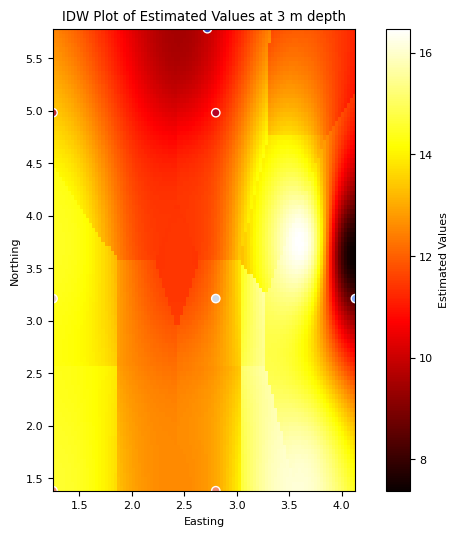

In [ ]:
# Define the inverse distance weighting function
def inverse_distance_weighting(x, y, values, xi, yi, power=2, num_points=3):
    distances = np.sqrt((x - xi) ** 2 + (y - yi) ** 2)
    sorted_indices = np.argsort(distances)
    sum_weights = 0
    sum_weighted_values = 0

    for i in range(num_points):
        index = sorted_indices[i]
        distance = distances[index]
        if distance == 0:
            return values[index]
        weight = 1.0 / distance ** power
        sum_weights += weight
        sum_weighted_values += values[index] * weight

    if sum_weights == 0:
        return np.mean(values)
    else:
        return sum_weighted_values / sum_weights

# Given data
x = np.array([2.80, 1.25, 2.80, 1.25, 2.80, 1.25, 2.72, 4.13])
y = np.array([1.38, 1.38, 3.21, 3.21, 4.98, 4.98, 5.78, 3.21])
values = np.array([TMW1_last_3, TMW2_last_3, TMW3_last_3, TMW4_last_3, TMW5_last_3, TMW6_last_3, TMW7_last_3, TMW8_last_3])

# Create a grid of points to estimate values using IDW
xi = np.linspace(x.min(), x.max(), 100)  # X coordinates for the grid
yi = np.linspace(y.min(), y.max(), 100)  # Y coordinates for the grid
xi, yi = np.meshgrid(xi, yi)

# Estimate values using IDW for each point on the grid
zi = np.zeros_like(xi)
for i in range(xi.shape[0]):
    for j in range(xi.shape[1]):
        zi[i, j] = inverse_distance_weighting(x, y, values, xi[i, j], yi[i, j])

# Plot the IDW values as a heatmap
plt.figure(figsize=(8, 6))
plt.imshow(zi.T, extent=(x.min(), x.max(), y.min(), y.max()), origin='lower', cmap='hot')
plt.colorbar(label='Estimated Values')
plt.scatter(x, y, c=values, cmap='coolwarm', edgecolors='white')  # Overlay observed points
plt.xlabel('Easting')
plt.ylabel('Northing')
plt.title('IDW Plot of Estimated Values at 3 m depth')
plt.show()

In [ ]:
print(TMW1_df80)

                     Well Temperature
2015-05-13 19:40:48         11.574000
2015-05-13 19:55:12         11.782000
2015-05-13 20:09:36         11.656000
2015-05-13 20:38:24         11.443000
2015-05-13 20:52:48         11.384000
...                               ...
2022-12-31 13:25:02         15.151714
2022-12-31 15:45:04         15.035285
2022-12-31 18:05:01         15.117561
2022-12-31 20:25:00         15.097339
2022-12-31 22:45:05         14.927248

[36911 rows x 1 columns]


In [ ]:
frames = [data_frame_2021, data_frame_2022]

df_2022_2021 = pd.concat(frames)

# Save the concatenated DataFrame to a CSV file
df_2022_2021.to_csv('df_2022_2021.csv', index=False)


In [ ]:
plt.plot(data_frame)

In [ ]:
#Sum energy exchanged for 2022 for BF4
BF4_2021_Sum = data_frame_2021['BF4 Energy Exchanged Abs (TJ)'].sum()
print(BF4_2021_Sum)

80.91192529574359


/var/folders/6z/vjf96zgx6yl343_z2gl8z0qc0000gn/T/ipykernel_22860/2020087093.py:2: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  january_2022_data = data_frame_2022['2022-07']


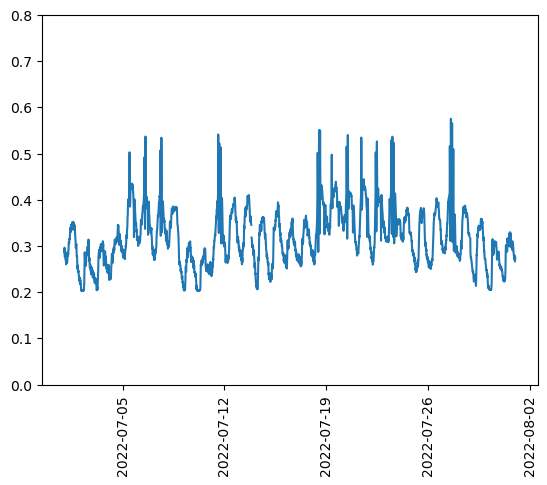

In [ ]:
# Assuming data_frame_2022 contains timestamps in datetime format
january_2022_data = data_frame_2022['2022-07']

plt.plot(january_2022_data.index, january_2022_data['BF4 Flow m3/s'])

# Set x ticks once a week
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.ylim(0,0.8)

# Rotate the x ticks by 90 degrees
plt.xticks(rotation=90)

plt.show()

Data Taken from Spitler and Gehlin (2019)

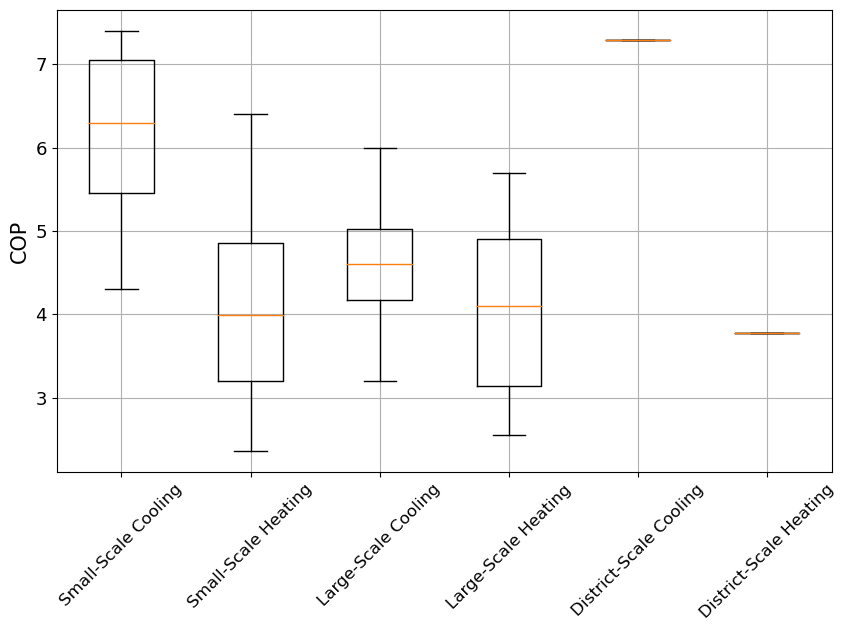

In [ ]:
residential_cooling_COP = [6.3, 7.4, 6.8, 7.3, 5.6, 5.3, 4.3]
residential_heating_COP = [3.5, 6.4, 6.4, 5.6, 5.4, 4.6, 5.4, 4.1, 4.7, 4.0,
                           4.9, 5.2, 4.4, 6.2, 4.64, 3.76, 3.98, 3.11,
                           2.36, 3.46, 2.88, 2.95, 4.11, 
                           3.2, 2.7, 3.22, 2.85, 3.15, 3.21, 3.48]

building_cooling_COP = [4.5, 3.2, 6.0, 4.7]
building_heating_COP = [4.9, 4.1, 5.6, 3.5, 5.7, 4.6, 2.55, 3.14, 3.1]

campus_cooling_COP = [7.29]
campus_heating_COP = [3.78]


data = [
    residential_cooling_COP,
    residential_heating_COP,
    building_cooling_COP,
    building_heating_COP,
    campus_cooling_COP,
    campus_heating_COP
]

labels = [
    'Small-Scale Cooling',
    'Small-Scale Heating',
    'Large-Scale Cooling',
    'Large-Scale Heating',
    'District-Scale Cooling',
    'District-Scale Heating'
]

plt.figure(figsize=(10,6))
plt.boxplot(data, labels=labels)
#plt.title('Boxplot of COP (Coefficient of Performance)')
plt.ylabel('COP', fontsize=15)
plt.tick_params(axis='y', labelsize=13)
plt.tick_params(axis='x', which='major', labelsize=12)
plt.xticks(rotation=45)
plt.grid(True)
plt.show()